In [1]:
%load_ext line_profiler
import mpld3
mpld3.enable_notebook()

In [2]:
%matplotlib nbagg

import jefimenko
import pdb
import numpy as np

Jefimenko version 0.0.6
Julia


In [3]:
def test_charge_1(print_all=False):
    mapping = jefimenko.Grid(delta=[1, 1, 1],  # this is the size of a step in x, y and z in meters
                size=[10, 1, 1],  # this is the size of the grid in meters
                time=10 * 3.36 * 10**-9,  # this is the length of a simulation in secounds
                delta_t=3.36 * 10**-9,  # this is the size of a full time step
        )
    pass_count_E = 0
    pass_count_H = 0
    fail_count_E  = 0
    fail_count_H  = 0
 

    count = mapping.Add_Charge([0], Q = 1, count=True)
    
    if print_all is True:
        jefimenko.plot_grid(mapping)

    jefimenko.simulate(mapping)

    if(mapping.grid['E'][0][1][0][0] == [0, 0, 0]):
        if print_all == True:
            print("time == 0 R == 1 E field PASS")
        pass_count_E = pass_count_E + 1
    else:
        if print_all == True:
            print("time = 0 R == 1 E field FAIL")
        fail_count_E = fail_count_E + 1

    if(mapping.grid['H'][0][1][0][0] == [0, 0, 0]):
        if print_all == True:
            print("time == 0 R == 1 H field PASS")
        pass_count_H = pass_count_H + 1
    else:
        if print_all == True:
            print("time == 0 R == 1 H field FAIL")
        fail_count_H = Fail_count_H + 1

    test_array = [8987551787.368176, 0, 0]

    if (np.array(mapping.grid['E'][1][1][0][0]) - np.array(test_array) < .01).all():
        if print_all == True:
            percent = (np.linalg.norm(mapping.grid['E'][1][1][0][0] - 8987551787.368176) / 8987551787.368176)
            print("time == 1 R == 1 E filed PASS")
        pass_count_E = pass_count_E + 1
    else:
        if print_all == True:
            print("time == 0 R == 1 E field FAIL")   
        fail_count_E = fail_count_E + 1

    test_array = [2246887946.842, 0, 0]
    if (np.array(mapping.grid['E'][1][2][0][0]) - np.array(test_array) < .01).all():
        if print_all == True:
            print("time == 1 R == 2 E field PASS")
        pass_count_E = pass_count_E + 1
    else:
        if print_all == True:
            print("time == 1 R == 2 E field FAIL")
            print(mapping.grid['E'][1][2][0][0])
        fail_count_E = fail_count_E + 1
        
    if(mapping.grid['H'][1][1][0][0] == [0, 0, 0]):
        if print_all == True:
            print("time == 1 R == 1 H field PASS")
        pass_count_H = pass_count_H + 1
    else:
        if print_all == True:
            print("time == 1 R == 1 H field FAIL")
        fail_count_H = fail_count_H + 1

    return([pass_count_E, fail_count_E, pass_count_H, fail_count_H])

In [4]:
test = test_charge_1()
print('E Field Pass count = ' + str(test[0]))
print('E Field Fail count = ' + str(test[1]))
print('H Field Pass count = ' + str(test[2]))
print('H Field Fail count = ' + str(test[3]))

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 3.36e-08 seconds
each time step will be 3.36e-09
the simulation will be composed of 10 time steps
percent compleat = 100 estemated time remaining 0 seconds              
E Field Pass count = 3
E Field Fail count = 0
H Field Pass count = 2
H Field Fail count = 0


In [5]:
def plasma_constant_E(print_all=False):
    time_L = 16
    delta_t = .01
    E_field = [1, 0, 0]
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[10,10,10],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=E_field,
                constant_H=[0,0,0]
        )
    pass_count = 0
    fail_count = 0

    max_E_procent = .1
    error_size = []

    charge = .00001
    velocity = np.array([0,0,0])
    acc = np.array([0, 0, 0])
    mass = 1
    mapping.Add_Charge([0, 0, 0], Q = charge, velocity=velocity, acceleration=acc, mass=mass)
    E_field = np.array(E_field)
    # jefimenko.plasma_simulation(mapping, test=print_all)
    jefimenko.plasma_simulation(mapping,)
    
    error_procent = [] 
    for t in range(int(time_L / delta_t)):
        test_valu = np.array((1 / 2) * charge * E_field * (t * delta_t)**2)
        if print_all == 1:
            print(t)
            print("location")
            print(mapping.charges[t][0].location)
            print("test location")
            print(test_valu)
            print()

        if ((np.array(mapping.charges[t][0].location) <= np.array(test_valu) + np.array(mapping.charges[t][0].location) * max_E_procent).all() and 
            (np.array(mapping.charges[t][0].location) >= np.array(test_valu) - np.array(mapping.charges[t][0].location) * max_E_procent).all()):
            pass_count += 1
        else:
            fail_count += 1
            
        error_size.append(mapping.charges[t][0].location[0] - test_valu[0])
        error_procent.append((mapping.charges[t][0].location[0] - test_valu[0]) /  mapping.charges[t][0].location[0])

    # print(error_procent)

    print("max error procent allowed is " + str(max_E_procent * 100))
    print("max error size is " + str(max(error_size)) )
    print("pass count is " + str(pass_count))
    print("fail count is " + str(fail_count))


#    for time in range(int(time_L / delta_t)):
#        jefimenko.plot_grid(mapping, time)
#        #jefimenko.plot_EM_grid('E', mapping, time)
#        #jefimenko.plot_EM_grid('H', mapping, time)
#        print('simulation time is ' + str(time))
#        print(mapping.charges[time][0].location)
#    return()

In [6]:
plasma_constant_E(print_all=False)

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 16 seconds
each time step will be 0.01
the simulation will be composed of 1600 time steps
grid simulated in 11.253612995147705 seconds         onds              

max error procent allowed is 10.0
max error size is 7.995000000241351e-07
pass count is 1591
fail count is 9


/home/nehemiah/anaconda3/envs/jefimenko/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [7]:
'''this is a charge moving in a circle inside of a constant magnetic field'''

def plasma_constant_H(print_all=False, test=False):
    time_L = 100
    delta_t = .1
    H_field = [0, 0, 1]
    B_z = 1
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[10,10,10],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=[0,0,0],
                constant_H=[0,0,B_z]
        )
    pass_count = 0
    fail_count = 0
    
    charge = 3.14159 / time_L
    velocity = np.array([1,0,0])
    acc = np.array([0, 0, 0])
    mass = 1
    mapping.Add_Charge([0, 0, 0], Q = charge, velocity=velocity, acceleration=acc, mass=mass)
    H_field = np.array(H_field)
    jefimenko.plasma_simulation(mapping, test)
    
    for t in range(int(time_L / delta_t)):
        w_c = charge * B_z / mass
        test_valu_1 = np.cos(w_c * t * delta_t)
        test_valu_2 = -np.sin(w_c * t * delta_t)
        test_valu = np.array([test_valu_1, test_valu_2, 0])
        if print_all == 1:
            print(t)
            print("velocity")
            print(mapping.charges[t][0].velocity)
            print("location")
            print(mapping.charges[t][0].location)
            print("test velocity")
            print(test_valu)
            # print(np.linalg.norm(mapping.charges[t][0].velocity) / np.linalg.norm(test_valu))
            print(np.abs(test_valu) * .1 )
            print(np.abs(mapping.charges[t][0].velocity - test_valu))
            print((np.abs(mapping.charges[t][0].velocity - test_valu) <= np.abs(test_valu) * .1 ))
            print()

        if (np.abs(mapping.charges[t][0].velocity - test_valu) <= np.abs(test_valu) * .1 ).all():
            pass_count += 1
        else:
            fail_count += 1

    print("pass count is " + str(pass_count))
    print("fail count is " + str(fail_count))
    
    
#    for time in range(int(time_L / delta_t)):
#        jefimenko.plot_grid(mapping, time)
#        #jefimenko.plot_EM_grid('E', mapping, time)
#        #jefimenko.plot_EM_grid('H', mapping, time)
#        print('simulation time is ' + str(time))
#        print(mapping.charges[time][0].location)
#    return()

In [8]:
plasma_constant_H(print_all = False)

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 100 seconds
each time step will be 0.1
the simulation will be composed of 1000 time steps
grid simulated in 4.329854726791382 seconds         conds              

pass count is 999
fail count is 1


In [9]:
def plasma_constant_E_function(print_all=False, test=False):
    time_L = 16
    delta_t = .01
    E_field = lambda location, time: [1, 0, 0]
#    E_field = [1, 0, 0]
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[10,10,10],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=E_field,
                constant_H=[0,0,0]
        )
    pass_count = 0
    fail_count = 0

    error_procent = []
    max_E_procent = .1
    error_size = []

    charge = .00001
    velocity = np.array([0,0,0])
    acc = np.array([0, 0, 0])
    mass = 1
    mapping.Add_Charge([0, 0, 0], Q = charge, velocity=velocity, acceleration=acc, mass=mass)
    E_field = np.array(E_field)
    jefimenko.plasma_simulation(mapping, test)

    for t in range(int(time_L / delta_t)):
        test_valu = (1 / 2) * charge * np.array([1,0,0]) * (t * delta_t)**2
        if print_all == 1:
            print(t)
            print("location")
            print(mapping.charges[t][0].location)
            print("test location")
            print(test_valu)
            print()

        if ((np.array(mapping.charges[t][0].location) <= np.array(test_valu) + np.array(mapping.charges[t][0].location) * max_E_procent).all() and 
            (np.array(mapping.charges[t][0].location) >= np.array(test_valu) - np.array(mapping.charges[t][0].location) * max_E_procent).all()):
            pass_count += 1
        else:
            fail_count += 1
            
        error_size.append(mapping.charges[t][0].location[0] - test_valu[0])
        error_procent.append((mapping.charges[t][0].location[0] - test_valu[0]) /  mapping.charges[t][0].location[0])

    # print(error_procent)

    print("max error procent allowed is " + str(max_E_procent * 100))
    print("max error size is " + str(max(error_size)) )
            
            
    print("pass count is " + str(pass_count))
    print("fail count is " + str(fail_count))
    
    
#    for time in range(int(time_L / delta_t)):
#        jefimenko.plot_grid(mapping, time)
#        #jefimenko.plot_EM_grid('E', mapping, time)
#        #jefimenko.plot_EM_grid('H', mapping, time)
#        print('simulation time is ' + str(time))
#        print(mapping.charges[time][0].location)
#    return()

In [10]:
plasma_constant_E_function(test=False)

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 16 seconds
each time step will be 0.01
the simulation will be composed of 1600 time steps
grid simulated in 11.046370029449463 seconds         onds              

max error procent allowed is 10.0
max error size is 7.995000000241351e-07
pass count is 1591
fail count is 9


/home/nehemiah/anaconda3/envs/jefimenko/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [11]:
#pdb.set_trace()

In [12]:
def plasma_constant_H_function(print_all=False):
    B_z = 10
    H_field = lambda location, time: [0, 0, B_z]
    time_L = 10
    delta_t = .01
    # H_field = [0, 0, 1]
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[10,10,10],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=[0,0,0],
                constant_H=H_field
        )
    pass_count = 0
    fail_count = 0
    
    charge = 3.14159 / time_L
    velocity = np.array([1,0,0])
    acc = np.array([0, 0, 0])
    mass = 1
    mapping.Add_Charge([0, 0, 0], Q = charge, velocity=velocity, acceleration=acc, mass=mass)
    H_field = np.array(H_field)
    jefimenko.plasma_simulation(mapping)


    for t in range(int(time_L / delta_t)):
        w_c = charge * B_z / mass
        test_valu_1 = np.cos(w_c * t * delta_t)
        test_valu_2 = -np.sin(w_c * t * delta_t)
        test_valu = np.array([test_valu_1, test_valu_2, 0])


        if print_all is True:
            print(t)
            
           # print("H_field")
           # print(mapping.grid['H'])
            
            print("velocity")
            print(mapping.charges[t][0].velocity)
            print("test velocity")
            print(test_valu)
            # print(np.linalg.norm(mapping.charges[t][0].velocity) / np.linalg.norm(test_valu))
            print('error from test valu')
            print(np.abs(mapping.charges[t][0].velocity - test_valu))
            print((np.abs(mapping.charges[t][0].velocity - test_valu) <= np.abs(test_valu) * .1 ))
            print()

        if (np.abs(mapping.charges[t][0].velocity - test_valu) <= np.abs(test_valu) * .1 ).all():
            pass_count += 1
        else:
            print('Fail at time ' + str(t))
            fail_count += 1

    print("pass count is " + str(pass_count))
    print("fail count is " + str(fail_count))
    
    for t in range(int(time_L / delta_t)):
        print([round(mapping.charges[t][0].location[0],4),
               round(mapping.charges[t][0].location[1],4),
               round(mapping.charges[t][0].location[2],4)])
    
#    for time in range(int(time_L / delta_t)):
#        jefimenko.plot_grid(mapping, time)
#        #jefimenko.plot_EM_grid('E', mapping, time)
#        #jefimenko.plot_EM_grid('H', mapping, time)
#        print('simulation time is ' + str(time))
#        print(mapping.charges[time][0].location)
#    return()

In [13]:
plasma_constant_H_function(print_all = False)

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 10 seconds
each time step will be 0.01
the simulation will be composed of 1000 time steps
grid simulated in 4.43259072303772 seconds         econds              

Fail at time 50
Fail at time 100
Fail at time 150
Fail at time 200
Fail at time 250
Fail at time 300
Fail at time 350
Fail at time 400
Fail at time 450
Fail at time 500
Fail at time 550
Fail at time 600
Fail at time 650
Fail at time 700
Fail at time 750
Fail at time 800
Fail at time 850
Fail at time 900
Fail at time 950
pass count is 981
fail count is 19
[0.0, 0.0, 0.0]
[0.01, -0.0003, 0.0]
[0.02, -0.0009, 0.0]
[0.0299, -0.0019, 0.0]
[0.0399, -0.0031, 0.0]
[0.0497, -0.0047, 0.0]
[0.0596, -0.0066, 0.0]
[0.0693, -0.0088, 0.0]
[0.079, -0.0112, 0.0]
[0.0886, -0.014, 0.0]
[0.0981, -0.0171, 0.0]
[0.1075, -0.0205, 0.0]
[0.1168, -0.0242, 0.0]
[0.126, -0.0282, 0.0]
[0.135, -0.0324, 0.0]
[0.144, -0.037, 0.0]
[0.1527, -0.0418, 0.0]
[0.1613, -0.0

[-0.2905, -0.4591, 0.0]
[-0.2948, -0.45, 0.0]
[-0.2988, -0.4409, 0.0]
[-0.3025, -0.4316, 0.0]
[-0.3059, -0.4222, 0.0]
[-0.309, -0.4127, 0.0]
[-0.3119, -0.4031, 0.0]
[-0.3144, -0.3934, 0.0]
[-0.3166, -0.3836, 0.0]
[-0.3185, -0.3738, 0.0]
[-0.3201, -0.3639, 0.0]
[-0.3213, -0.354, 0.0]
[-0.3223, -0.3441, 0.0]
[-0.323, -0.3341, 0.0]
[-0.3233, -0.3241, 0.0]
[-0.3233, -0.3141, 0.0]
[-0.323, -0.3041, 0.0]
[-0.3224, -0.2941, 0.0]
[-0.3215, -0.2842, 0.0]
[-0.3203, -0.2742, 0.0]
[-0.3187, -0.2644, 0.0]
[-0.3169, -0.2545, 0.0]
[-0.3147, -0.2448, 0.0]
[-0.3123, -0.2351, 0.0]
[-0.3095, -0.2255, 0.0]
[-0.3064, -0.2159, 0.0]
[-0.3031, -0.2065, 0.0]
[-0.2994, -0.1972, 0.0]
[-0.2955, -0.188, 0.0]
[-0.2912, -0.179, 0.0]
[-0.2867, -0.1701, 0.0]
[-0.2819, -0.1613, 0.0]
[-0.2769, -0.1527, 0.0]
[-0.2715, -0.1442, 0.0]
[-0.2659, -0.1359, 0.0]
[-0.2601, -0.1278, 0.0]
[-0.254, -0.1199, 0.0]
[-0.2476, -0.1122, 0.0]
[-0.241, -0.1047, 0.0]
[-0.2342, -0.0973, 0.0]
[-0.2271, -0.0903, 0.0]
[-0.2199, -0.0834, 0.0]
[-

In [14]:
def plasma_charge_2E(print_all=False):
    time_L = 16
    delta_t = 1
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[100,10,10],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=[0,0,0],
                constant_H=[0,0,0]
        )
    mapping.Add_Charge([5,5,5], Q = .00001, velocity=[0,0,0], acceleration=[0,0,0], mass=1)
    mapping.Add_Charge([6,5,5], Q = .00001, velocity=[0,0,0], acceleration=[0,0,0], mass=1)
    
    #jefimenko.simulate(mapping)
    jefimenko.plasma_simulation(mapping)
    #jefimenko.simulate(mapping)
    for time in range(int(time_L / delta_t)):
        jefimenko.plot_grid(mapping, time)
        #jefimenko.plot_EM_grid('E', mapping, time)
        #jefimenko.plot_EM_grid('H', mapping, time)
        #print('simulation time is ' + str(time))
        #print(mapping.charges[time][0].location)
        #print(mapping.charges[time][1].location)
    return()

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 16 seconds
each time step will be 1
the simulation will be composed of 16 time steps
grid simulated in 0.04237031936645508 seconds         nds              

this is the grid layout


<IPython.core.display.Javascript object>


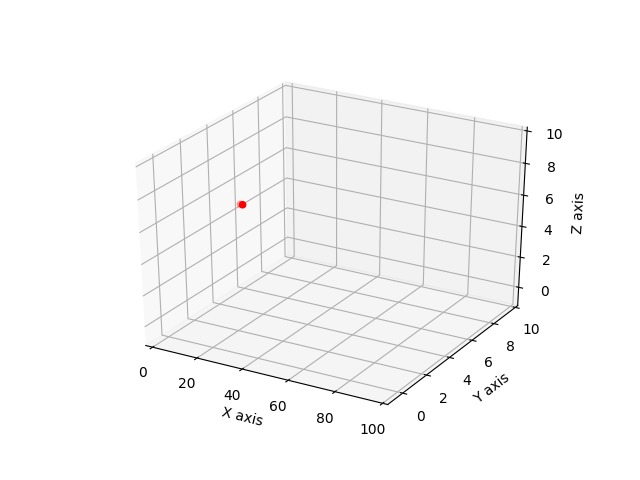

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


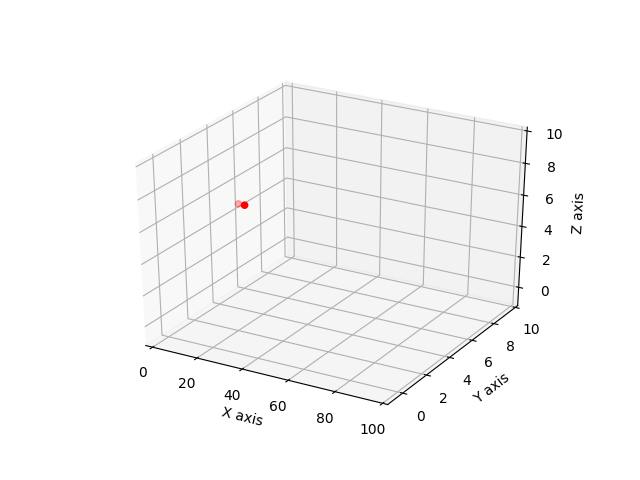

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


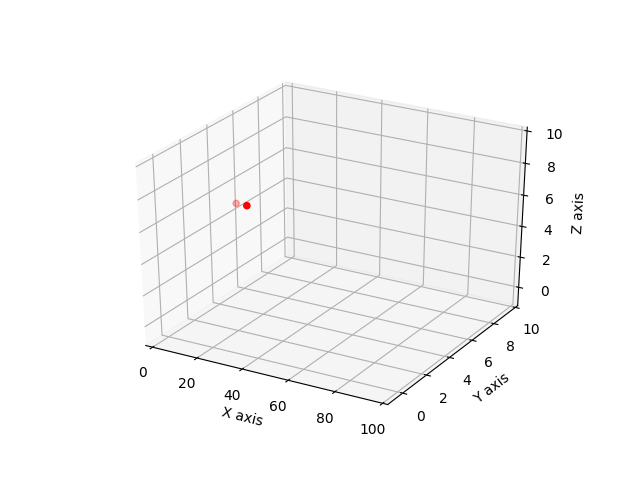

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


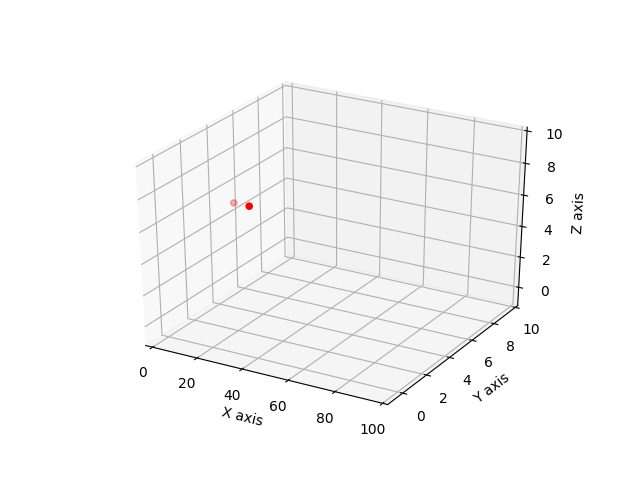

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


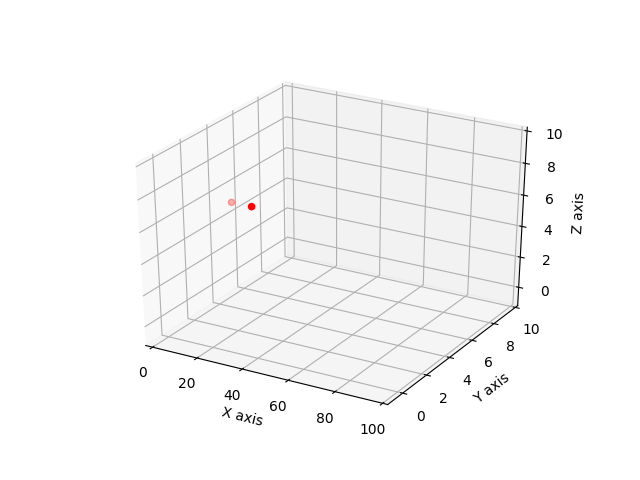

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


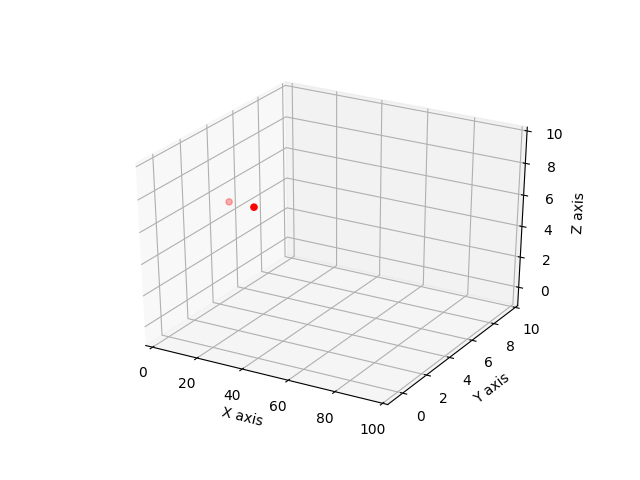

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


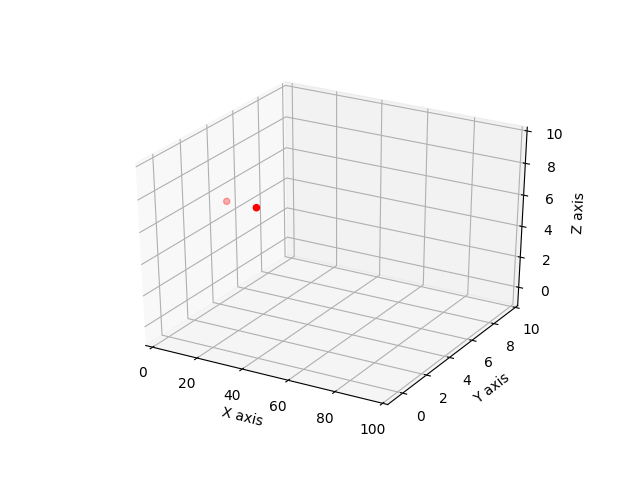

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


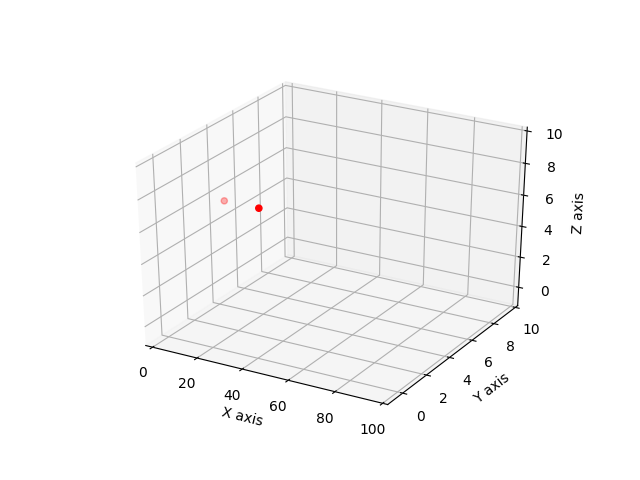

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


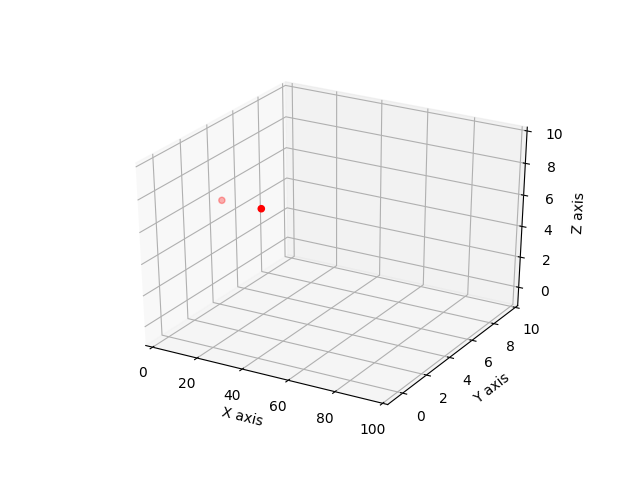

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


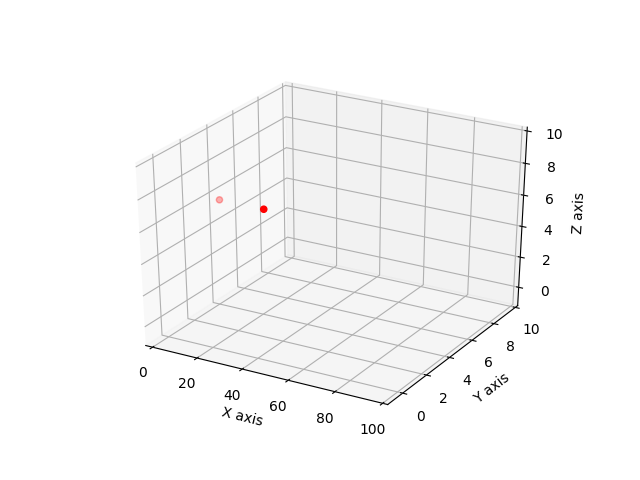

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


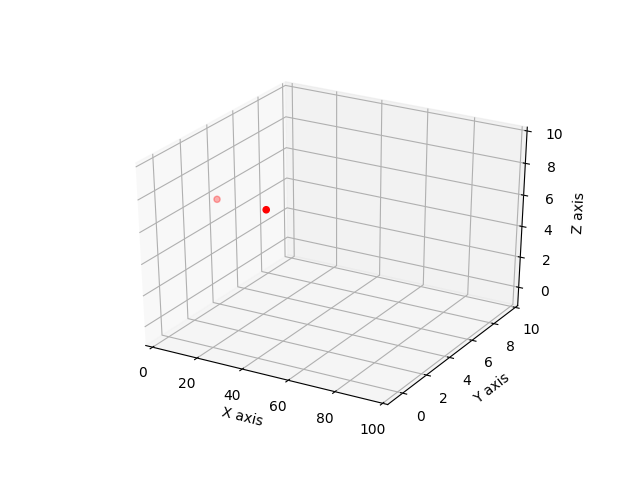

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


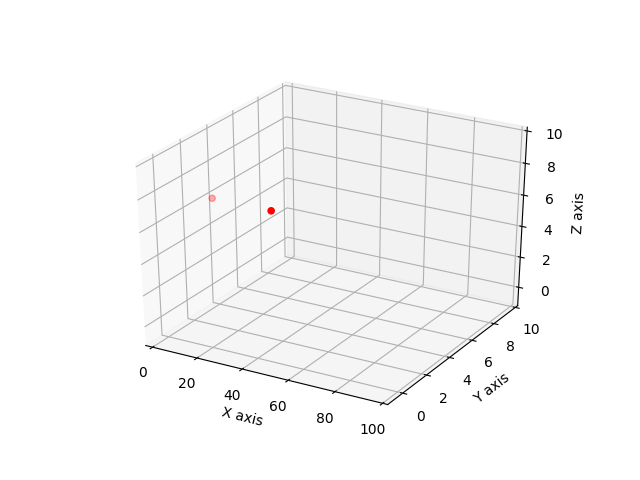

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>


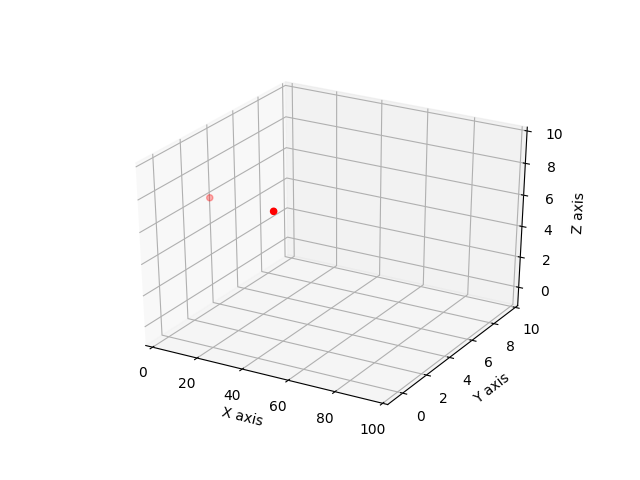

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>

shape = 3
this is the grid layout


<IPython.core.display.Javascript object>

shape = 3


()

In [15]:
#%timeit
plasma_charge_2E()

In [16]:
def plasma_random_Charges(print_all=False):
    time_L = 6
    delta_t = .1
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[5,5,5],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=[0,0,0],
                constant_H=[0,0,0]
        )
    A = 3
    for i in range(A):
        for j in range(A):
            for k in range(A):
                location = [10 / A * i, 10 / A * j, 10 / A * k]
                print(location)
                mapping.Add_Charge(location, Q = .00001, velocity=[0,0,0], acceleration=[0,0,0], mass=1)
    
    print('simulation starting')
    #jefimenko.simulate(mapping)
    jefimenko.plasma_simulation(mapping)
    #jefimenko.simulate(mapping)
    for time in range(int(time_L / delta_t)):
        jefimenko.plot_grid(mapping, time)
        #jefimenko.plot_EM_grid('E', mapping, time)
        #jefimenko.plot_EM_grid('H', mapping, time)
        print('simulation time is ' + str(time))
        for i in range(len(mapping.charges[time])):
            print(mapping.charges[time][i].location)
    return()

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 6 seconds
each time step will be 0.1
the simulation will be composed of 60 time steps
[0.0, 0.0, 0.0]
[0.0, 0.0, 3.3333333333333335]
[0.0, 0.0, 6.666666666666667]
[0.0, 3.3333333333333335, 0.0]
[0.0, 3.3333333333333335, 3.3333333333333335]
[0.0, 3.3333333333333335, 6.666666666666667]
[0.0, 6.666666666666667, 0.0]
[0.0, 6.666666666666667, 3.3333333333333335]
[0.0, 6.666666666666667, 6.666666666666667]
[3.3333333333333335, 0.0, 0.0]
[3.3333333333333335, 0.0, 3.3333333333333335]
[3.3333333333333335, 0.0, 6.666666666666667]
[3.3333333333333335, 3.3333333333333335, 0.0]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.666666666666667]
[3.3333333333333335, 6.666666666666667, 0.0]
[3.3333333333333335, 6.666666666666667, 3.3333333333333335]
[3.3333333333333335, 6.666666666666667, 6.666666666666667]
[6.666666666666667, 0.0, 0.0]
[6.666666666666667, 

<IPython.core.display.Javascript object>


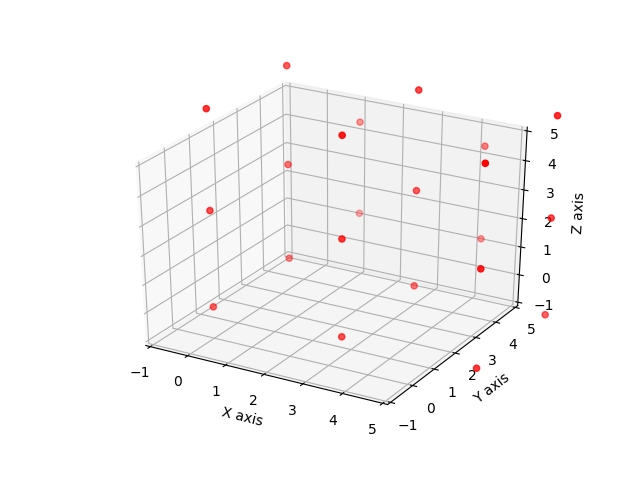

shape = 3
simulation time is 0
[0.0, 0.0, 0.0]
[0.0, 0.0, 3.3333333333333335]
[0.0, 0.0, 6.666666666666667]
[0.0, 3.3333333333333335, 0.0]
[0.0, 3.3333333333333335, 3.3333333333333335]
[0.0, 3.3333333333333335, 6.666666666666667]
[0.0, 6.666666666666667, 0.0]
[0.0, 6.666666666666667, 3.3333333333333335]
[0.0, 6.666666666666667, 6.666666666666667]
[3.3333333333333335, 0.0, 0.0]
[3.3333333333333335, 0.0, 3.3333333333333335]
[3.3333333333333335, 0.0, 6.666666666666667]
[3.3333333333333335, 3.3333333333333335, 0.0]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.666666666666667]
[3.3333333333333335, 6.666666666666667, 0.0]
[3.3333333333333335, 6.666666666666667, 3.3333333333333335]
[3.3333333333333335, 6.666666666666667, 6.666666666666667]
[6.666666666666667, 0.0, 0.0]
[6.666666666666667, 0.0, 3.3333333333333335]
[6.666666666666667, 0.0, 6.666666666666667]
[6.666666666666667, 3.3333333333333335, 0.0]
[6.666666666666667, 3.333333333333

<IPython.core.display.Javascript object>

shape = 3
simulation time is 1
[-0.002724673213623441, -0.002724673213623441, -0.002724673213623441]
[-0.003208376016032691, -0.003208376016032691, 3.3333333333333335]
[-0.002724673213623441, -0.002724673213623441, 6.66939133988029]
[-0.003208376016032691, 3.3333333333333335, -0.003208376016032691]
[-0.0037967895047104857, 3.3333333333333335, 3.3333333333333335]
[-0.003208376016032691, 3.3333333333333335, 6.669875042682699]
[-0.002724673213623441, 6.66939133988029, -0.002724673213623441]
[-0.00320837601603269, 6.669875042682699, 3.3333333333333335]
[-0.002724673213623441, 6.66939133988029, 6.66939133988029]
[3.3333333333333335, -0.00320837601603269, -0.00320837601603269]
[3.3333333333333335, -0.0037967895047104853, 3.3333333333333335]
[3.3333333333333335, -0.00320837601603269, 6.669875042682699]
[3.3333333333333335, 3.3333333333333335, -0.0037967895047104853]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.670463456171378]
[3.3333

<IPython.core.display.Javascript object>

shape = 3
simulation time is 2
[-0.008169096154923308, -0.00816909615492331, -0.008169096154923308]
[-0.009619060224392892, -0.009619060224392892, 3.3333333333333335]
[-0.008169096154923308, -0.008169096154923308, 6.67483576282159]
[-0.009619060224392892, 3.3333333333333335, -0.009619060224392892]
[-0.011383233719408923, 3.3333333333333335, 3.3333333333333335]
[-0.009619060224392894, 3.3333333333333335, 6.676285726891059]
[-0.008169096154923308, 6.67483576282159, -0.008169096154923308]
[-0.009619060224392892, 6.676285726891059, 3.3333333333333335]
[-0.008169096154923308, 6.67483576282159, 6.67483576282159]
[3.3333333333333335, -0.009619060224392892, -0.009619060224392892]
[3.3333333333333335, -0.011383233719408923, 3.3333333333333335]
[3.3333333333333335, -0.009619060224392892, 6.676285726891059]
[3.3333333333333335, 3.3333333333333335, -0.011383233719408923]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.6780499003860765]
[3.333

<IPython.core.display.Javascript object>


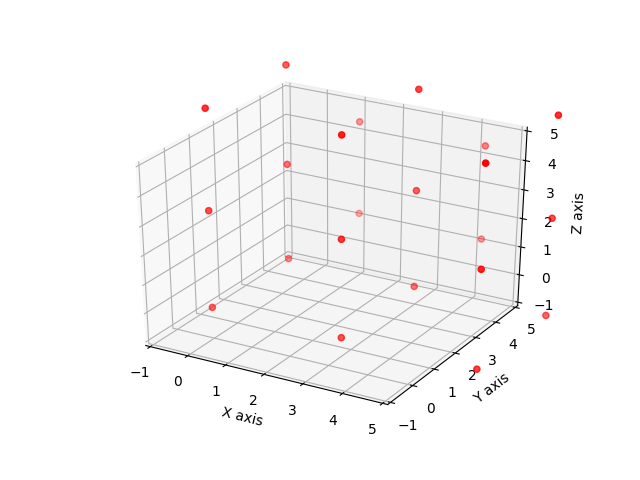

shape = 3
simulation time is 3
[-0.016323470015015197, -0.016323470015015204, -0.016323470015015197]
[-0.019219980213025407, -0.019219980213025414, 3.3333333333333335]
[-0.016323470015015197, -0.016323470015015197, 6.682990136681681]
[-0.019219980213025407, 3.3333333333333335, -0.019219980213025414]
[-0.022745138592359875, 3.3333333333333335, 3.3333333333333335]
[-0.019219980213025414, 3.3333333333333335, 6.685886646879692]
[-0.016323470015015197, 6.682990136681681, -0.016323470015015197]
[-0.019219980213025414, 6.685886646879692, 3.3333333333333335]
[-0.016323470015015197, 6.682990136681681, 6.682990136681681]
[3.3333333333333335, -0.019219980213025407, -0.019219980213025414]
[3.3333333333333335, -0.02274513859235988, 3.3333333333333335]
[3.3333333333333335, -0.019219980213025414, 6.685886646879692]
[3.3333333333333335, 3.3333333333333335, -0.02274513859235988]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.689411805259027]
[3.3

/home/storage/nehemiah/Nehemiah/linux/programing/jefimenko/git/julia/Jefimenko/jefimenko/graphing.py:156: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>

shape = 3
simulation time is 4
[-0.027173215865012774, -0.027173215865012784, -0.027173215865012774]
[-0.03199318386140601, -0.03199318386140602, 3.3333333333333335]
[-0.027173215865012774, -0.027173215865012774, 6.6938398825316785]
[-0.03199318386140601, 3.3333333333333335, -0.03199318386140602]
[-0.03786139992715965, 3.3333333333333335, 3.3333333333333335]
[-0.03199318386140602, 3.3333333333333335, 6.698659850528073]
[-0.027173215865012774, 6.6938398825316785, -0.027173215865012774]
[-0.03199318386140602, 6.698659850528073, 3.3333333333333335]
[-0.027173215865012774, 6.6938398825316785, 6.6938398825316785]
[3.3333333333333335, -0.03199318386140601, -0.03199318386140602]
[3.3333333333333335, -0.03786139992715966, 3.3333333333333335]
[3.3333333333333335, -0.03199318386140602, 6.698659850528073]
[3.3333333333333335, 3.3333333333333335, -0.03786139992715966]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.704528066593827]
[3.3333333

<IPython.core.display.Javascript object>

shape = 3
simulation time is 5
[-0.04069911470285239, -0.0406991147028524, -0.04069911470285239]
[-0.04791502276077253, -0.047915022760772544, 3.3333333333333335]
[-0.04069911470285239, -0.04069911470285239, 6.707365781369518]
[-0.04791502276077253, 3.3333333333333335, -0.047915022760772544]
[-0.056704222244693146, 3.3333333333333335, 3.3333333333333335]
[-0.047915022760772544, 3.3333333333333335, 6.7145816894274395]
[-0.04069911470285239, 6.707365781369518, -0.04069911470285239]
[-0.047915022760772544, 6.7145816894274395, 3.3333333333333335]
[-0.04069911470285239, 6.707365781369518, 6.707365781369518]
[3.3333333333333335, -0.04791502276077253, -0.047915022760772544]
[3.3333333333333335, -0.05670422224469315, 3.3333333333333335]
[3.3333333333333335, -0.047915022760772544, 6.7145816894274395]
[3.3333333333333335, 3.3333333333333335, -0.05670422224469315]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.723370888911361]
[3.3333333333

<IPython.core.display.Javascript object>


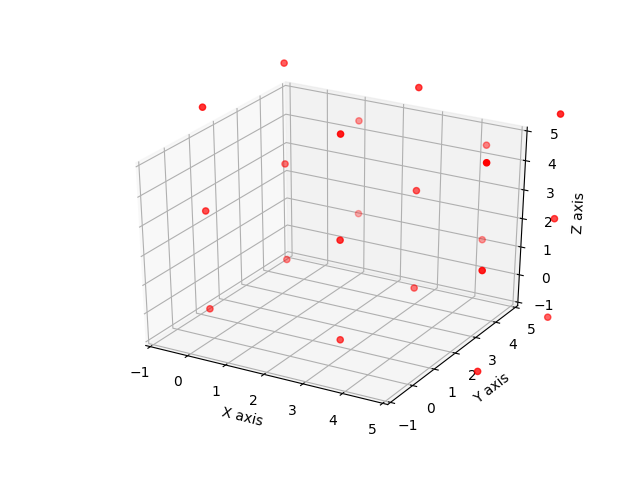

shape = 3
simulation time is 6
[-0.056877489164063336, -0.056877489164063356, -0.056877489164063336]
[-0.06695638969396625, -0.06695638969396626, 3.3333333333333335]
[-0.056877489164063336, -0.056877489164063336, 6.723544155830728]
[-0.06695638969396625, 3.3333333333333335, -0.06695638969396626]
[-0.07923940188298856, 3.3333333333333335, 3.3333333333333335]
[-0.06695638969396626, 3.3333333333333335, 6.733623056360633]
[-0.056877489164063336, 6.723544155830728, -0.056877489164063336]
[-0.06695638969396626, 6.733623056360633, 3.3333333333333335]
[-0.056877489164063336, 6.723544155830728, 6.723544155830728]
[3.3333333333333335, -0.06695638969396625, -0.06695638969396626]
[3.3333333333333335, -0.07923940188298857, 3.3333333333333335]
[3.3333333333333335, -0.06695638969396626, 6.733623056360633]
[3.3333333333333335, 3.3333333333333335, -0.07923940188298857]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.745906068549656]
[3.33333333333

<IPython.core.display.Javascript object>


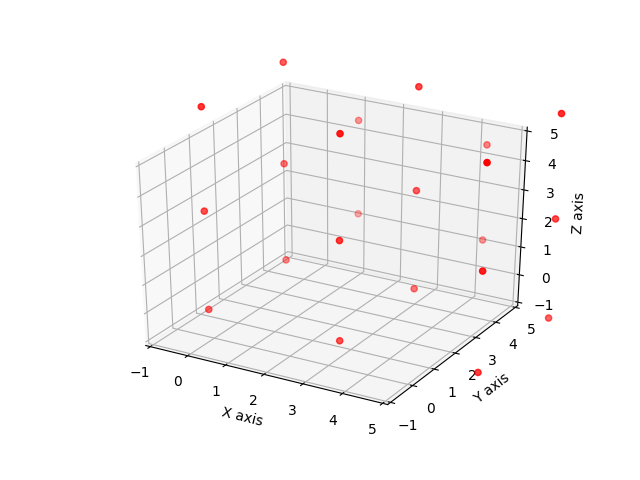

shape = 3
simulation time is 7
[-0.07568042286275196, -0.07568042286275199, -0.07568042286275196]
[-0.08908300451655743, -0.08908300451655746, 3.3333333333333335]
[-0.07568042286275196, -0.07568042286275196, 6.742347089529417]
[-0.08908300451655743, 3.3333333333333335, -0.08908300451655746]
[-0.10542666739214088, 3.3333333333333335, 3.3333333333333335]
[-0.08908300451655746, 3.3333333333333335, 6.755749671183224]
[-0.07568042286275196, 6.742347089529417, -0.07568042286275196]
[-0.08908300451655746, 6.755749671183224, 3.3333333333333335]
[-0.07568042286275196, 6.742347089529417, 6.742347089529417]
[3.3333333333333335, -0.08908300451655743, -0.08908300451655746]
[3.3333333333333335, -0.10542666739214089, 3.3333333333333335]
[3.3333333333333335, -0.08908300451655746, 6.755749671183224]
[3.3333333333333335, 3.3333333333333335, -0.10542666739214089]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.772093334058809]
[3.3333333333333335, 6

<IPython.core.display.Javascript object>

shape = 3
simulation time is 8
[-0.0970760126347994, -0.09707601263479942, -0.0970760126347994]
[-0.1142557418452923, -0.11425574184529233, 3.3333333333333335]
[-0.0970760126347994, -0.0970760126347994, 6.7637426793014646]
[-0.1142557418452923, 3.3333333333333335, -0.11425574184529233]
[-0.13522006915927515, 3.3333333333333335, 3.3333333333333335]
[-0.11425574184529233, 3.3333333333333335, 6.780922408511959]
[-0.0970760126347994, 6.7637426793014646, -0.0970760126347994]
[-0.11425574184529233, 6.780922408511959, 3.3333333333333335]
[-0.0970760126347994, 6.7637426793014646, 6.7637426793014646]
[3.3333333333333335, -0.1142557418452923, -0.11425574184529233]
[3.3333333333333335, -0.13522006915927515, 3.3333333333333335]
[3.3333333333333335, -0.11425574184529233, 6.780922408511959]
[3.3333333333333335, 3.3333333333333335, -0.13522006915927515]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.801886735825943]
[3.3333333333333335, 6.78092

<IPython.core.display.Javascript object>


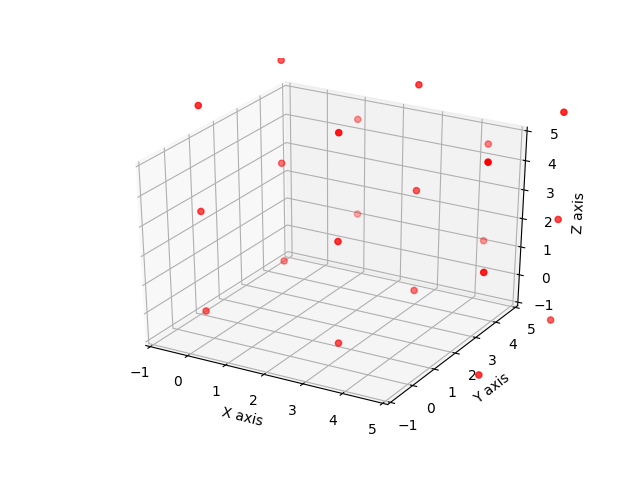

shape = 3
simulation time is 9
[-0.12102864844076586, -0.1210286484407659, -0.12102864844076587]
[-0.14243099329405512, -0.14243099329405517, 3.3333333333333335]
[-0.12102864844076587, -0.12102864844076587, 6.787695315107431]
[-0.14243099329405512, 3.3333333333333335, -0.14243099329405517]
[-0.16856840941849785, 3.3333333333333335, 3.3333333333333335]
[-0.14243099329405517, 3.3333333333333335, 6.809097659960722]
[-0.12102864844076587, 6.787695315107431, -0.12102864844076587]
[-0.14243099329405517, 6.809097659960722, 3.3333333333333335]
[-0.12102864844076587, 6.787695315107431, 6.787695315107431]
[3.3333333333333335, -0.14243099329405512, -0.14243099329405517]
[3.3333333333333335, -0.16856840941849788, 3.3333333333333335]
[3.3333333333333335, -0.14243099329405517, 6.809097659960722]
[3.3333333333333335, 3.3333333333333335, -0.16856840941849788]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.835235076085166]
[3.3333333333333335, 6.

<IPython.core.display.Javascript object>


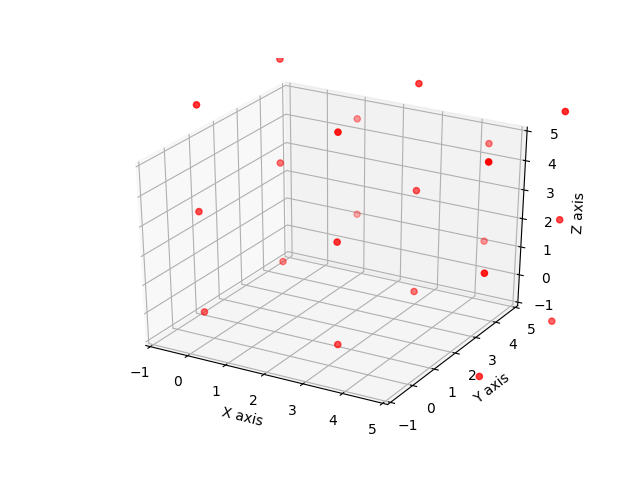

shape = 3
simulation time is 10
[-0.14749931536106592, -0.14749931536106597, -0.14749931536106592]
[-0.17356105661244753, -0.17356105661244758, 3.3333333333333335]
[-0.14749931536106592, -0.14749931536106592, 6.814165982027731]
[-0.17356105661244753, 3.3333333333333335, -0.17356105661244758]
[-0.20541570337386744, 3.3333333333333335, 3.3333333333333335]
[-0.17356105661244758, 3.3333333333333335, 6.840227723279114]
[-0.14749931536106592, 6.814165982027731, -0.14749931536106592]
[-0.17356105661244758, 6.840227723279114, 3.3333333333333335]
[-0.14749931536106592, 6.814165982027731, 6.814165982027731]
[3.3333333333333335, -0.17356105661244753, -0.17356105661244758]
[3.3333333333333335, -0.20541570337386747, 3.3333333333333335]
[3.3333333333333335, -0.17356105661244758, 6.840227723279114]
[3.3333333333333335, 3.3333333333333335, -0.20541570337386747]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.872082370040535]
[3.3333333333333335, 

<IPython.core.display.Javascript object>

shape = 3
simulation time is 11
[-0.1764459119801681, -0.17644591198016815, -0.1764459119801681]
[-0.20759454397245405, -0.2075945439724541, 3.3333333333333335]
[-0.1764459119801681, -0.1764459119801681, 6.843112578646833]
[-0.20759454397245405, 3.3333333333333335, -0.2075945439724541]
[-0.24570166207937966, 3.3333333333333335, 3.3333333333333335]
[-0.2075945439724541, 3.3333333333333335, 6.874261210639121]
[-0.1764459119801681, 6.843112578646833, -0.1764459119801681]
[-0.2075945439724541, 6.874261210639121, 3.3333333333333335]
[-0.1764459119801681, 6.843112578646833, 6.843112578646833]
[3.3333333333333335, -0.20759454397245405, -0.2075945439724541]
[3.3333333333333335, -0.24570166207937968, 3.3333333333333335]
[3.3333333333333335, -0.2075945439724541, 6.874261210639121]
[3.3333333333333335, 3.3333333333333335, -0.24570166207937968]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.912368328746047]
[3.3333333333333335, 6.87426121063

<IPython.core.display.Javascript object>

shape = 3
simulation time is 12
[-0.20782357950005248, -0.20782357950005254, -0.20782357950005248]
[-0.24447680179484033, -0.24447680179484038, 3.3333333333333335]
[-0.20782357950005248, -0.20782357950005248, 6.874490246166718]
[-0.24447680179484033, 3.3333333333333335, -0.24447680179484038]
[-0.28936218795031854, 3.3333333333333335, 3.3333333333333335]
[-0.24447680179484038, 3.3333333333333335, 6.911143468461507]
[-0.20782357950005248, 6.874490246166718, -0.20782357950005248]
[-0.24447680179484038, 6.911143468461507, 3.3333333333333335]
[-0.20782357950005248, 6.874490246166718, 6.874490246166718]
[3.3333333333333335, -0.24447680179484033, -0.24447680179484038]
[3.3333333333333335, -0.2893621879503186, 3.3333333333333335]
[3.3333333333333335, -0.24447680179484038, 6.911143468461507]
[3.3333333333333335, 3.3333333333333335, -0.2893621879503186]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.956028854616986]
[3.3333333333333335, 6.

<IPython.core.display.Javascript object>


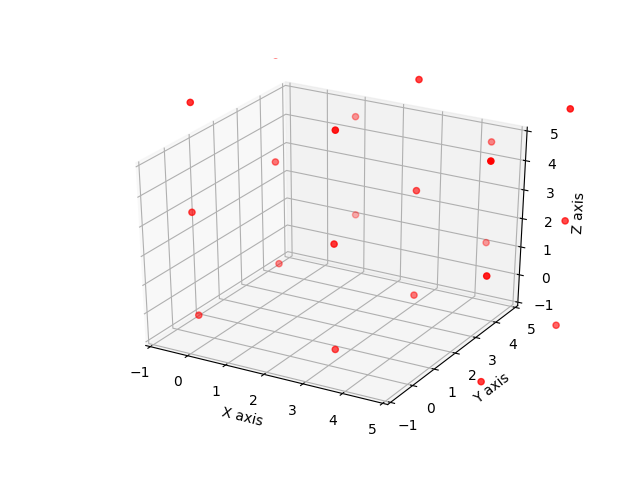

shape = 3
simulation time is 13
[-0.24158503612823967, -0.24158503612823973, -0.24158503612823967]
[-0.284150334877757, -0.28415033487775704, 3.3333333333333335]
[-0.24158503612823967, -0.24158503612823967, 6.908251702794905]
[-0.284150334877757, 3.3333333333333335, -0.28415033487775704]
[-0.3363298742823846, 3.3333333333333335, 3.3333333333333335]
[-0.28415033487775704, 3.3333333333333335, 6.950817001544424]
[-0.24158503612823967, 6.908251702794905, -0.24158503612823967]
[-0.28415033487775704, 6.950817001544424, 3.3333333333333335]
[-0.24158503612823967, 6.908251702794905, 6.908251702794905]
[3.3333333333333335, -0.284150334877757, -0.28415033487775704]
[3.3333333333333335, -0.33632987428238464, 3.3333333333333335]
[3.3333333333333335, -0.28415033487775704, 6.950817001544424]
[3.3333333333333335, 3.3333333333333335, -0.33632987428238464]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.002996540949052]
[3.3333333333333335, 6.95081

<IPython.core.display.Javascript object>

shape = 3
simulation time is 14
[-0.2776809116287424, -0.2776809116287425, -0.2776809116287424]
[-0.3265552281462227, -0.32655522814622273, 3.3333333333333335]
[-0.2776809116287424, -0.2776809116287424, 6.944347578295408]
[-0.3265552281462227, 3.3333333333333335, -0.32655522814622273]
[-0.38653450087661695, 3.3333333333333335, 3.3333333333333335]
[-0.32655522814622273, 3.3333333333333335, 6.99322189481289]
[-0.2776809116287424, 6.944347578295408, -0.2776809116287424]
[-0.32655522814622273, 6.99322189481289, 3.3333333333333335]
[-0.2776809116287424, 6.944347578295408, 6.944347578295408]
[3.3333333333333335, -0.3265552281462227, -0.32655522814622273]
[3.3333333333333335, -0.386534500876617, 3.3333333333333335]
[3.3333333333333335, -0.32655522814622273, 6.99322189481289]
[3.3333333333333335, 3.3333333333333335, -0.386534500876617]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.053201167543285]
[3.3333333333333335, 6.99322189481289, 

<IPython.core.display.Javascript object>

shape = 3
simulation time is 15
[-0.3160600773777903, -0.3160600773777904, -0.3160600773777903]
[-0.37162956003889996, -0.3716295600389, 3.3333333333333335]
[-0.3160600773777903, -0.3160600773777903, 6.982726744044456]
[-0.37162956003889996, 3.3333333333333335, -0.3716295600389]
[-0.43990351875242434, 3.3333333333333335, 3.3333333333333335]
[-0.3716295600389, 3.3333333333333335, 7.038296226705567]
[-0.3160600773777903, 6.982726744044456, -0.3160600773777903]
[-0.3716295600389, 7.038296226705567, 3.3333333333333335]
[-0.3160600773777903, 6.982726744044456, 6.982726744044456]
[3.3333333333333335, -0.37162956003889996, -0.3716295600389]
[3.3333333333333335, -0.4399035187524244, 3.3333333333333335]
[3.3333333333333335, -0.3716295600389, 7.038296226705567]
[3.3333333333333335, 3.3333333333333335, -0.4399035187524244]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.106570185419092]
[3.3333333333333335, 7.038296226705567, -0.371629560038

<IPython.core.display.Javascript object>


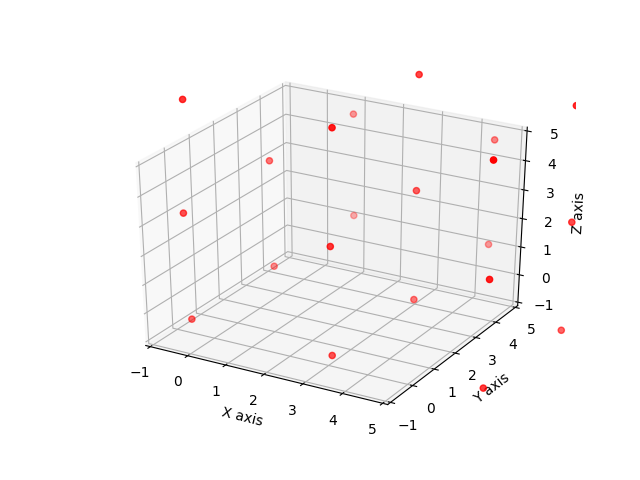

shape = 3
simulation time is 16
[-0.35666996780087323, -0.35666996780087334, -0.35666996780087323]
[-0.4193098023428479, -0.419309802342848, 3.3333333333333335]
[-0.35666996780087323, -0.35666996780087323, 7.0233366344675385]
[-0.4193098023428479, 3.3333333333333335, -0.419309802342848]
[-0.4963625179208762, 3.3333333333333335, 3.3333333333333335]
[-0.419309802342848, 3.3333333333333335, 7.085976469009515]
[-0.35666996780087323, 7.0233366344675385, -0.35666996780087323]
[-0.419309802342848, 7.085976469009515, 3.3333333333333335]
[-0.35666996780087323, 7.0233366344675385, 7.0233366344675385]
[3.3333333333333335, -0.4193098023428479, -0.419309802342848]
[3.3333333333333335, -0.49636251792087627, 3.3333333333333335]
[3.3333333333333335, -0.419309802342848, 7.085976469009515]
[3.3333333333333335, 3.3333333333333335, -0.49636251792087627]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.163029184587544]
[3.3333333333333335, 7.0859764690

<IPython.core.display.Javascript object>

shape = 3
simulation time is 17
[-0.3994568896544104, -0.39945688965441056, -0.39945688965441045]
[-0.4695312021344631, -0.4695312021344631, 3.3333333333333335]
[-0.39945688965441045, -0.39945688965441045, 7.066123556321076]
[-0.4695312021344631, 3.3333333333333335, -0.4695312021344631]
[-0.5558356732320024, 3.3333333333333335, 3.3333333333333335]
[-0.46953120213446314, 3.3333333333333335, 7.136197868801131]
[-0.39945688965441045, 7.066123556321076, -0.39945688965441045]
[-0.46953120213446314, 7.136197868801131, 3.3333333333333335]
[-0.39945688965441045, 7.066123556321076, 7.066123556321076]
[3.3333333333333335, -0.4695312021344631, -0.46953120213446314]
[3.3333333333333335, -0.5558356732320024, 3.3333333333333335]
[3.3333333333333335, -0.46953120213446314, 7.136197868801131]
[3.3333333333333335, 3.3333333333333335, -0.5558356732320024]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.2225023398986705]
[3.3333333333333335, 7.136197

<IPython.core.display.Javascript object>

shape = 3
simulation time is 18
[-0.44436631622678285, -0.444366316226783, -0.4443663162267829]
[-0.5222281423463744, -0.5222281423463744, 3.3333333333333335]
[-0.4443663162267829, -0.4443663162267829, 7.111032982893448]
[-0.5222281423463744, 3.3333333333333335, -0.5222281423463744]
[-0.618246164355529, 3.3333333333333335, 3.3333333333333335]
[-0.5222281423463744, 3.3333333333333335, 7.188894809013042]
[-0.4443663162267829, 7.111032982893448, -0.4443663162267829]
[-0.5222281423463744, 7.188894809013042, 3.3333333333333335]
[-0.4443663162267829, 7.111032982893448, 7.111032982893448]
[3.3333333333333335, -0.5222281423463744, -0.5222281423463744]
[3.3333333333333335, -0.618246164355529, 3.3333333333333335]
[3.3333333333333335, -0.5222281423463744, 7.188894809013042]
[3.3333333333333335, 3.3333333333333335, -0.618246164355529]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.284912831022197]
[3.3333333333333335, 7.188894809013042, -0.5

<IPython.core.display.Javascript object>

shape = 3
simulation time is 19
[-0.49134316414512624, -0.4913431641451264, -0.4913431641451263]
[-0.5773344783220368, -0.5773344783220368, 3.3333333333333335]
[-0.4913431641451263, -0.4913431641451263, 7.158009830811792]
[-0.5773344783220368, 3.3333333333333335, -0.5773344783220368]
[-0.683516566964435, 3.3333333333333335, 3.3333333333333335]
[-0.5773344783220368, 3.3333333333333335, 7.2440011449887045]
[-0.4913431641451263, 7.158009830811792, -0.4913431641451263]
[-0.5773344783220368, 7.2440011449887045, 3.3333333333333335]
[-0.4913431641451263, 7.158009830811792, 7.158009830811792]
[3.3333333333333335, -0.5773344783220368, -0.5773344783220368]
[3.3333333333333335, -0.683516566964435, 3.3333333333333335]
[3.3333333333333335, -0.5773344783220368, 7.2440011449887045]
[3.3333333333333335, 3.3333333333333335, -0.683516566964435]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.350183233631103]
[3.3333333333333335, 7.2440011449887045,

<IPython.core.display.Javascript object>


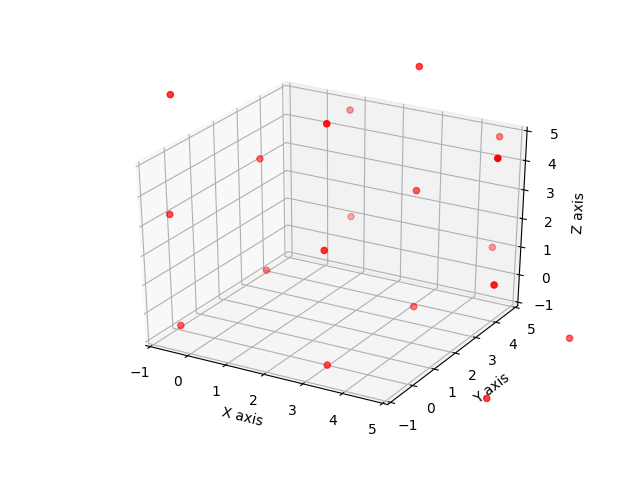

shape = 3
simulation time is 20
[-0.5403320510654931, -0.5403320510654932, -0.5403320510654931]
[-0.6347838485150996, -0.6347838485150996, 3.3333333333333335]
[-0.5403320510654931, -0.5403320510654931, 7.206998717732159]
[-0.6347838485150996, 3.3333333333333335, -0.6347838485150996]
[-0.7515692131338527, 3.3333333333333335, 3.3333333333333335]
[-0.6347838485150996, 3.3333333333333335, 7.3014505151817675]
[-0.5403320510654931, 7.206998717732159, -0.5403320510654931]
[-0.6347838485150996, 7.3014505151817675, 3.3333333333333335]
[-0.5403320510654931, 7.206998717732159, 7.206998717732159]
[3.3333333333333335, -0.6347838485150996, -0.6347838485150996]
[3.3333333333333335, -0.7515692131338527, 3.3333333333333335]
[3.3333333333333335, -0.6347838485150996, 7.3014505151817675]
[3.3333333333333335, 3.3333333333333335, -0.7515692131338527]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.418235879800521]
[3.3333333333333335, 7.301450515181767

<IPython.core.display.Javascript object>

shape = 3
simulation time is 21
[-0.591277533078284, -0.5912775330782842, -0.5912775330782841]
[-0.6945099582190477, -0.6945099582190477, 3.3333333333333335]
[-0.5912775330782841, -0.5912775330782841, 7.25794419974495]
[-0.6945099582190477, 3.3333333333333335, -0.6945099582190477]
[-0.8223265198218167, 3.3333333333333335, 3.3333333333333335]
[-0.6945099582190477, 3.3333333333333335, 7.361176624885716]
[-0.5912775330782841, 7.25794419974495, -0.5912775330782841]
[-0.6945099582190477, 7.361176624885716, 3.3333333333333335]
[-0.5912775330782841, 7.25794419974495, 7.25794419974495]
[3.3333333333333335, -0.6945099582190477, -0.6945099582190477]
[3.3333333333333335, -0.8223265198218167, 3.3333333333333335]
[3.3333333333333335, -0.6945099582190477, 7.361176624885716]
[3.3333333333333335, 3.3333333333333335, -0.8223265198218167]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.488993186488485]
[3.3333333333333335, 7.361176624885716, -0.694

<IPython.core.display.Javascript object>


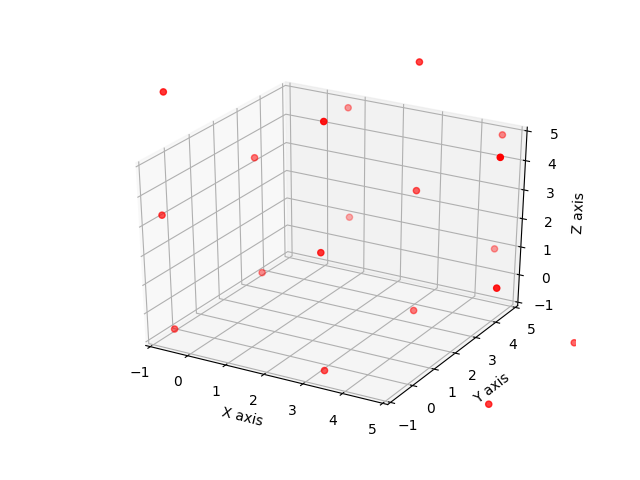

shape = 3
simulation time is 22
[-0.6441243211660238, -0.6441243211660241, -0.644124321166024]
[-0.7564468358604447, -0.7564468358604447, 3.3333333333333335]
[-0.644124321166024, -0.644124321166024, 7.310790987832689]
[-0.7564468358604447, 3.3333333333333335, -0.7564468358604447]
[-0.8957112850490633, 3.3333333333333335, 3.3333333333333335]
[-0.7564468358604447, 3.3333333333333335, 7.423113502527113]
[-0.644124321166024, 7.310790987832689, -0.644124321166024]
[-0.7564468358604447, 7.423113502527113, 3.3333333333333335]
[-0.644124321166024, 7.310790987832689, 7.310790987832689]
[3.3333333333333335, -0.7564468358604447, -0.7564468358604447]
[3.3333333333333335, -0.8957112850490633, 3.3333333333333335]
[3.3333333333333335, -0.7564468358604447, 7.423113502527113]
[3.3333333333333335, 3.3333333333333335, -0.8957112850490633]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.562377951715732]
[3.3333333333333335, 7.423113502527113, -0.7564

<IPython.core.display.Javascript object>

shape = 3
simulation time is 23
[-0.6988174764985181, -0.6988174764985184, -0.6988174764985183]
[-0.820529061948641, -0.820529061948641, 3.3333333333333335]
[-0.6988174764985183, -0.6988174764985183, 7.365484143165183]
[-0.820529061948641, 3.3333333333333335, -0.820529061948641]
[-0.9716469520356004, 3.3333333333333335, 3.3333333333333335]
[-0.820529061948641, 3.3333333333333335, 7.487195728615309]
[-0.6988174764985183, 7.365484143165183, -0.6988174764985183]
[-0.820529061948641, 7.487195728615309, 3.3333333333333335]
[-0.6988174764985183, 7.365484143165184, 7.365484143165184]
[3.3333333333333335, -0.820529061948641, -0.820529061948641]
[3.3333333333333335, -0.9716469520356005, 3.3333333333333335]
[3.3333333333333335, -0.820529061948641, 7.487195728615309]
[3.3333333333333335, 3.3333333333333335, -0.9716469520356005]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.638313618702269]
[3.3333333333333335, 7.487195728615309, -0.8205290

<IPython.core.display.Javascript object>

shape = 3
simulation time is 24
[-0.7553025847367736, -0.7553025847367739, -0.7553025847367738]
[-0.8866919712434738, -0.8866919712434738, 3.3333333333333335]
[-0.7553025847367738, -0.7553025847367738, 7.421969251403438]
[-0.8866919712434738, 3.3333333333333335, -0.8866919712434738]
[-1.0500578420812259, 3.3333333333333335, 3.3333333333333335]
[-0.8866919712434738, 3.3333333333333335, 7.553358637910142]
[-0.7553025847367738, 7.421969251403438, -0.7553025847367738]
[-0.8866919712434738, 7.553358637910142, 3.3333333333333335]
[-0.7553025847367738, 7.421969251403439, 7.421969251403439]
[3.3333333333333335, -0.8866919712434738, -0.8866919712434738]
[3.3333333333333335, -1.0500578420812259, 3.3333333333333335]
[3.3333333333333335, -0.8866919712434738, 7.553358637910142]
[3.3333333333333335, 3.3333333333333335, -1.0500578420812259]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.716724508747895]
[3.3333333333333335, 7.553358637910142, -

<IPython.core.display.Javascript object>


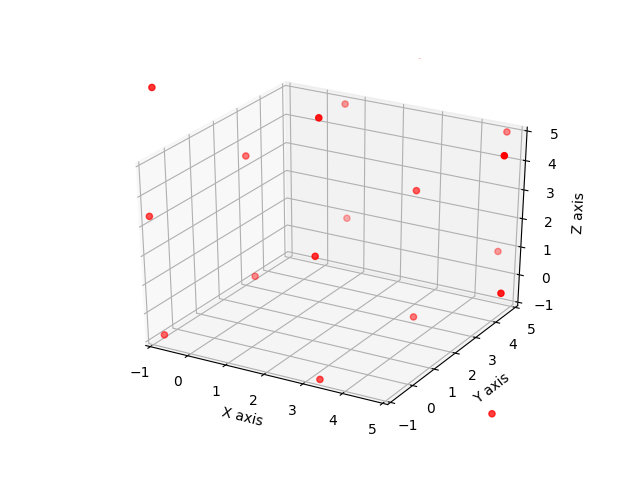

shape = 3
simulation time is 25
[-0.8135259098405686, -0.8135259098405689, -0.8135259098405688]
[-0.9548718290818797, -0.9548718290818797, 3.3333333333333335]
[-0.8135259098405688, -0.8135259098405688, 7.480192576507234]
[-0.9548718290818797, 3.3333333333333335, -0.9548718290818797]
[-1.1308693573994282, 3.3333333333333335, 3.3333333333333335]
[-0.9548718290818797, 3.3333333333333335, 7.621538495748548]
[-0.8135259098405688, 7.480192576507234, -0.8135259098405688]
[-0.9548718290818796, 7.621538495748548, 3.3333333333333335]
[-0.8135259098405688, 7.480192576507235, 7.480192576507235]
[3.3333333333333335, -0.9548718290818797, -0.9548718290818797]
[3.3333333333333335, -1.1308693573994282, 3.3333333333333335]
[3.3333333333333335, -0.9548718290818797, 7.621538495748548]
[3.3333333333333335, 3.3333333333333335, -1.1308693573994282]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.797536024066097]
[3.3333333333333335, 7.621538495748548, -

<IPython.core.display.Javascript object>

shape = 3
simulation time is 26
[-0.8734345281365831, -0.8734345281365834, -0.8734345281365834]
[-1.0250059830992366, -1.0250059830992366, 3.3333333333333335]
[-0.8734345281365834, -0.8734345281365834, 7.540101194803248]
[-1.0250059830992366, 3.3333333333333335, -1.0250059830992366]
[-1.214008155436459, 3.3333333333333335, 3.3333333333333335]
[-1.0250059830992366, 3.3333333333333335, 7.691672649765905]
[-0.8734345281365834, 7.540101194803248, -0.8734345281365834]
[-1.0250059830992364, 7.691672649765905, 3.3333333333333335]
[-0.8734345281365834, 7.540101194803249, 7.540101194803249]
[3.3333333333333335, -1.0250059830992366, -1.0250059830992366]
[3.3333333333333335, -1.214008155436459, 3.3333333333333335]
[3.3333333333333335, -1.0250059830992366, 7.691672649765905]
[3.3333333333333335, 3.3333333333333335, -1.214008155436459]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.880674822103128]
[3.3333333333333335, 7.691672649765905, -1.0

<IPython.core.display.Javascript object>


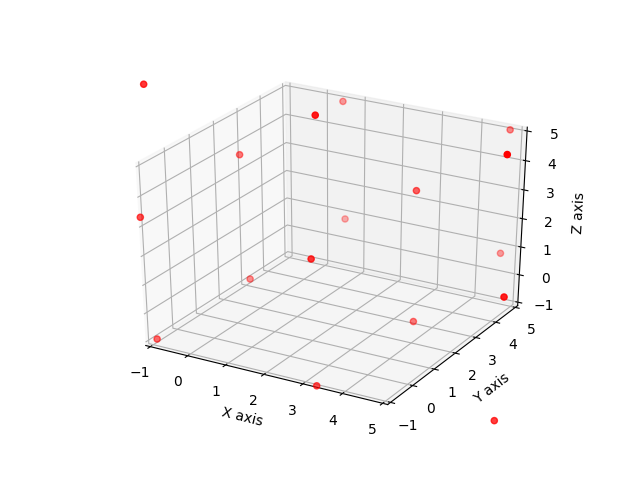

shape = 3
simulation time is 27
[-0.9349764436078825, -0.9349764436078828, -0.9349764436078828]
[-1.0970329917986754, -1.0970329917986754, 3.3333333333333335]
[-0.9349764436078828, -0.9349764436078828, 7.601643110274548]
[-1.0970329917986754, 3.3333333333333335, -1.0970329917986754]
[-1.2994022964394285, 3.3333333333333335, 3.3333333333333335]
[-1.0970329917986754, 3.3333333333333335, 7.7636996584653435]
[-0.9349764436078828, 7.601643110274548, -0.9349764436078828]
[-1.0970329917986752, 7.7636996584653435, 3.3333333333333335]
[-0.9349764436078828, 7.601643110274549, 7.601643110274549]
[3.3333333333333335, -1.0970329917986754, -1.0970329917986754]
[3.3333333333333335, -1.2994022964394285, 3.3333333333333335]
[3.3333333333333335, -1.0970329917986754, 7.7636996584653435]
[3.3333333333333335, 3.3333333333333335, -1.2994022964394285]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.966068963106097]
[3.3333333333333335, 7.763699658465343

<IPython.core.display.Javascript object>


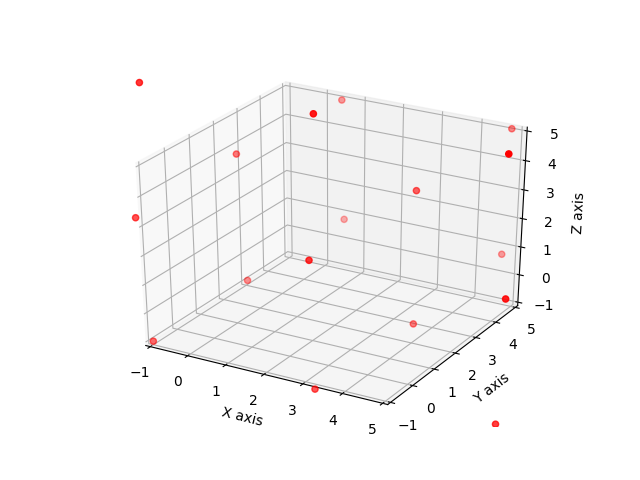

shape = 3
simulation time is 28
[-0.9981006855160555, -0.9981006855160558, -0.9981006855160558]
[-1.1708927315699886, -1.1708927315699886, 3.3333333333333335]
[-0.9981006855160558, -0.9981006855160558, 7.664767352182721]
[-1.1708927315699886, 3.3333333333333335, -1.1708927315699886]
[-1.3869813661899684, 3.3333333333333335, 3.3333333333333335]
[-1.1708927315699886, 3.3333333333333335, 7.837559398236657]
[-0.9981006855160558, 7.664767352182721, -0.9981006855160558]
[-1.1708927315699884, 7.837559398236657, 3.3333333333333335]
[-0.9981006855160558, 7.6647673521827215, 7.6647673521827215]
[3.3333333333333335, -1.1708927315699886, -1.1708927315699886]
[3.3333333333333335, -1.3869813661899684, 3.3333333333333335]
[3.3333333333333335, -1.1708927315699886, 7.837559398236657]
[3.3333333333333335, 3.3333333333333335, -1.3869813661899684]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.053648032856637]
[3.3333333333333335, 7.837559398236657,

<IPython.core.display.Javascript object>

shape = 3
simulation time is 29
[-1.0627573895700926, -1.0627573895700928, -1.0627573895700928]
[-1.2465264838482428, -1.2465264838482428, 3.3333333333333335]
[-1.0627573895700928, -1.0627573895700928, 7.729424056236757]
[-1.2465264838482428, 3.3333333333333335, -1.2465264838482428]
[-1.4766765759047396, 3.3333333333333335, 3.3333333333333335]
[-1.2465264838482428, 3.3333333333333335, 7.913193150514911]
[-1.0627573895700928, 7.729424056236757, -1.0627573895700928]
[-1.2465264838482426, 7.913193150514911, 3.3333333333333335]
[-1.0627573895700928, 7.729424056236758, 7.729424056236758]
[3.3333333333333335, -1.2465264838482428, -1.2465264838482428]
[3.3333333333333335, -1.4766765759047396, 3.3333333333333335]
[3.3333333333333335, -1.2465264838482428, 7.913193150514911]
[3.3333333333333335, 3.3333333333333335, -1.4766765759047396]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.143343242571408]
[3.3333333333333335, 7.913193150514911, -

<IPython.core.display.Javascript object>

shape = 3
simulation time is 30
[-1.128897863917287, -1.1288978639172873, -1.1288978639172873]
[-1.3238770041400705, -1.3238770041400705, 3.3333333333333335]
[-1.1288978639172873, -1.1288978639172873, 7.795564530583952]
[-1.3238770041400705, 3.3333333333333335, -1.3238770041400705]
[-1.5684208413321334, 3.3333333333333335, 3.3333333333333335]
[-1.3238770041400705, 3.3333333333333335, 7.990543670806739]
[-1.1288978639172873, 7.795564530583952, -1.1288978639172873]
[-1.3238770041400703, 7.990543670806739, 3.3333333333333335]
[-1.1288978639172873, 7.7955645305839525, 7.7955645305839525]
[3.3333333333333335, -1.3238770041400705, -1.3238770041400705]
[3.3333333333333335, -1.5684208413321334, 3.3333333333333335]
[3.3333333333333335, -1.3238770041400705, 7.990543670806739]
[3.3333333333333335, 3.3333333333333335, -1.5684208413321334]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.235087507998802]
[3.3333333333333335, 7.990543670806739, 

<IPython.core.display.Javascript object>

shape = 3
simulation time is 31
[-1.1964746412572784, -1.1964746412572786, -1.1964746412572786]
[-1.4028885746418487, -1.4028885746418487, 3.3333333333333335]
[-1.1964746412572786, -1.1964746412572786, 7.863141307923943]
[-1.4028885746418487, 3.3333333333333335, -1.4028885746418487]
[-1.6621488430566287, 3.3333333333333335, 3.3333333333333335]
[-1.4028885746418487, 3.3333333333333335, 8.069555241308517]
[-1.1964746412572786, 7.863141307923943, -1.1964746412572786]
[-1.4028885746418485, 8.069555241308517, 3.3333333333333335]
[-1.1964746412572786, 7.863141307923944, 7.863141307923944]
[3.3333333333333335, -1.4028885746418487, -1.4028885746418487]
[3.3333333333333335, -1.6621488430566287, 3.3333333333333335]
[3.3333333333333335, -1.4028885746418487, 8.069555241308517]
[3.3333333333333335, 3.3333333333333335, -1.6621488430566287]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.328815509723297]
[3.3333333333333335, 8.069555241308517, -

<IPython.core.display.Javascript object>

shape = 3
simulation time is 32
[-1.2654415183769088, -1.265441518376909, -1.265441518376909]
[-1.4835070421369883, -1.4835070421369883, 3.3333333333333335]
[-1.265441518376909, -1.265441518376909, 7.932108185043574]
[-1.4835070421369883, 3.3333333333333335, -1.4835070421369883]
[-1.757797069968258, 3.3333333333333335, 3.3333333333333335]
[-1.4835070421369883, 3.3333333333333335, 8.150173708803656]
[-1.265441518376909, 7.932108185043574, -1.265441518376909]
[-1.483507042136988, 8.150173708803656, 3.3333333333333335]
[-1.265441518376909, 7.932108185043575, 7.932108185043575]
[3.3333333333333335, -1.4835070421369883, -1.4835070421369883]
[3.3333333333333335, -1.757797069968258, 3.3333333333333335]
[3.3333333333333335, -1.4835070421369883, 8.150173708803656]
[3.3333333333333335, 3.3333333333333335, -1.757797069968258]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.424463736634927]
[3.3333333333333335, 8.150173708803656, -1.483507042

<IPython.core.display.Javascript object>


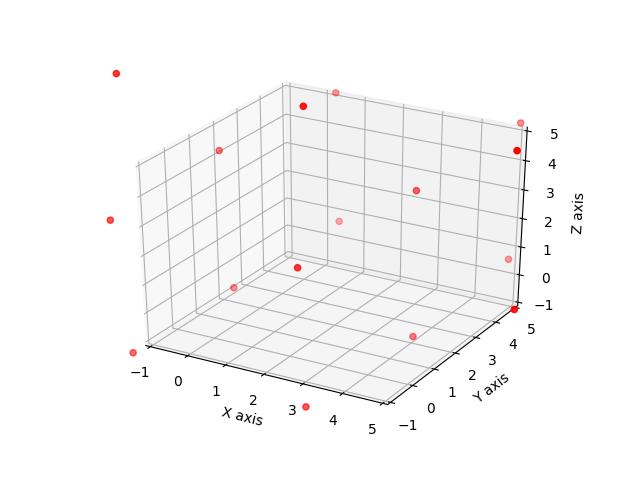

shape = 3
simulation time is 33
[-1.3357535843765465, -1.3357535843765467, -1.3357535843765467]
[-1.5656798427969532, -1.5656798427969532, 3.3333333333333335]
[-1.3357535843765467, -1.3357535843765467, 8.002420251043212]
[-1.5656798427969532, 3.3333333333333335, -1.5656798427969532]
[-1.8553038477732733, 3.3333333333333335, 3.3333333333333335]
[-1.5656798427969532, 3.3333333333333335, 8.232346509463621]
[-1.3357535843765467, 8.002420251043212, -1.3357535843765467]
[-1.565679842796953, 8.232346509463621, 3.3333333333333335]
[-1.3357535843765467, 8.002420251043212, 8.002420251043212]
[3.3333333333333335, -1.5656798427969532, -1.5656798427969532]
[3.3333333333333335, -1.8553038477732733, 3.3333333333333335]
[3.3333333333333335, -1.5656798427969532, 8.232346509463621]
[3.3333333333333335, 3.3333333333333335, -1.8553038477732733]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.521970514439943]
[3.3333333333333335, 8.232346509463621, -1

<IPython.core.display.Javascript object>

shape = 3
simulation time is 34
[-1.4073672388131362, -1.4073672388131364, -1.4073672388131364]
[-1.6493560154291431, -1.6493560154291431, 3.3333333333333335]
[-1.4073672388131364, -1.4073672388131364, 8.074033905479801]
[-1.6493560154291431, 3.3333333333333335, -1.6493560154291431]
[-1.9546093543209984, 3.3333333333333335, 3.3333333333333335]
[-1.6493560154291431, 3.3333333333333335, 8.316022682095811]
[-1.4073672388131364, 8.074033905479801, -1.4073672388131364]
[-1.649356015429143, 8.316022682095811, 3.3333333333333335]
[-1.4073672388131364, 8.074033905479801, 8.074033905479801]
[3.3333333333333335, -1.6493560154291431, -1.6493560154291431]
[3.3333333333333335, -1.9546093543209984, 3.3333333333333335]
[3.3333333333333335, -1.6493560154291431, 8.316022682095811]
[3.3333333333333335, 3.3333333333333335, -1.9546093543209984]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.621276020987668]
[3.3333333333333335, 8.316022682095811, -1

<IPython.core.display.Javascript object>

shape = 3
simulation time is 35
[-1.4802402009261384, -1.4802402009261386, -1.4802402009261386]
[-1.7344862046201859, -1.7344862046201859, 3.3333333333333335]
[-1.4802402009261386, -1.4802402009261386, 8.146906867592804]
[-1.7344862046201859, 3.3333333333333335, -1.7344862046201859]
[-2.055655623407518, 3.3333333333333335, 3.3333333333333335]
[-1.7344862046201859, 3.3333333333333335, 8.401152871286854]
[-1.4802402009261386, 8.146906867592804, -1.4802402009261386]
[-1.7344862046201857, 8.401152871286854, 3.3333333333333335]
[-1.4802402009261386, 8.146906867592804, 8.146906867592804]
[3.3333333333333335, -1.7344862046201859, -1.7344862046201859]
[3.3333333333333335, -2.055655623407518, 3.3333333333333335]
[3.3333333333333335, -1.7344862046201859, 8.401152871286854]
[3.3333333333333335, 3.3333333333333335, -2.055655623407518]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.722322290074187]
[3.3333333333333335, 8.401152871286854, -1.7

<IPython.core.display.Javascript object>


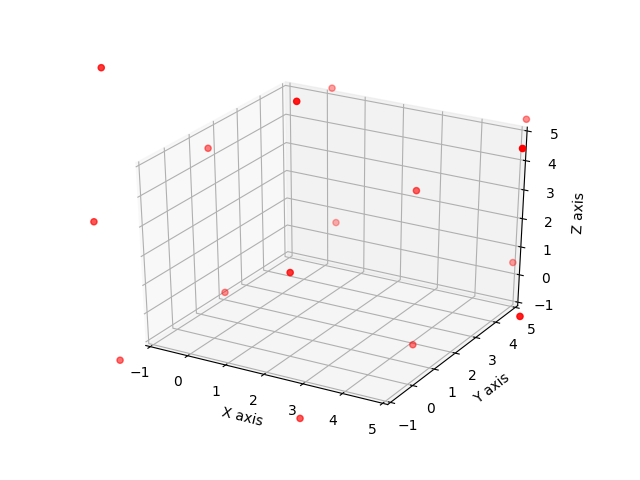

shape = 3
simulation time is 36
[-1.5543315110437168, -1.554331511043717, -1.554331511043717]
[-1.8210226551203699, -1.8210226551203699, 3.3333333333333335]
[-1.554331511043717, -1.554331511043717, 8.220998177710383]
[-1.8210226551203699, 3.3333333333333335, -1.8210226551203699]
[-2.1583865385946477, 3.3333333333333335, 3.3333333333333335]
[-1.8210226551203699, 3.3333333333333335, 8.487689321787037]
[-1.554331511043717, 8.220998177710383, -1.554331511043717]
[-1.8210226551203696, 8.487689321787037, 3.3333333333333335]
[-1.554331511043717, 8.220998177710383, 8.220998177710383]
[3.3333333333333335, -1.8210226551203699, -1.8210226551203699]
[3.3333333333333335, -2.1583865385946477, 3.3333333333333335]
[3.3333333333333335, -1.8210226551203699, 8.487689321787037]
[3.3333333333333335, 3.3333333333333335, -2.1583865385946477]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.825053205261316]
[3.3333333333333335, 8.487689321787037, -1.82102

<IPython.core.display.Javascript object>

shape = 3
simulation time is 37
[-1.6296015251914955, -1.6296015251914957, -1.6296015251914957]
[-1.9089191987079275, -1.9089191987079275, 3.3333333333333335]
[-1.6296015251914957, -1.6296015251914957, 8.296268191858163]
[-1.9089191987079275, 3.3333333333333335, -1.9089191987079275]
[-2.262747818456945, 3.3333333333333335, 3.3333333333333335]
[-1.9089191987079275, 3.3333333333333335, 8.575585865374595]
[-1.6296015251914957, 8.296268191858163, -1.6296015251914957]
[-1.9089191987079273, 8.575585865374595, 3.3333333333333335]
[-1.6296015251914957, 8.296268191858163, 8.296268191858163]
[3.3333333333333335, -1.9089191987079275, -1.9089191987079275]
[3.3333333333333335, -2.262747818456945, 3.3333333333333335]
[3.3333333333333335, -1.9089191987079275, 8.575585865374595]
[3.3333333333333335, 3.3333333333333335, -2.262747818456945]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.929414485123614]
[3.3333333333333335, 8.575585865374595, -1.9

<IPython.core.display.Javascript object>


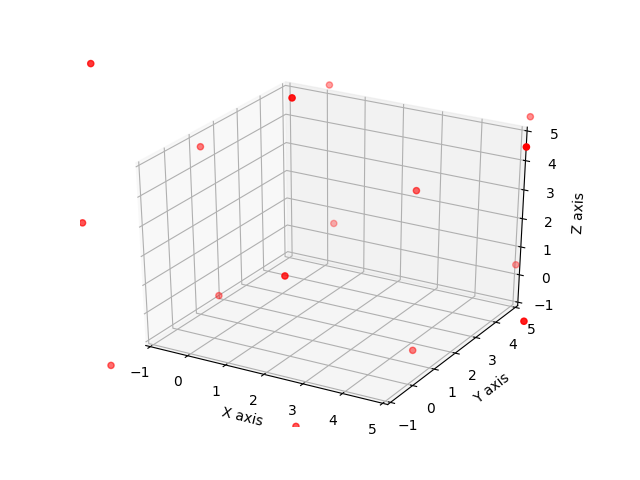

shape = 3
simulation time is 38
[-1.7060119038477548, -1.706011903847755, -1.706011903847755]
[-1.9981312346638505, -1.9981312346638505, 3.3333333333333335]
[-1.706011903847755, -1.706011903847755, 8.372678570514422]
[-1.9981312346638505, 3.3333333333333335, -1.9981312346638505]
[-2.368686994543799, 3.3333333333333335, 3.3333333333333335]
[-1.9981312346638505, 3.3333333333333335, 8.664797901330518]
[-1.706011903847755, 8.372678570514422, -1.706011903847755]
[-1.9981312346638502, 8.664797901330518, 3.3333333333333335]
[-1.706011903847755, 8.372678570514422, 8.372678570514422]
[3.3333333333333335, -1.9981312346638505, -1.9981312346638505]
[3.3333333333333335, -2.368686994543799, 3.3333333333333335]
[3.3333333333333335, -1.9981312346638505, 8.664797901330518]
[3.3333333333333335, 3.3333333333333335, -2.368686994543799]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.035353661210468]
[3.3333333333333335, 8.664797901330518, -1.99813123

<IPython.core.display.Javascript object>

shape = 3
simulation time is 39
[-1.7835255957094145, -1.7835255957094147, -1.7835255957094147]
[-2.0886157048814193, -2.0886157048814193, 3.3333333333333335]
[-1.7835255957094147, -1.7835255957094147, 8.450192262376081]
[-2.0886157048814193, 3.3333333333333335, -2.0886157048814193]
[-2.4761533832205784, 3.3333333333333335, 3.3333333333333335]
[-2.0886157048814193, 3.3333333333333335, 8.755282371548088]
[-1.7835255957094147, 8.450192262376081, -1.7835255957094147]
[-2.0886157048814193, 8.755282371548088, 3.3333333333333335]
[-1.7835255957094147, 8.450192262376081, 8.450192262376081]
[3.3333333333333335, -2.0886157048814193, -2.0886157048814193]
[3.3333333333333335, -2.4761533832205784, 3.3333333333333335]
[3.3333333333333335, -2.0886157048814193, 8.755282371548088]
[3.3333333333333335, 3.3333333333333335, -2.4761533832205784]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.142820049887249]
[3.3333333333333335, 8.755282371548088, -

<IPython.core.display.Javascript object>

shape = 3
simulation time is 40
[-1.8621068172543935, -1.8621068172543938, -1.8621068172543938]
[-2.180331064531541, -2.180331064531541, 3.3333333333333335]
[-1.8621068172543938, -1.8621068172543938, 8.52877348392106]
[-2.180331064531541, 3.3333333333333335, -2.180331064531541]
[-2.5850980524343643, 3.3333333333333335, 3.3333333333333335]
[-2.180331064531541, 3.3333333333333335, 8.84699773119821]
[-1.8621068172543938, 8.52877348392106, -1.8621068172543938]
[-2.180331064531541, 8.84699773119821, 3.3333333333333335]
[-1.8621068172543938, 8.52877348392106, 8.52877348392106]
[3.3333333333333335, -2.180331064531541, -2.180331064531541]
[3.3333333333333335, -2.5850980524343643, 3.3333333333333335]
[3.3333333333333335, -2.180331064531541, 8.84699773119821]
[3.3333333333333335, 3.3333333333333335, -2.5850980524343643]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.251764719101034]
[3.3333333333333335, 8.84699773119821, -2.180331064531541

<IPython.core.display.Javascript object>

shape = 3
simulation time is 41
[-1.9417210288093494, -1.9417210288093496, -1.9417210288093496]
[-2.273237249106705, -2.273237249106705, 3.3333333333333335]
[-1.9417210288093496, -1.9417210288093496, 8.608387695476017]
[-2.273237249106705, 3.3333333333333335, -2.273237249106705]
[-2.69547378433739, 3.3333333333333335, 3.3333333333333335]
[-2.273237249106705, 3.3333333333333335, 8.939903915773373]
[-1.9417210288093496, 8.608387695476017, -1.9417210288093496]
[-2.273237249106705, 8.939903915773373, 3.3333333333333335]
[-1.9417210288093496, 8.608387695476017, 8.608387695476017]
[3.3333333333333335, -2.273237249106705, -2.273237249106705]
[3.3333333333333335, -2.69547378433739, 3.3333333333333335]
[3.3333333333333335, -2.273237249106705, 8.939903915773373]
[3.3333333333333335, 3.3333333333333335, -2.69547378433739]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.36214045100406]
[3.3333333333333335, 8.939903915773373, -2.27323724910670

<IPython.core.display.Javascript object>

shape = 3
simulation time is 42
[-2.022334907758444, -2.0223349077584443, -2.0223349077584443]
[-2.367295638573836, -2.367295638573836, 3.3333333333333335]
[-2.0223349077584443, -2.0223349077584443, 8.689001574425111]
[-2.367295638573836, 3.3333333333333335, -2.367295638573836]
[-2.80723503459586, 3.3333333333333335, 3.3333333333333335]
[-2.367295638573836, 3.3333333333333335, 9.033962305240504]
[-2.0223349077584443, 8.689001574425111, -2.0223349077584443]
[-2.367295638573836, 9.033962305240504, 3.3333333333333335]
[-2.0223349077584443, 8.689001574425111, 8.689001574425111]
[3.3333333333333335, -2.367295638573836, -2.367295638573836]
[3.3333333333333335, -2.80723503459586, 3.3333333333333335]
[3.3333333333333335, -2.367295638573836, 9.033962305240504]
[3.3333333333333335, 3.3333333333333335, -2.80723503459586]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.473901701262529]
[3.3333333333333335, 9.033962305240504, -2.36729563857383

<IPython.core.display.Javascript object>


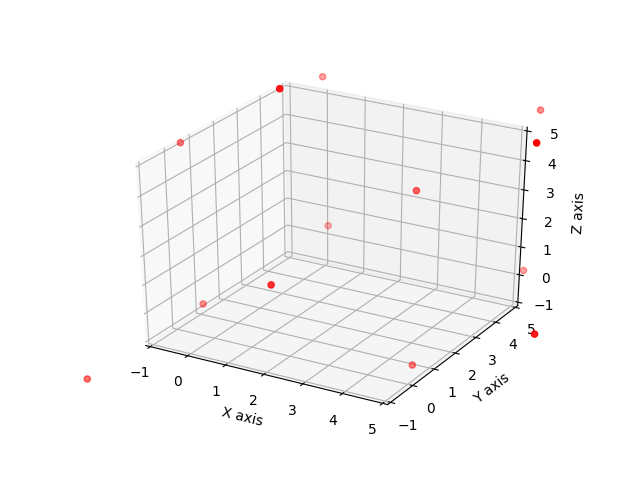

shape = 3
simulation time is 43
[-2.1039163194593953, -2.1039163194593957, -2.1039163194593957]
[-2.4624690192801144, -2.4624690192801144, 3.3333333333333335]
[-2.1039163194593957, -2.1039163194593957, 8.770582986126062]
[-2.4624690192801144, 3.3333333333333335, -2.4624690192801144]
[-2.920337889113908, 3.3333333333333335, 3.3333333333333335]
[-2.4624690192801144, 3.3333333333333335, 9.129135685946782]
[-2.1039163194593957, 8.770582986126062, -2.1039163194593957]
[-2.4624690192801144, 9.129135685946782, 3.3333333333333335]
[-2.1039163194593957, 8.770582986126062, 8.770582986126062]
[3.3333333333333335, -2.4624690192801144, -2.4624690192801144]
[3.3333333333333335, -2.920337889113908, 3.3333333333333335]
[3.3333333333333335, -2.4624690192801144, 9.129135685946782]
[3.3333333333333335, 3.3333333333333335, -2.920337889113908]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.587004555780577]
[3.3333333333333335, 9.129135685946782, -2.4

<IPython.core.display.Javascript object>


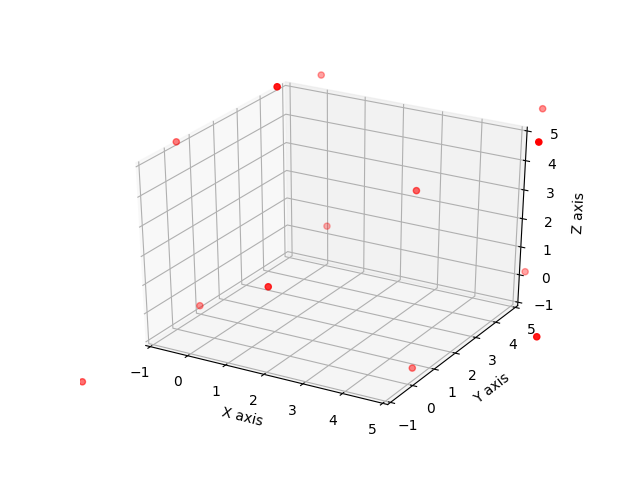

shape = 3
simulation time is 44
[-2.186434286368138, -2.1864342863681383, -2.1864342863681383]
[-2.5587215441762887, -2.5587215441762887, 3.3333333333333335]
[-2.1864342863681383, -2.1864342863681383, 8.853100953034804]
[-2.5587215441762887, 3.3333333333333335, -2.5587215441762887]
[-3.0347400188122933, 3.3333333333333335, 3.3333333333333335]
[-2.5587215441762887, 3.3333333333333335, 9.225388210842956]
[-2.1864342863681383, 8.853100953034804, -2.1864342863681383]
[-2.5587215441762887, 9.225388210842956, 3.3333333333333335]
[-2.1864342863681383, 8.853100953034804, 8.853100953034804]
[3.3333333333333335, -2.5587215441762887, -2.5587215441762887]
[3.3333333333333335, -3.0347400188122933, 3.3333333333333335]
[3.3333333333333335, -2.5587215441762887, 9.225388210842956]
[3.3333333333333335, 3.3333333333333335, -3.0347400188122933]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.701406685478963]
[3.3333333333333335, 9.225388210842956, -2

<IPython.core.display.Javascript object>

shape = 3
simulation time is 45
[-2.269858955813203, -2.2698589558132034, -2.2698589558132034]
[-2.656018691849172, -2.656018691849172, 3.3333333333333335]
[-2.2698589558132034, -2.2698589558132034, 8.93652562247987]
[-2.656018691849172, 3.3333333333333335, -2.656018691849172]
[-3.1504006330190726, 3.3333333333333335, 3.3333333333333335]
[-2.656018691849172, 3.3333333333333335, 9.32268535851584]
[-2.2698589558132034, 8.93652562247987, -2.2698589558132034]
[-2.656018691849172, 9.32268535851584, 3.3333333333333335]
[-2.2698589558132034, 8.93652562247987, 8.93652562247987]
[3.3333333333333335, -2.656018691849172, -2.656018691849172]
[3.3333333333333335, -3.1504006330190726, 3.3333333333333335]
[3.3333333333333335, -2.656018691849172, 9.32268535851584]
[3.3333333333333335, 3.3333333333333335, -3.1504006330190726]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.817067299685743]
[3.3333333333333335, 9.32268535851584, -2.656018691849172]

<IPython.core.display.Javascript object>

shape = 3
simulation time is 46
[-2.3541615668055647, -2.354161566805565, -2.354161566805565]
[-2.7543272247888297, -2.7543272247888297, 3.3333333333333335]
[-2.354161566805565, -2.354161566805565, 9.020828233472232]
[-2.7543272247888297, 3.3333333333333335, -2.7543272247888297]
[-3.267280431954741, 3.3333333333333335, 3.3333333333333335]
[-2.7543272247888297, 3.3333333333333335, 9.420993891455497]
[-2.354161566805565, 9.020828233472232, -2.354161566805565]
[-2.7543272247888297, 9.420993891455497, 3.3333333333333335]
[-2.354161566805565, 9.020828233472232, 9.020828233472232]
[3.3333333333333335, -2.7543272247888297, -2.7543272247888297]
[3.3333333333333335, -3.267280431954741, 3.3333333333333335]
[3.3333333333333335, -2.7543272247888297, 9.420993891455497]
[3.3333333333333335, 3.3333333333333335, -3.267280431954741]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.933947098621411]
[3.3333333333333335, 9.420993891455497, -2.75432722

<IPython.core.display.Javascript object>


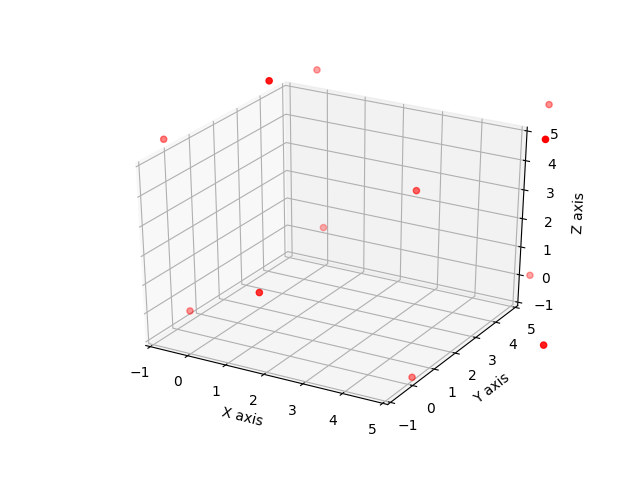

shape = 3
simulation time is 47
[-2.439314416219148, -2.4393144162191485, -2.4393144162191485]
[-2.8536151472561992, -2.8536151472561992, 3.3333333333333335]
[-2.4393144162191485, -2.4393144162191485, 9.105981082885815]
[-2.8536151472561992, 3.3333333333333335, -2.8536151472561992]
[-3.3853415587269304, 3.3333333333333335, 3.3333333333333335]
[-2.8536151472561992, 3.3333333333333335, 9.520281813922868]
[-2.4393144162191485, 9.105981082885815, -2.4393144162191485]
[-2.8536151472561992, 9.520281813922868, 3.3333333333333335]
[-2.4393144162191485, 9.105981082885815, 9.105981082885815]
[3.3333333333333335, -2.8536151472561992, -2.8536151472561992]
[3.3333333333333335, -3.3853415587269304, 3.3333333333333335]
[3.3333333333333335, -2.8536151472561992, 9.520281813922868]
[3.3333333333333335, 3.3333333333333335, -3.3853415587269304]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.052008225393601]
[3.3333333333333335, 9.520281813922868, -

<IPython.core.display.Javascript object>

shape = 3
simulation time is 48
[-2.525290824631343, -2.5252908246313437, -2.5252908246313437]
[-2.953851663063257, -2.953851663063257, 3.3333333333333335]
[-2.5252908246313437, -2.5252908246313437, 9.19195749129801]
[-2.953851663063257, 3.3333333333333335, -2.953851663063257]
[-3.504547551189304, 3.3333333333333335, 3.3333333333333335]
[-2.953851663063257, 3.3333333333333335, 9.620518329729926]
[-2.5252908246313437, 9.19195749129801, -2.5252908246313437]
[-2.953851663063257, 9.620518329729926, 3.3333333333333335]
[-2.5252908246313437, 9.19195749129801, 9.19195749129801]
[3.3333333333333335, -2.953851663063257, -2.953851663063257]
[3.3333333333333335, -3.504547551189304, 3.3333333333333335]
[3.3333333333333335, -2.953851663063257, 9.620518329729926]
[3.3333333333333335, 3.3333333333333335, -3.504547551189304]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.171214217855974]
[3.3333333333333335, 9.620518329729926, -2.95385166306325

<IPython.core.display.Javascript object>

shape = 3
simulation time is 49
[-2.6120651020715444, -2.6120651020715453, -2.6120651020715453]
[-3.0550071335299616, -3.0550071335299616, 3.3333333333333335]
[-2.6120651020715453, -2.6120651020715453, 9.278731768738211]
[-3.0550071335299616, 3.3333333333333335, -3.0550071335299616]
[-3.6248632939653462, 3.3333333333333335, 3.3333333333333335]
[-3.0550071335299616, 3.3333333333333335, 9.72167380019663]
[-2.6120651020715453, 9.278731768738211, -2.6120651020715453]
[-3.0550071335299616, 9.72167380019663, 3.3333333333333335]
[-2.6120651020715453, 9.278731768738211, 9.278731768738211]
[3.3333333333333335, -3.0550071335299616, -3.0550071335299616]
[3.3333333333333335, -3.6248632939653462, 3.3333333333333335]
[3.3333333333333335, -3.0550071335299616, 9.72167380019663]
[3.3333333333333335, 3.3333333333333335, -3.6248632939653462]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.291529960632017]
[3.3333333333333335, 9.72167380019663, -3.0

<IPython.core.display.Javascript object>


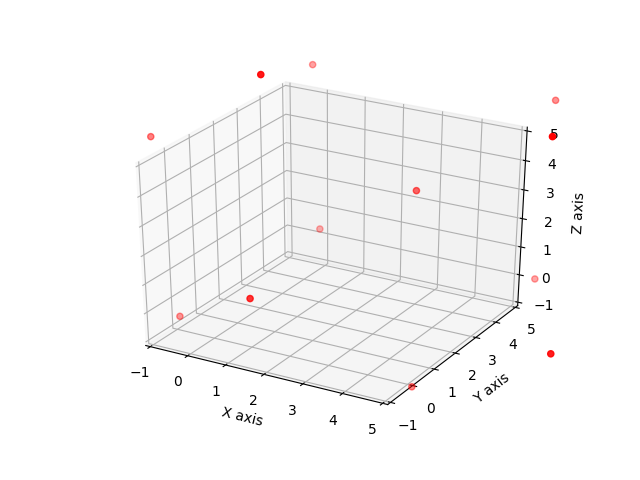

shape = 3
simulation time is 50
[-2.699612513888676, -2.699612513888677, -2.699612513888677]
[-3.1570530358397066, -3.1570530358397066, 3.3333333333333335]
[-2.699612513888677, -2.699612513888677, 9.366279180555344]
[-3.1570530358397066, 3.3333333333333335, -3.1570530358397066]
[-3.746254970889889, 3.3333333333333335, 3.3333333333333335]
[-3.1570530358397066, 3.3333333333333335, 9.823719702506375]
[-2.699612513888677, 9.366279180555344, -2.699612513888677]
[-3.1570530358397066, 9.823719702506375, 3.3333333333333335]
[-2.699612513888677, 9.366279180555344, 9.366279180555344]
[3.3333333333333335, -3.1570530358397066, -3.1570530358397066]
[3.3333333333333335, -3.746254970889889, 3.3333333333333335]
[3.3333333333333335, -3.1570530358397066, 9.823719702506375]
[3.3333333333333335, 3.3333333333333335, -3.746254970889889]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.41292163755656]
[3.3333333333333335, 9.823719702506375, -3.157053035

<IPython.core.display.Javascript object>


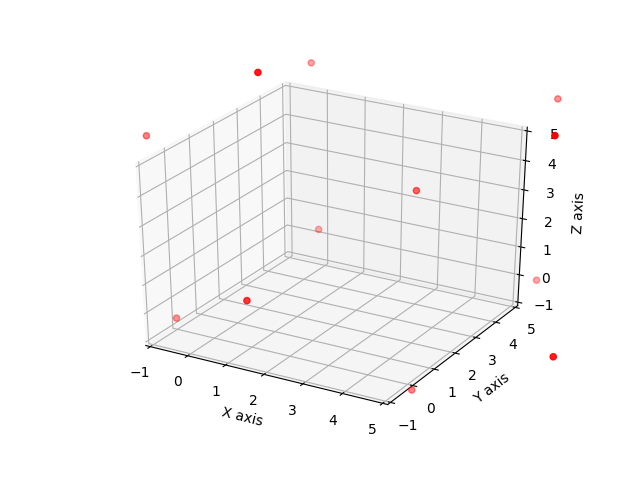

shape = 3
simulation time is 51
[-2.7879092469156155, -2.7879092469156164, -2.7879092469156164]
[-3.259961921977447, -3.259961921977447, 3.3333333333333335]
[-2.7879092469156164, -2.7879092469156164, 9.454575913582284]
[-3.259961921977447, 3.3333333333333335, -3.259961921977447]
[-3.8686900180788912, 3.3333333333333335, 3.3333333333333335]
[-3.259961921977447, 3.3333333333333335, 9.926628588644116]
[-2.7879092469156164, 9.454575913582284, -2.7879092469156164]
[-3.259961921977447, 9.926628588644116, 3.3333333333333335]
[-2.7879092469156164, 9.454575913582284, 9.454575913582284]
[3.3333333333333335, -3.259961921977447, -3.259961921977447]
[3.3333333333333335, -3.8686900180788912, 3.3333333333333335]
[3.3333333333333335, -3.259961921977447, 9.926628588644116]
[3.3333333333333335, 3.3333333333333335, -3.8686900180788912]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.535356684745562]
[3.3333333333333335, 9.926628588644116, -3.259961

<IPython.core.display.Javascript object>


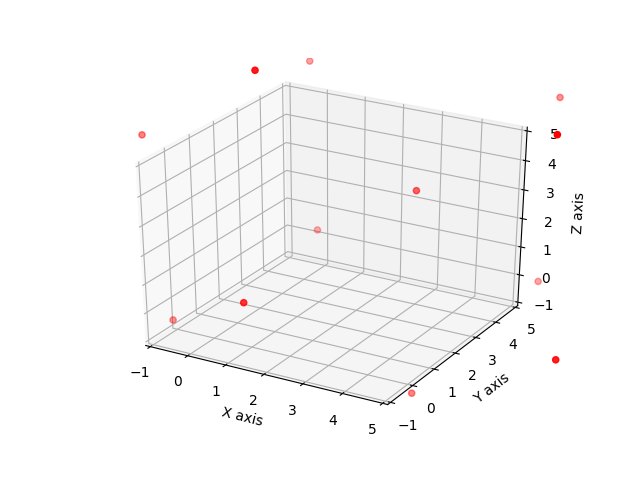

shape = 3
simulation time is 52
[-2.8769323760791052, -2.876932376079106, -2.876932376079106]
[-3.36370737840164, -3.36370737840164, 3.3333333333333335]
[-2.876932376079106, -2.876932376079106, 9.543599042745774]
[-3.36370737840164, 3.3333333333333335, -3.36370737840164]
[-3.9921370778007828, 3.3333333333333335, 3.3333333333333335]
[-3.36370737840164, 3.3333333333333335, 10.030374045068308]
[-2.876932376079106, 9.543599042745774, -2.876932376079106]
[-3.36370737840164, 10.030374045068308, 3.3333333333333335]
[-2.876932376079106, 9.543599042745774, 9.543599042745774]
[3.3333333333333335, -3.36370737840164, -3.36370737840164]
[3.3333333333333335, -3.9921370778007828, 3.3333333333333335]
[3.3333333333333335, -3.36370737840164, 10.030374045068308]
[3.3333333333333335, 3.3333333333333335, -3.9921370778007828]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.658803744467454]
[3.3333333333333335, 10.030374045068308, -3.36370737840164]
[3

<IPython.core.display.Javascript object>

shape = 3
simulation time is 53
[-2.966659831577838, -2.966659831577839, -2.966659831577839]
[-3.468263986572232, -3.468263986572232, 3.3333333333333335]
[-2.966659831577839, -2.966659831577839, 9.633326498244507]
[-3.4682639865722313, 3.3333333333333335, -3.468263986572232]
[-4.116565953290085, 3.3333333333333335, 3.3333333333333335]
[-3.4682639865722313, 3.3333333333333335, 10.1349306532389]
[-2.966659831577839, 9.633326498244507, -2.966659831577839]
[-3.4682639865722313, 10.1349306532389, 3.3333333333333335]
[-2.966659831577839, 9.633326498244507, 9.633326498244507]
[3.3333333333333335, -3.468263986572232, -3.468263986572232]
[3.3333333333333335, -4.116565953290085, 3.3333333333333335]
[3.3333333333333335, -3.4682639865722313, 10.1349306532389]
[3.3333333333333335, 3.3333333333333335, -4.116565953290085]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.783232619956756]
[3.3333333333333335, 10.1349306532389, -3.468263986572232]


<IPython.core.display.Javascript object>

shape = 3
simulation time is 54
[-3.057070366728625, -3.057070366728626, -3.057070366728626]
[-3.573607284431727, -3.573607284431727, 3.3333333333333335]
[-3.057070366728626, -3.057070366728626, 9.723737033395293]
[-3.5736072844317266, 3.3333333333333335, -3.573607284431727]
[-4.2419475646156, 3.3333333333333335, 3.3333333333333335]
[-3.5736072844317266, 3.3333333333333335, 10.240273951098395]
[-3.057070366728626, 9.723737033395293, -3.057070366728626]
[-3.5736072844317266, 10.240273951098395, 3.3333333333333335]
[-3.057070366728626, 9.723737033395293, 9.723737033395293]
[3.3333333333333335, -3.573607284431727, -3.573607284431727]
[3.3333333333333335, -4.2419475646156, 3.3333333333333335]
[3.3333333333333335, -3.5736072844317266, 10.240273951098395]
[3.3333333333333335, 3.3333333333333335, -4.2419475646156]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.908614231282272]
[3.3333333333333335, 10.240273951098395, -3.573607284431727

<IPython.core.display.Javascript object>


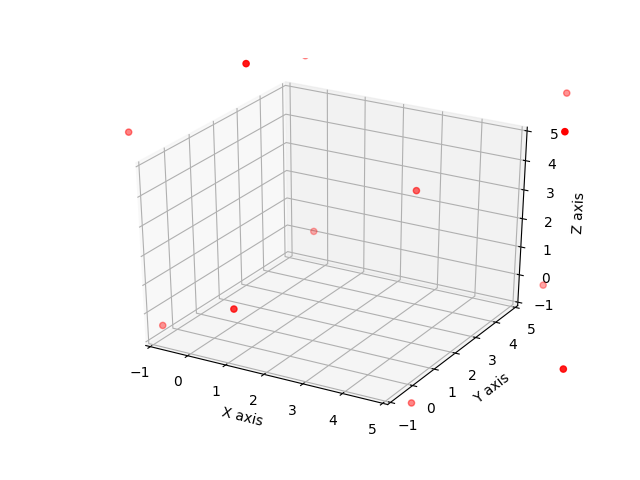

shape = 3
simulation time is 55
[-3.1481435265606335, -3.1481435265606343, -3.1481435265606343]
[-3.679713728914546, -3.679713728914546, 3.3333333333333335]
[-3.1481435265606343, -3.1481435265606343, 9.814810193227302]
[-3.679713728914545, 3.3333333333333335, -3.679713728914546]
[-4.368253905690786, 3.3333333333333335, 3.3333333333333335]
[-3.679713728914545, 3.3333333333333335, 10.346380395581214]
[-3.1481435265606343, 9.814810193227302, -3.1481435265606343]
[-3.679713728914545, 10.346380395581214, 3.3333333333333335]
[-3.1481435265606343, 9.814810193227302, 9.814810193227302]
[3.3333333333333335, -3.679713728914546, -3.679713728914546]
[3.3333333333333335, -4.368253905690786, 3.3333333333333335]
[3.3333333333333335, -3.679713728914545, 10.346380395581214]
[3.3333333333333335, 3.3333333333333335, -4.368253905690786]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.034920572357457]
[3.3333333333333335, 10.346380395581214, -3.67971

<IPython.core.display.Javascript object>

shape = 3
simulation time is 56
[-3.239859617220318, -3.239859617220319, -3.239859617220319]
[-3.7865606595410086, -3.7865606595410086, 3.3333333333333335]
[-3.239859617220319, -3.239859617220319, 9.906526283886986]
[-3.7865606595410077, 3.3333333333333335, -3.7865606595410086]
[-4.4954580024925965, 3.3333333333333335, 3.3333333333333335]
[-3.7865606595410077, 3.3333333333333335, 10.453227326207676]
[-3.239859617220319, 9.906526283886986, -3.239859617220319]
[-3.7865606595410077, 10.453227326207676, 3.3333333333333335]
[-3.239859617220319, 9.906526283886986, 9.906526283886986]
[3.3333333333333335, -3.7865606595410086, -3.7865606595410086]
[3.3333333333333335, -4.4954580024925965, 3.3333333333333335]
[3.3333333333333335, -3.7865606595410077, 10.453227326207676]
[3.3333333333333335, 3.3333333333333335, -4.4954580024925965]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.162124669159269]
[3.3333333333333335, 10.453227326207676, -3.7

<IPython.core.display.Javascript object>

shape = 3
simulation time is 57
[-3.332199676234623, -3.332199676234624, -3.332199676234624]
[-3.894126263136108, -3.894126263136108, 3.3333333333333335]
[-3.332199676234624, -3.332199676234624, 9.998866342901291]
[-3.894126263136107, 3.3333333333333335, -3.894126263136108]
[-4.623533872536752, 3.3333333333333335, 3.3333333333333335]
[-3.894126263136107, 3.3333333333333335, 10.560792929802776]
[-3.332199676234624, 9.998866342901291, -3.332199676234624]
[-3.894126263136107, 10.560792929802776, 3.3333333333333335]
[-3.332199676234624, 9.998866342901291, 9.998866342901291]
[3.3333333333333335, -3.894126263136108, -3.894126263136108]
[3.3333333333333335, -4.623533872536752, 3.3333333333333335]
[3.3333333333333335, -3.894126263136107, 10.560792929802776]
[3.3333333333333335, 3.3333333333333335, -4.623533872536752]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.290200539203424]
[3.3333333333333335, 10.560792929802776, -3.8941262631361

<IPython.core.display.Javascript object>


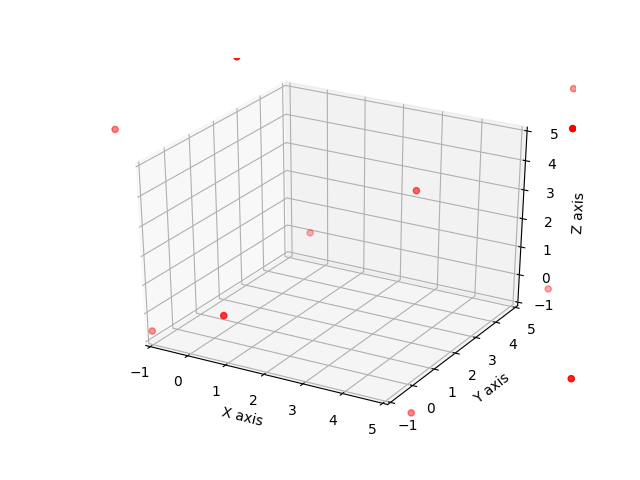

shape = 3
simulation time is 58
[-3.4251454436670423, -3.425145443667043, -3.425145443667043]
[-4.002389539699402, -4.002389539699402, 3.3333333333333335]
[-3.425145443667043, -3.425145443667043, 10.09181211033371]
[-4.002389539699401, 3.3333333333333335, -4.002389539699402]
[-4.752456485641665, 3.3333333333333335, 3.3333333333333335]
[-4.002389539699401, 3.3333333333333335, 10.66905620636607]
[-3.425145443667043, 10.09181211033371, -3.425145443667043]
[-4.002389539699401, 10.66905620636607, 3.3333333333333335]
[-3.425145443667043, 10.09181211033371, 10.09181211033371]
[3.3333333333333335, -4.002389539699402, -4.002389539699402]
[3.3333333333333335, -4.752456485641665, 3.3333333333333335]
[3.3333333333333335, -4.002389539699401, 10.66905620636607]
[3.3333333333333335, 3.3333333333333335, -4.752456485641665]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.419123152308337]
[3.3333333333333335, 10.66905620636607, -4.002389539699402]

<IPython.core.display.Javascript object>

shape = 3
simulation time is 59
[-3.5186793341899856, -3.5186793341899865, -3.5186793341899865]
[-4.111330269440606, -4.111330269440606, 3.3333333333333335]
[-3.5186793341899865, -3.5186793341899865, 10.185346000856653]
[-4.1113302694406055, 3.3333333333333335, -4.111330269440606]
[-4.882201725999926, 3.3333333333333335, 3.3333333333333335]
[-4.1113302694406055, 3.3333333333333335, 10.777996936107275]
[-3.5186793341899865, 10.185346000856653, -3.5186793341899865]
[-4.1113302694406055, 10.777996936107275, 3.3333333333333335]
[-3.5186793341899865, 10.185346000856653, 10.185346000856653]
[3.3333333333333335, -4.111330269440606, -4.111330269440606]
[3.3333333333333335, -4.882201725999926, 3.3333333333333335]
[3.3333333333333335, -4.1113302694406055, 10.777996936107275]
[3.3333333333333335, 3.3333333333333335, -4.882201725999926]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.548868392666598]
[3.3333333333333335, 10.777996936107275, 

In [17]:
#%lprun plasma_random_Charges(print_all=True)
#%lprun -f jefimenko.charge_current_integrals.field_calculator count = charged_Permittivity_ball()


%lprun -f jefimenko.plasma.plasma_simulation count = plasma_random_Charges(print_all = True)


#%lprun -f jefimenko.plasma.simulate_location count = plasma_random_Charges(print_all = True)
#%lprun -f jefimenko.charge_current_integrals.field_calculator count = plasma_random_Charges(print_all = True)

In [18]:
def plasma_random_Charges(print_all=False):
    time_L = 6
    delta_t = .1
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[5,5,5],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=[0,0,0],
                constant_H=[0,0,0]
        )
    A = 3
    for i in range(A):
        for j in range(A):
            for k in range(A):
                location = [10 / A * i, 10 / A * j, 10 / A * k]
                print(location)
                mapping.Add_Charge(location, Q = .00001, velocity=[0,0,0], acceleration=[0,0,0], mass=1)
    
    print('simulation starting')
    #jefimenko.simulate(mapping)
    jefimenko.plasma_simulation(mapping)
    #jefimenko.simulate(mapping)
    
    
    for time in range(int(time_L / delta_t)):
        jefimenko.plot_grid(mapping, time)
        #jefimenko.plot_EM_grid('E', mapping, time)
        #jefimenko.plot_EM_grid('H', mapping, time)
    #    print('simulation time is ' + str(time))
        for i in range(len(mapping.charges[time])):
            print(mapping.charges[time][i].location)
    #return()

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 6 seconds
each time step will be 0.1
the simulation will be composed of 60 time steps
[0.0, 0.0, 0.0]
[0.0, 0.0, 3.3333333333333335]
[0.0, 0.0, 6.666666666666667]
[0.0, 3.3333333333333335, 0.0]
[0.0, 3.3333333333333335, 3.3333333333333335]
[0.0, 3.3333333333333335, 6.666666666666667]
[0.0, 6.666666666666667, 0.0]
[0.0, 6.666666666666667, 3.3333333333333335]
[0.0, 6.666666666666667, 6.666666666666667]
[3.3333333333333335, 0.0, 0.0]
[3.3333333333333335, 0.0, 3.3333333333333335]
[3.3333333333333335, 0.0, 6.666666666666667]
[3.3333333333333335, 3.3333333333333335, 0.0]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.666666666666667]
[3.3333333333333335, 6.666666666666667, 0.0]
[3.3333333333333335, 6.666666666666667, 3.3333333333333335]
[3.3333333333333335, 6.666666666666667, 6.666666666666667]
[6.666666666666667, 0.0, 0.0]
[6.666666666666667, 

<IPython.core.display.Javascript object>

shape = 3
[0.0, 0.0, 0.0]
[0.0, 0.0, 3.3333333333333335]
[0.0, 0.0, 6.666666666666667]
[0.0, 3.3333333333333335, 0.0]
[0.0, 3.3333333333333335, 3.3333333333333335]
[0.0, 3.3333333333333335, 6.666666666666667]
[0.0, 6.666666666666667, 0.0]
[0.0, 6.666666666666667, 3.3333333333333335]
[0.0, 6.666666666666667, 6.666666666666667]
[3.3333333333333335, 0.0, 0.0]
[3.3333333333333335, 0.0, 3.3333333333333335]
[3.3333333333333335, 0.0, 6.666666666666667]
[3.3333333333333335, 3.3333333333333335, 0.0]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.666666666666667]
[3.3333333333333335, 6.666666666666667, 0.0]
[3.3333333333333335, 6.666666666666667, 3.3333333333333335]
[3.3333333333333335, 6.666666666666667, 6.666666666666667]
[6.666666666666667, 0.0, 0.0]
[6.666666666666667, 0.0, 3.3333333333333335]
[6.666666666666667, 0.0, 6.666666666666667]
[6.666666666666667, 3.3333333333333335, 0.0]
[6.666666666666667, 3.3333333333333335, 3.3333333333333

<IPython.core.display.Javascript object>

shape = 3
[-0.002724673213623441, -0.002724673213623441, -0.002724673213623441]
[-0.003208376016032691, -0.003208376016032691, 3.3333333333333335]
[-0.002724673213623441, -0.002724673213623441, 6.66939133988029]
[-0.003208376016032691, 3.3333333333333335, -0.003208376016032691]
[-0.0037967895047104857, 3.3333333333333335, 3.3333333333333335]
[-0.003208376016032691, 3.3333333333333335, 6.669875042682699]
[-0.002724673213623441, 6.66939133988029, -0.002724673213623441]
[-0.00320837601603269, 6.669875042682699, 3.3333333333333335]
[-0.002724673213623441, 6.66939133988029, 6.66939133988029]
[3.3333333333333335, -0.00320837601603269, -0.00320837601603269]
[3.3333333333333335, -0.0037967895047104853, 3.3333333333333335]
[3.3333333333333335, -0.00320837601603269, 6.669875042682699]
[3.3333333333333335, 3.3333333333333335, -0.0037967895047104853]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.670463456171378]
[3.3333333333333335, 6.66987

<IPython.core.display.Javascript object>


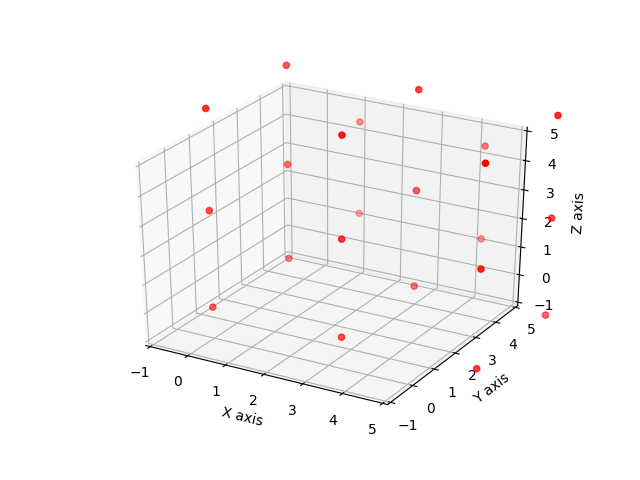

shape = 3
[-0.008169096154923308, -0.00816909615492331, -0.008169096154923308]
[-0.009619060224392892, -0.009619060224392892, 3.3333333333333335]
[-0.008169096154923308, -0.008169096154923308, 6.67483576282159]
[-0.009619060224392892, 3.3333333333333335, -0.009619060224392892]
[-0.011383233719408923, 3.3333333333333335, 3.3333333333333335]
[-0.009619060224392894, 3.3333333333333335, 6.676285726891059]
[-0.008169096154923308, 6.67483576282159, -0.008169096154923308]
[-0.009619060224392892, 6.676285726891059, 3.3333333333333335]
[-0.008169096154923308, 6.67483576282159, 6.67483576282159]
[3.3333333333333335, -0.009619060224392892, -0.009619060224392892]
[3.3333333333333335, -0.011383233719408923, 3.3333333333333335]
[3.3333333333333335, -0.009619060224392892, 6.676285726891059]
[3.3333333333333335, 3.3333333333333335, -0.011383233719408923]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.6780499003860765]
[3.3333333333333335, 6.6762

<IPython.core.display.Javascript object>


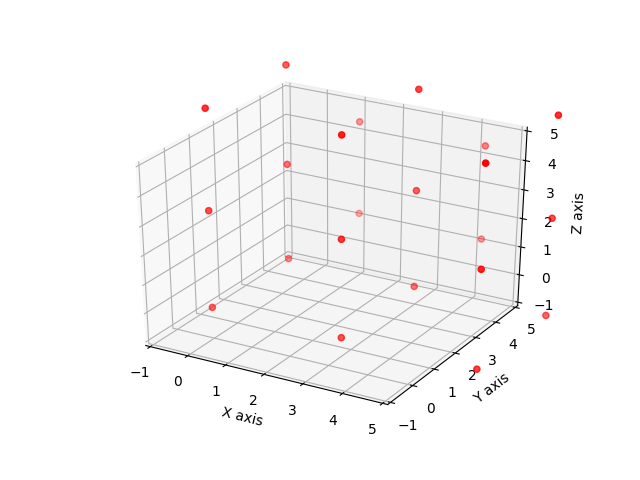

shape = 3
[-0.016323470015015197, -0.016323470015015204, -0.016323470015015197]
[-0.019219980213025407, -0.019219980213025414, 3.3333333333333335]
[-0.016323470015015197, -0.016323470015015197, 6.682990136681681]
[-0.019219980213025407, 3.3333333333333335, -0.019219980213025414]
[-0.022745138592359875, 3.3333333333333335, 3.3333333333333335]
[-0.019219980213025414, 3.3333333333333335, 6.685886646879692]
[-0.016323470015015197, 6.682990136681681, -0.016323470015015197]
[-0.019219980213025414, 6.685886646879692, 3.3333333333333335]
[-0.016323470015015197, 6.682990136681681, 6.682990136681681]
[3.3333333333333335, -0.019219980213025407, -0.019219980213025414]
[3.3333333333333335, -0.02274513859235988, 3.3333333333333335]
[3.3333333333333335, -0.019219980213025414, 6.685886646879692]
[3.3333333333333335, 3.3333333333333335, -0.02274513859235988]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.689411805259027]
[3.3333333333333335, 6.68

<IPython.core.display.Javascript object>


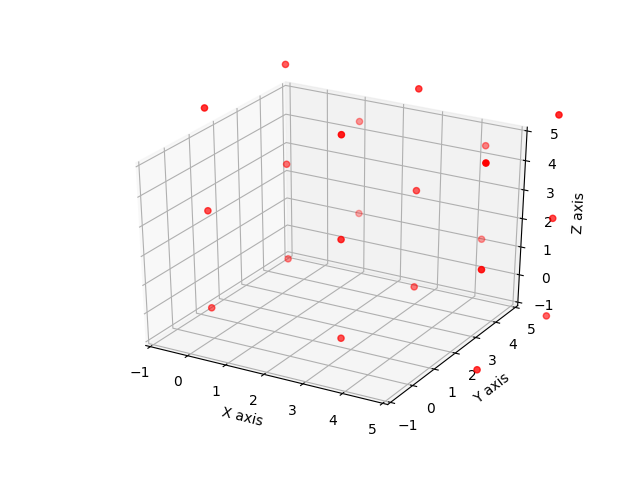

shape = 3
[-0.027173215865012774, -0.027173215865012784, -0.027173215865012774]
[-0.03199318386140601, -0.03199318386140602, 3.3333333333333335]
[-0.027173215865012774, -0.027173215865012774, 6.6938398825316785]
[-0.03199318386140601, 3.3333333333333335, -0.03199318386140602]
[-0.03786139992715965, 3.3333333333333335, 3.3333333333333335]
[-0.03199318386140602, 3.3333333333333335, 6.698659850528073]
[-0.027173215865012774, 6.6938398825316785, -0.027173215865012774]
[-0.03199318386140602, 6.698659850528073, 3.3333333333333335]
[-0.027173215865012774, 6.6938398825316785, 6.6938398825316785]
[3.3333333333333335, -0.03199318386140601, -0.03199318386140602]
[3.3333333333333335, -0.03786139992715966, 3.3333333333333335]
[3.3333333333333335, -0.03199318386140602, 6.698659850528073]
[3.3333333333333335, 3.3333333333333335, -0.03786139992715966]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.704528066593827]
[3.3333333333333335, 6.69865985

<IPython.core.display.Javascript object>

shape = 3
[-0.04069911470285239, -0.0406991147028524, -0.04069911470285239]
[-0.04791502276077253, -0.047915022760772544, 3.3333333333333335]
[-0.04069911470285239, -0.04069911470285239, 6.707365781369518]
[-0.04791502276077253, 3.3333333333333335, -0.047915022760772544]
[-0.056704222244693146, 3.3333333333333335, 3.3333333333333335]
[-0.047915022760772544, 3.3333333333333335, 6.7145816894274395]
[-0.04069911470285239, 6.707365781369518, -0.04069911470285239]
[-0.047915022760772544, 6.7145816894274395, 3.3333333333333335]
[-0.04069911470285239, 6.707365781369518, 6.707365781369518]
[3.3333333333333335, -0.04791502276077253, -0.047915022760772544]
[3.3333333333333335, -0.05670422224469315, 3.3333333333333335]
[3.3333333333333335, -0.047915022760772544, 6.7145816894274395]
[3.3333333333333335, 3.3333333333333335, -0.05670422224469315]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.723370888911361]
[3.3333333333333335, 6.71458168942

<IPython.core.display.Javascript object>

shape = 3
[-0.056877489164063336, -0.056877489164063356, -0.056877489164063336]
[-0.06695638969396625, -0.06695638969396626, 3.3333333333333335]
[-0.056877489164063336, -0.056877489164063336, 6.723544155830728]
[-0.06695638969396625, 3.3333333333333335, -0.06695638969396626]
[-0.07923940188298856, 3.3333333333333335, 3.3333333333333335]
[-0.06695638969396626, 3.3333333333333335, 6.733623056360633]
[-0.056877489164063336, 6.723544155830728, -0.056877489164063336]
[-0.06695638969396626, 6.733623056360633, 3.3333333333333335]
[-0.056877489164063336, 6.723544155830728, 6.723544155830728]
[3.3333333333333335, -0.06695638969396625, -0.06695638969396626]
[3.3333333333333335, -0.07923940188298857, 3.3333333333333335]
[3.3333333333333335, -0.06695638969396626, 6.733623056360633]
[3.3333333333333335, 3.3333333333333335, -0.07923940188298857]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.745906068549656]
[3.3333333333333335, 6.733623056360

<IPython.core.display.Javascript object>


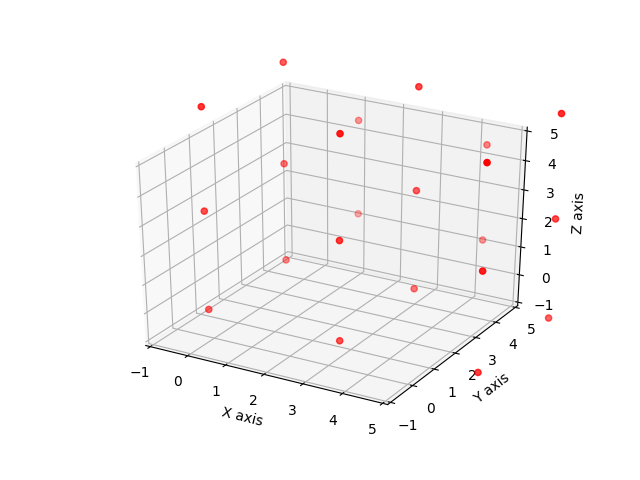

shape = 3
[-0.07568042286275196, -0.07568042286275199, -0.07568042286275196]
[-0.08908300451655743, -0.08908300451655746, 3.3333333333333335]
[-0.07568042286275196, -0.07568042286275196, 6.742347089529417]
[-0.08908300451655743, 3.3333333333333335, -0.08908300451655746]
[-0.10542666739214088, 3.3333333333333335, 3.3333333333333335]
[-0.08908300451655746, 3.3333333333333335, 6.755749671183224]
[-0.07568042286275196, 6.742347089529417, -0.07568042286275196]
[-0.08908300451655746, 6.755749671183224, 3.3333333333333335]
[-0.07568042286275196, 6.742347089529417, 6.742347089529417]
[3.3333333333333335, -0.08908300451655743, -0.08908300451655746]
[3.3333333333333335, -0.10542666739214089, 3.3333333333333335]
[3.3333333333333335, -0.08908300451655746, 6.755749671183224]
[3.3333333333333335, 3.3333333333333335, -0.10542666739214089]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.772093334058809]
[3.3333333333333335, 6.755749671183224, -0.

<IPython.core.display.Javascript object>

shape = 3
[-0.0970760126347994, -0.09707601263479942, -0.0970760126347994]
[-0.1142557418452923, -0.11425574184529233, 3.3333333333333335]
[-0.0970760126347994, -0.0970760126347994, 6.7637426793014646]
[-0.1142557418452923, 3.3333333333333335, -0.11425574184529233]
[-0.13522006915927515, 3.3333333333333335, 3.3333333333333335]
[-0.11425574184529233, 3.3333333333333335, 6.780922408511959]
[-0.0970760126347994, 6.7637426793014646, -0.0970760126347994]
[-0.11425574184529233, 6.780922408511959, 3.3333333333333335]
[-0.0970760126347994, 6.7637426793014646, 6.7637426793014646]
[3.3333333333333335, -0.1142557418452923, -0.11425574184529233]
[3.3333333333333335, -0.13522006915927515, 3.3333333333333335]
[3.3333333333333335, -0.11425574184529233, 6.780922408511959]
[3.3333333333333335, 3.3333333333333335, -0.13522006915927515]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.801886735825943]
[3.3333333333333335, 6.780922408511959, -0.114255

<IPython.core.display.Javascript object>

shape = 3
[-0.12102864844076586, -0.1210286484407659, -0.12102864844076587]
[-0.14243099329405512, -0.14243099329405517, 3.3333333333333335]
[-0.12102864844076587, -0.12102864844076587, 6.787695315107431]
[-0.14243099329405512, 3.3333333333333335, -0.14243099329405517]
[-0.16856840941849785, 3.3333333333333335, 3.3333333333333335]
[-0.14243099329405517, 3.3333333333333335, 6.809097659960722]
[-0.12102864844076587, 6.787695315107431, -0.12102864844076587]
[-0.14243099329405517, 6.809097659960722, 3.3333333333333335]
[-0.12102864844076587, 6.787695315107431, 6.787695315107431]
[3.3333333333333335, -0.14243099329405512, -0.14243099329405517]
[3.3333333333333335, -0.16856840941849788, 3.3333333333333335]
[3.3333333333333335, -0.14243099329405517, 6.809097659960722]
[3.3333333333333335, 3.3333333333333335, -0.16856840941849788]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.835235076085166]
[3.3333333333333335, 6.809097659960722, -0.1

<IPython.core.display.Javascript object>


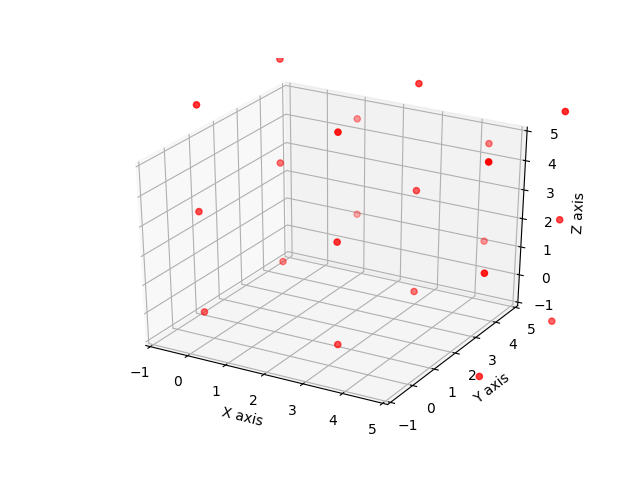

shape = 3
[-0.14749931536106592, -0.14749931536106597, -0.14749931536106592]
[-0.17356105661244753, -0.17356105661244758, 3.3333333333333335]
[-0.14749931536106592, -0.14749931536106592, 6.814165982027731]
[-0.17356105661244753, 3.3333333333333335, -0.17356105661244758]
[-0.20541570337386744, 3.3333333333333335, 3.3333333333333335]
[-0.17356105661244758, 3.3333333333333335, 6.840227723279114]
[-0.14749931536106592, 6.814165982027731, -0.14749931536106592]
[-0.17356105661244758, 6.840227723279114, 3.3333333333333335]
[-0.14749931536106592, 6.814165982027731, 6.814165982027731]
[3.3333333333333335, -0.17356105661244753, -0.17356105661244758]
[3.3333333333333335, -0.20541570337386747, 3.3333333333333335]
[3.3333333333333335, -0.17356105661244758, 6.840227723279114]
[3.3333333333333335, 3.3333333333333335, -0.20541570337386747]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.872082370040535]
[3.3333333333333335, 6.840227723279114, -0.

<IPython.core.display.Javascript object>


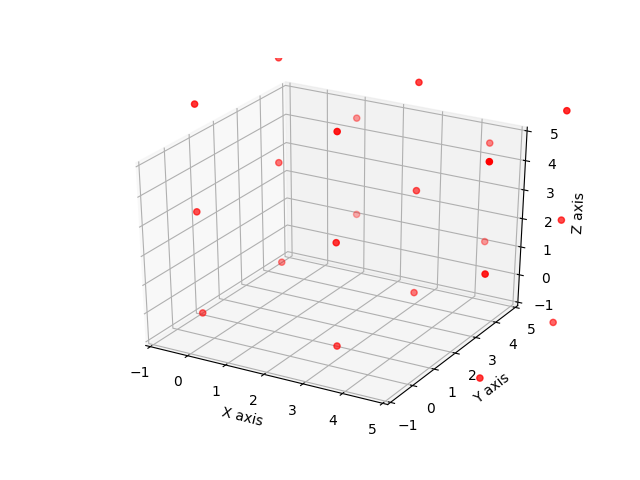

shape = 3
[-0.1764459119801681, -0.17644591198016815, -0.1764459119801681]
[-0.20759454397245405, -0.2075945439724541, 3.3333333333333335]
[-0.1764459119801681, -0.1764459119801681, 6.843112578646833]
[-0.20759454397245405, 3.3333333333333335, -0.2075945439724541]
[-0.24570166207937966, 3.3333333333333335, 3.3333333333333335]
[-0.2075945439724541, 3.3333333333333335, 6.874261210639121]
[-0.1764459119801681, 6.843112578646833, -0.1764459119801681]
[-0.2075945439724541, 6.874261210639121, 3.3333333333333335]
[-0.1764459119801681, 6.843112578646833, 6.843112578646833]
[3.3333333333333335, -0.20759454397245405, -0.2075945439724541]
[3.3333333333333335, -0.24570166207937968, 3.3333333333333335]
[3.3333333333333335, -0.2075945439724541, 6.874261210639121]
[3.3333333333333335, 3.3333333333333335, -0.24570166207937968]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.912368328746047]
[3.3333333333333335, 6.874261210639121, -0.2075945439724

<IPython.core.display.Javascript object>

shape = 3
[-0.20782357950005248, -0.20782357950005254, -0.20782357950005248]
[-0.24447680179484033, -0.24447680179484038, 3.3333333333333335]
[-0.20782357950005248, -0.20782357950005248, 6.874490246166718]
[-0.24447680179484033, 3.3333333333333335, -0.24447680179484038]
[-0.28936218795031854, 3.3333333333333335, 3.3333333333333335]
[-0.24447680179484038, 3.3333333333333335, 6.911143468461507]
[-0.20782357950005248, 6.874490246166718, -0.20782357950005248]
[-0.24447680179484038, 6.911143468461507, 3.3333333333333335]
[-0.20782357950005248, 6.874490246166718, 6.874490246166718]
[3.3333333333333335, -0.24447680179484033, -0.24447680179484038]
[3.3333333333333335, -0.2893621879503186, 3.3333333333333335]
[3.3333333333333335, -0.24447680179484038, 6.911143468461507]
[3.3333333333333335, 3.3333333333333335, -0.2893621879503186]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.956028854616986]
[3.3333333333333335, 6.911143468461507, -0.24

<IPython.core.display.Javascript object>

shape = 3
[-0.24158503612823967, -0.24158503612823973, -0.24158503612823967]
[-0.284150334877757, -0.28415033487775704, 3.3333333333333335]
[-0.24158503612823967, -0.24158503612823967, 6.908251702794905]
[-0.284150334877757, 3.3333333333333335, -0.28415033487775704]
[-0.3363298742823846, 3.3333333333333335, 3.3333333333333335]
[-0.28415033487775704, 3.3333333333333335, 6.950817001544424]
[-0.24158503612823967, 6.908251702794905, -0.24158503612823967]
[-0.28415033487775704, 6.950817001544424, 3.3333333333333335]
[-0.24158503612823967, 6.908251702794905, 6.908251702794905]
[3.3333333333333335, -0.284150334877757, -0.28415033487775704]
[3.3333333333333335, -0.33632987428238464, 3.3333333333333335]
[3.3333333333333335, -0.28415033487775704, 6.950817001544424]
[3.3333333333333335, 3.3333333333333335, -0.33632987428238464]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.002996540949052]
[3.3333333333333335, 6.950817001544424, -0.2841503

<IPython.core.display.Javascript object>


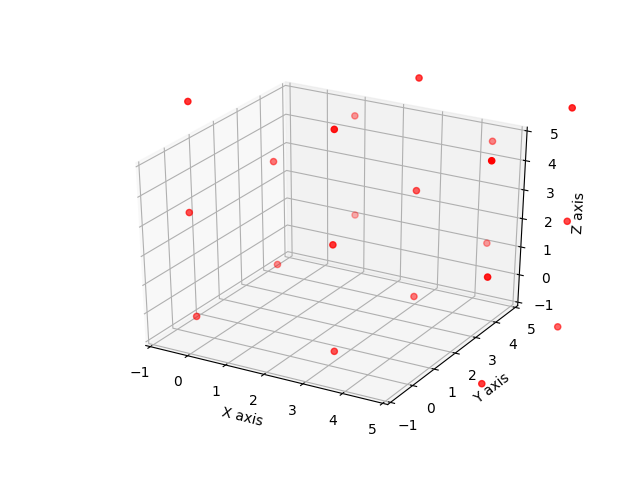

shape = 3
[-0.2776809116287424, -0.2776809116287425, -0.2776809116287424]
[-0.3265552281462227, -0.32655522814622273, 3.3333333333333335]
[-0.2776809116287424, -0.2776809116287424, 6.944347578295408]
[-0.3265552281462227, 3.3333333333333335, -0.32655522814622273]
[-0.38653450087661695, 3.3333333333333335, 3.3333333333333335]
[-0.32655522814622273, 3.3333333333333335, 6.99322189481289]
[-0.2776809116287424, 6.944347578295408, -0.2776809116287424]
[-0.32655522814622273, 6.99322189481289, 3.3333333333333335]
[-0.2776809116287424, 6.944347578295408, 6.944347578295408]
[3.3333333333333335, -0.3265552281462227, -0.32655522814622273]
[3.3333333333333335, -0.386534500876617, 3.3333333333333335]
[3.3333333333333335, -0.32655522814622273, 6.99322189481289]
[3.3333333333333335, 3.3333333333333335, -0.386534500876617]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.053201167543285]
[3.3333333333333335, 6.99322189481289, -0.3265552281462227]
[

<IPython.core.display.Javascript object>

shape = 3
[-0.3160600773777903, -0.3160600773777904, -0.3160600773777903]
[-0.37162956003889996, -0.3716295600389, 3.3333333333333335]
[-0.3160600773777903, -0.3160600773777903, 6.982726744044456]
[-0.37162956003889996, 3.3333333333333335, -0.3716295600389]
[-0.43990351875242434, 3.3333333333333335, 3.3333333333333335]
[-0.3716295600389, 3.3333333333333335, 7.038296226705567]
[-0.3160600773777903, 6.982726744044456, -0.3160600773777903]
[-0.3716295600389, 7.038296226705567, 3.3333333333333335]
[-0.3160600773777903, 6.982726744044456, 6.982726744044456]
[3.3333333333333335, -0.37162956003889996, -0.3716295600389]
[3.3333333333333335, -0.4399035187524244, 3.3333333333333335]
[3.3333333333333335, -0.3716295600389, 7.038296226705567]
[3.3333333333333335, 3.3333333333333335, -0.4399035187524244]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.106570185419092]
[3.3333333333333335, 7.038296226705567, -0.37162956003889996]
[3.333333333333

<IPython.core.display.Javascript object>


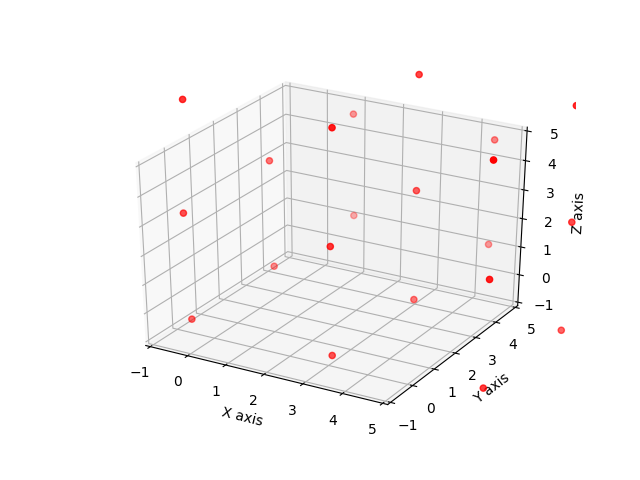

shape = 3
[-0.35666996780087323, -0.35666996780087334, -0.35666996780087323]
[-0.4193098023428479, -0.419309802342848, 3.3333333333333335]
[-0.35666996780087323, -0.35666996780087323, 7.0233366344675385]
[-0.4193098023428479, 3.3333333333333335, -0.419309802342848]
[-0.4963625179208762, 3.3333333333333335, 3.3333333333333335]
[-0.419309802342848, 3.3333333333333335, 7.085976469009515]
[-0.35666996780087323, 7.0233366344675385, -0.35666996780087323]
[-0.419309802342848, 7.085976469009515, 3.3333333333333335]
[-0.35666996780087323, 7.0233366344675385, 7.0233366344675385]
[3.3333333333333335, -0.4193098023428479, -0.419309802342848]
[3.3333333333333335, -0.49636251792087627, 3.3333333333333335]
[3.3333333333333335, -0.419309802342848, 7.085976469009515]
[3.3333333333333335, 3.3333333333333335, -0.49636251792087627]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.163029184587544]
[3.3333333333333335, 7.085976469009515, -0.419309802342

<IPython.core.display.Javascript object>

shape = 3
[-0.3994568896544104, -0.39945688965441056, -0.39945688965441045]
[-0.4695312021344631, -0.4695312021344631, 3.3333333333333335]
[-0.39945688965441045, -0.39945688965441045, 7.066123556321076]
[-0.4695312021344631, 3.3333333333333335, -0.4695312021344631]
[-0.5558356732320024, 3.3333333333333335, 3.3333333333333335]
[-0.46953120213446314, 3.3333333333333335, 7.136197868801131]
[-0.39945688965441045, 7.066123556321076, -0.39945688965441045]
[-0.46953120213446314, 7.136197868801131, 3.3333333333333335]
[-0.39945688965441045, 7.066123556321076, 7.066123556321076]
[3.3333333333333335, -0.4695312021344631, -0.46953120213446314]
[3.3333333333333335, -0.5558356732320024, 3.3333333333333335]
[3.3333333333333335, -0.46953120213446314, 7.136197868801131]
[3.3333333333333335, 3.3333333333333335, -0.5558356732320024]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.2225023398986705]
[3.3333333333333335, 7.136197868801131, -0.46953120

<IPython.core.display.Javascript object>


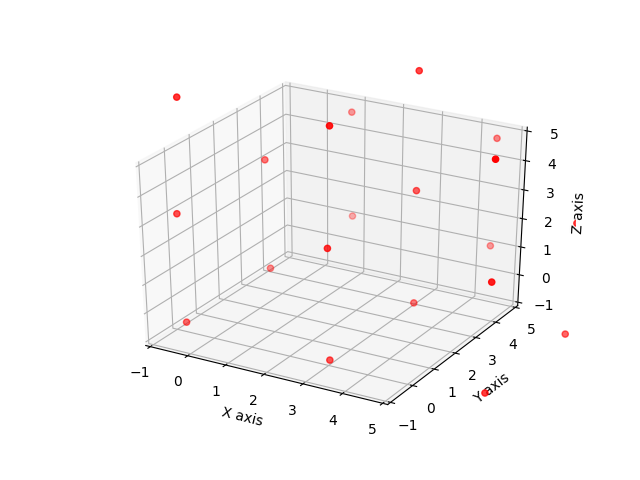

shape = 3
[-0.44436631622678285, -0.444366316226783, -0.4443663162267829]
[-0.5222281423463744, -0.5222281423463744, 3.3333333333333335]
[-0.4443663162267829, -0.4443663162267829, 7.111032982893448]
[-0.5222281423463744, 3.3333333333333335, -0.5222281423463744]
[-0.618246164355529, 3.3333333333333335, 3.3333333333333335]
[-0.5222281423463744, 3.3333333333333335, 7.188894809013042]
[-0.4443663162267829, 7.111032982893448, -0.4443663162267829]
[-0.5222281423463744, 7.188894809013042, 3.3333333333333335]
[-0.4443663162267829, 7.111032982893448, 7.111032982893448]
[3.3333333333333335, -0.5222281423463744, -0.5222281423463744]
[3.3333333333333335, -0.618246164355529, 3.3333333333333335]
[3.3333333333333335, -0.5222281423463744, 7.188894809013042]
[3.3333333333333335, 3.3333333333333335, -0.618246164355529]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.284912831022197]
[3.3333333333333335, 7.188894809013042, -0.5222281423463744]
[3.33

<IPython.core.display.Javascript object>

shape = 3
[-0.49134316414512624, -0.4913431641451264, -0.4913431641451263]
[-0.5773344783220368, -0.5773344783220368, 3.3333333333333335]
[-0.4913431641451263, -0.4913431641451263, 7.158009830811792]
[-0.5773344783220368, 3.3333333333333335, -0.5773344783220368]
[-0.683516566964435, 3.3333333333333335, 3.3333333333333335]
[-0.5773344783220368, 3.3333333333333335, 7.2440011449887045]
[-0.4913431641451263, 7.158009830811792, -0.4913431641451263]
[-0.5773344783220368, 7.2440011449887045, 3.3333333333333335]
[-0.4913431641451263, 7.158009830811792, 7.158009830811792]
[3.3333333333333335, -0.5773344783220368, -0.5773344783220368]
[3.3333333333333335, -0.683516566964435, 3.3333333333333335]
[3.3333333333333335, -0.5773344783220368, 7.2440011449887045]
[3.3333333333333335, 3.3333333333333335, -0.683516566964435]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.350183233631103]
[3.3333333333333335, 7.2440011449887045, -0.5773344783220368]


<IPython.core.display.Javascript object>


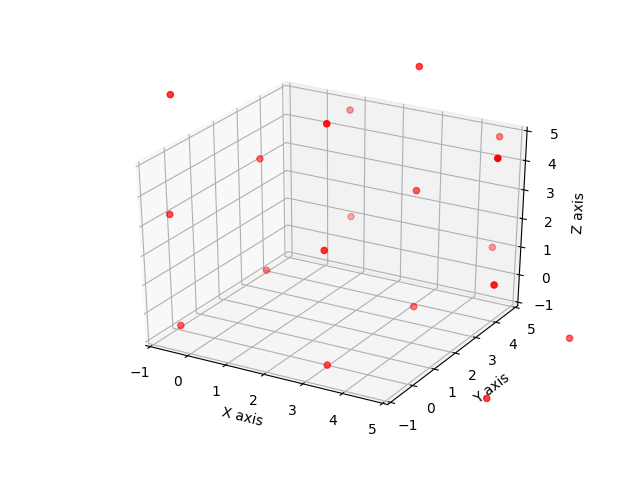

shape = 3
[-0.5403320510654931, -0.5403320510654932, -0.5403320510654931]
[-0.6347838485150996, -0.6347838485150996, 3.3333333333333335]
[-0.5403320510654931, -0.5403320510654931, 7.206998717732159]
[-0.6347838485150996, 3.3333333333333335, -0.6347838485150996]
[-0.7515692131338527, 3.3333333333333335, 3.3333333333333335]
[-0.6347838485150996, 3.3333333333333335, 7.3014505151817675]
[-0.5403320510654931, 7.206998717732159, -0.5403320510654931]
[-0.6347838485150996, 7.3014505151817675, 3.3333333333333335]
[-0.5403320510654931, 7.206998717732159, 7.206998717732159]
[3.3333333333333335, -0.6347838485150996, -0.6347838485150996]
[3.3333333333333335, -0.7515692131338527, 3.3333333333333335]
[3.3333333333333335, -0.6347838485150996, 7.3014505151817675]
[3.3333333333333335, 3.3333333333333335, -0.7515692131338527]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.418235879800521]
[3.3333333333333335, 7.3014505151817675, -0.6347838485150996

<IPython.core.display.Javascript object>

shape = 3
[-0.591277533078284, -0.5912775330782842, -0.5912775330782841]
[-0.6945099582190477, -0.6945099582190477, 3.3333333333333335]
[-0.5912775330782841, -0.5912775330782841, 7.25794419974495]
[-0.6945099582190477, 3.3333333333333335, -0.6945099582190477]
[-0.8223265198218167, 3.3333333333333335, 3.3333333333333335]
[-0.6945099582190477, 3.3333333333333335, 7.361176624885716]
[-0.5912775330782841, 7.25794419974495, -0.5912775330782841]
[-0.6945099582190477, 7.361176624885716, 3.3333333333333335]
[-0.5912775330782841, 7.25794419974495, 7.25794419974495]
[3.3333333333333335, -0.6945099582190477, -0.6945099582190477]
[3.3333333333333335, -0.8223265198218167, 3.3333333333333335]
[3.3333333333333335, -0.6945099582190477, 7.361176624885716]
[3.3333333333333335, 3.3333333333333335, -0.8223265198218167]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.488993186488485]
[3.3333333333333335, 7.361176624885716, -0.6945099582190477]
[3.3333

<IPython.core.display.Javascript object>

shape = 3
[-0.6441243211660238, -0.6441243211660241, -0.644124321166024]
[-0.7564468358604447, -0.7564468358604447, 3.3333333333333335]
[-0.644124321166024, -0.644124321166024, 7.310790987832689]
[-0.7564468358604447, 3.3333333333333335, -0.7564468358604447]
[-0.8957112850490633, 3.3333333333333335, 3.3333333333333335]
[-0.7564468358604447, 3.3333333333333335, 7.423113502527113]
[-0.644124321166024, 7.310790987832689, -0.644124321166024]
[-0.7564468358604447, 7.423113502527113, 3.3333333333333335]
[-0.644124321166024, 7.310790987832689, 7.310790987832689]
[3.3333333333333335, -0.7564468358604447, -0.7564468358604447]
[3.3333333333333335, -0.8957112850490633, 3.3333333333333335]
[3.3333333333333335, -0.7564468358604447, 7.423113502527113]
[3.3333333333333335, 3.3333333333333335, -0.8957112850490633]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.562377951715732]
[3.3333333333333335, 7.423113502527113, -0.7564468358604447]
[3.33333

<IPython.core.display.Javascript object>


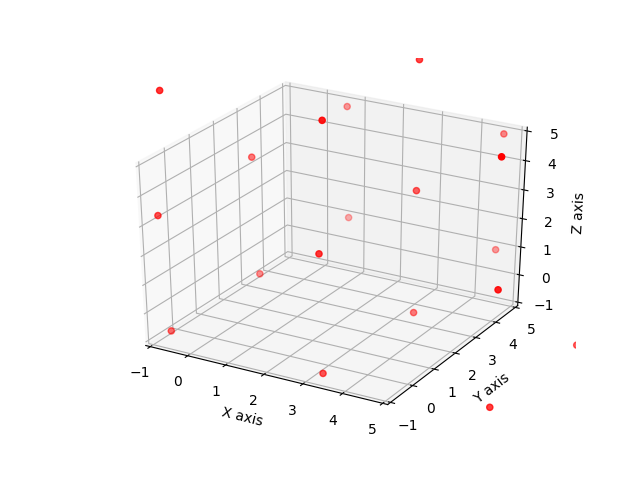

shape = 3
[-0.6988174764985181, -0.6988174764985184, -0.6988174764985183]
[-0.820529061948641, -0.820529061948641, 3.3333333333333335]
[-0.6988174764985183, -0.6988174764985183, 7.365484143165183]
[-0.820529061948641, 3.3333333333333335, -0.820529061948641]
[-0.9716469520356004, 3.3333333333333335, 3.3333333333333335]
[-0.820529061948641, 3.3333333333333335, 7.487195728615309]
[-0.6988174764985183, 7.365484143165183, -0.6988174764985183]
[-0.820529061948641, 7.487195728615309, 3.3333333333333335]
[-0.6988174764985183, 7.365484143165184, 7.365484143165184]
[3.3333333333333335, -0.820529061948641, -0.820529061948641]
[3.3333333333333335, -0.9716469520356005, 3.3333333333333335]
[3.3333333333333335, -0.820529061948641, 7.487195728615309]
[3.3333333333333335, 3.3333333333333335, -0.9716469520356005]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.638313618702269]
[3.3333333333333335, 7.487195728615309, -0.820529061948641]
[3.333333333

<IPython.core.display.Javascript object>

shape = 3
[-0.7553025847367736, -0.7553025847367739, -0.7553025847367738]
[-0.8866919712434738, -0.8866919712434738, 3.3333333333333335]
[-0.7553025847367738, -0.7553025847367738, 7.421969251403438]
[-0.8866919712434738, 3.3333333333333335, -0.8866919712434738]
[-1.0500578420812259, 3.3333333333333335, 3.3333333333333335]
[-0.8866919712434738, 3.3333333333333335, 7.553358637910142]
[-0.7553025847367738, 7.421969251403438, -0.7553025847367738]
[-0.8866919712434738, 7.553358637910142, 3.3333333333333335]
[-0.7553025847367738, 7.421969251403439, 7.421969251403439]
[3.3333333333333335, -0.8866919712434738, -0.8866919712434738]
[3.3333333333333335, -1.0500578420812259, 3.3333333333333335]
[3.3333333333333335, -0.8866919712434738, 7.553358637910142]
[3.3333333333333335, 3.3333333333333335, -1.0500578420812259]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.716724508747895]
[3.3333333333333335, 7.553358637910142, -0.8866919712434738]
[3

<IPython.core.display.Javascript object>


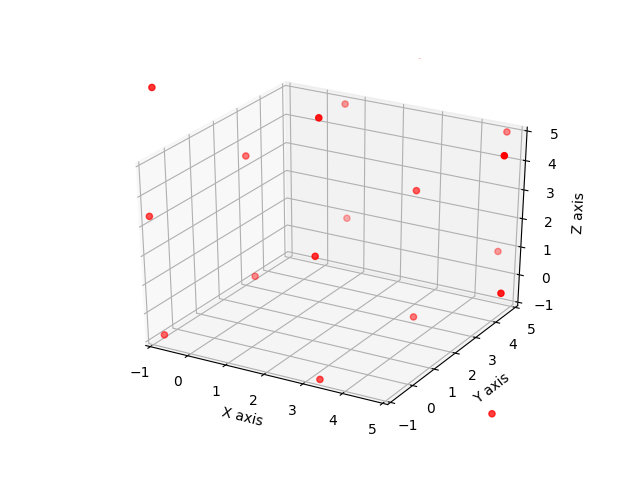

shape = 3
[-0.8135259098405686, -0.8135259098405689, -0.8135259098405688]
[-0.9548718290818797, -0.9548718290818797, 3.3333333333333335]
[-0.8135259098405688, -0.8135259098405688, 7.480192576507234]
[-0.9548718290818797, 3.3333333333333335, -0.9548718290818797]
[-1.1308693573994282, 3.3333333333333335, 3.3333333333333335]
[-0.9548718290818797, 3.3333333333333335, 7.621538495748548]
[-0.8135259098405688, 7.480192576507234, -0.8135259098405688]
[-0.9548718290818796, 7.621538495748548, 3.3333333333333335]
[-0.8135259098405688, 7.480192576507235, 7.480192576507235]
[3.3333333333333335, -0.9548718290818797, -0.9548718290818797]
[3.3333333333333335, -1.1308693573994282, 3.3333333333333335]
[3.3333333333333335, -0.9548718290818797, 7.621538495748548]
[3.3333333333333335, 3.3333333333333335, -1.1308693573994282]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.797536024066097]
[3.3333333333333335, 7.621538495748548, -0.9548718290818797]
[3

<IPython.core.display.Javascript object>

shape = 3
[-0.8734345281365831, -0.8734345281365834, -0.8734345281365834]
[-1.0250059830992366, -1.0250059830992366, 3.3333333333333335]
[-0.8734345281365834, -0.8734345281365834, 7.540101194803248]
[-1.0250059830992366, 3.3333333333333335, -1.0250059830992366]
[-1.214008155436459, 3.3333333333333335, 3.3333333333333335]
[-1.0250059830992366, 3.3333333333333335, 7.691672649765905]
[-0.8734345281365834, 7.540101194803248, -0.8734345281365834]
[-1.0250059830992364, 7.691672649765905, 3.3333333333333335]
[-0.8734345281365834, 7.540101194803249, 7.540101194803249]
[3.3333333333333335, -1.0250059830992366, -1.0250059830992366]
[3.3333333333333335, -1.214008155436459, 3.3333333333333335]
[3.3333333333333335, -1.0250059830992366, 7.691672649765905]
[3.3333333333333335, 3.3333333333333335, -1.214008155436459]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.880674822103128]
[3.3333333333333335, 7.691672649765905, -1.0250059830992366]
[3.33

<IPython.core.display.Javascript object>


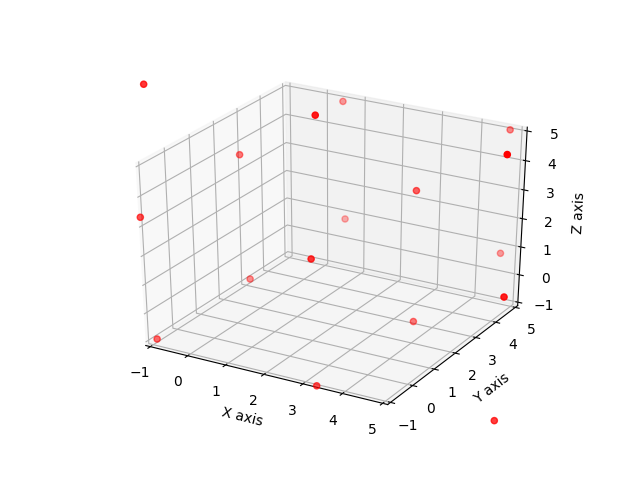

shape = 3
[-0.9349764436078825, -0.9349764436078828, -0.9349764436078828]
[-1.0970329917986754, -1.0970329917986754, 3.3333333333333335]
[-0.9349764436078828, -0.9349764436078828, 7.601643110274548]
[-1.0970329917986754, 3.3333333333333335, -1.0970329917986754]
[-1.2994022964394285, 3.3333333333333335, 3.3333333333333335]
[-1.0970329917986754, 3.3333333333333335, 7.7636996584653435]
[-0.9349764436078828, 7.601643110274548, -0.9349764436078828]
[-1.0970329917986752, 7.7636996584653435, 3.3333333333333335]
[-0.9349764436078828, 7.601643110274549, 7.601643110274549]
[3.3333333333333335, -1.0970329917986754, -1.0970329917986754]
[3.3333333333333335, -1.2994022964394285, 3.3333333333333335]
[3.3333333333333335, -1.0970329917986754, 7.7636996584653435]
[3.3333333333333335, 3.3333333333333335, -1.2994022964394285]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.966068963106097]
[3.3333333333333335, 7.7636996584653435, -1.0970329917986754

<IPython.core.display.Javascript object>

shape = 3
[-0.9981006855160555, -0.9981006855160558, -0.9981006855160558]
[-1.1708927315699886, -1.1708927315699886, 3.3333333333333335]
[-0.9981006855160558, -0.9981006855160558, 7.664767352182721]
[-1.1708927315699886, 3.3333333333333335, -1.1708927315699886]
[-1.3869813661899684, 3.3333333333333335, 3.3333333333333335]
[-1.1708927315699886, 3.3333333333333335, 7.837559398236657]
[-0.9981006855160558, 7.664767352182721, -0.9981006855160558]
[-1.1708927315699884, 7.837559398236657, 3.3333333333333335]
[-0.9981006855160558, 7.6647673521827215, 7.6647673521827215]
[3.3333333333333335, -1.1708927315699886, -1.1708927315699886]
[3.3333333333333335, -1.3869813661899684, 3.3333333333333335]
[3.3333333333333335, -1.1708927315699886, 7.837559398236657]
[3.3333333333333335, 3.3333333333333335, -1.3869813661899684]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.053648032856637]
[3.3333333333333335, 7.837559398236657, -1.1708927315699886]


<IPython.core.display.Javascript object>


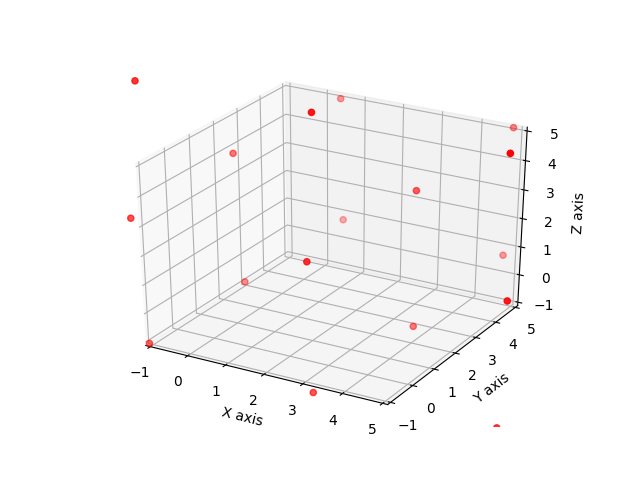

shape = 3
[-1.0627573895700926, -1.0627573895700928, -1.0627573895700928]
[-1.2465264838482428, -1.2465264838482428, 3.3333333333333335]
[-1.0627573895700928, -1.0627573895700928, 7.729424056236757]
[-1.2465264838482428, 3.3333333333333335, -1.2465264838482428]
[-1.4766765759047396, 3.3333333333333335, 3.3333333333333335]
[-1.2465264838482428, 3.3333333333333335, 7.913193150514911]
[-1.0627573895700928, 7.729424056236757, -1.0627573895700928]
[-1.2465264838482426, 7.913193150514911, 3.3333333333333335]
[-1.0627573895700928, 7.729424056236758, 7.729424056236758]
[3.3333333333333335, -1.2465264838482428, -1.2465264838482428]
[3.3333333333333335, -1.4766765759047396, 3.3333333333333335]
[3.3333333333333335, -1.2465264838482428, 7.913193150514911]
[3.3333333333333335, 3.3333333333333335, -1.4766765759047396]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.143343242571408]
[3.3333333333333335, 7.913193150514911, -1.2465264838482428]
[3

<IPython.core.display.Javascript object>


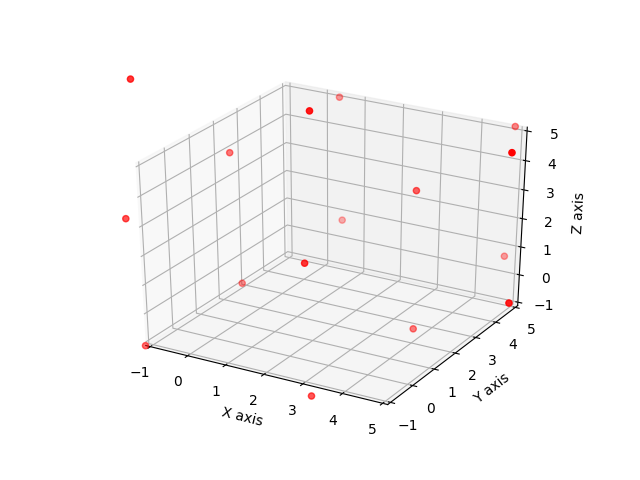

shape = 3
[-1.128897863917287, -1.1288978639172873, -1.1288978639172873]
[-1.3238770041400705, -1.3238770041400705, 3.3333333333333335]
[-1.1288978639172873, -1.1288978639172873, 7.795564530583952]
[-1.3238770041400705, 3.3333333333333335, -1.3238770041400705]
[-1.5684208413321334, 3.3333333333333335, 3.3333333333333335]
[-1.3238770041400705, 3.3333333333333335, 7.990543670806739]
[-1.1288978639172873, 7.795564530583952, -1.1288978639172873]
[-1.3238770041400703, 7.990543670806739, 3.3333333333333335]
[-1.1288978639172873, 7.7955645305839525, 7.7955645305839525]
[3.3333333333333335, -1.3238770041400705, -1.3238770041400705]
[3.3333333333333335, -1.5684208413321334, 3.3333333333333335]
[3.3333333333333335, -1.3238770041400705, 7.990543670806739]
[3.3333333333333335, 3.3333333333333335, -1.5684208413321334]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.235087507998802]
[3.3333333333333335, 7.990543670806739, -1.3238770041400705]
[

<IPython.core.display.Javascript object>


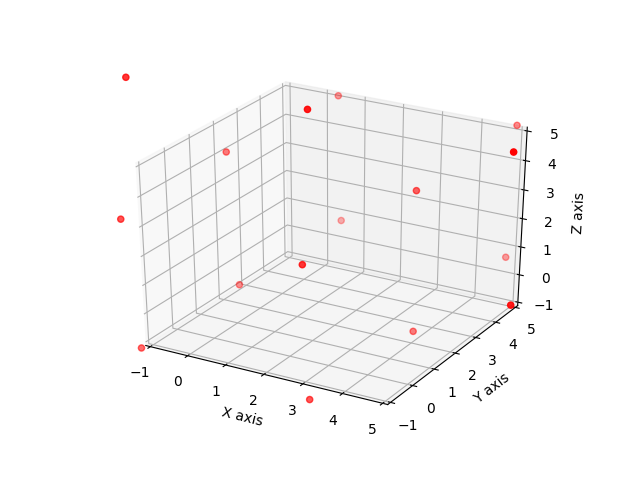

shape = 3
[-1.1964746412572784, -1.1964746412572786, -1.1964746412572786]
[-1.4028885746418487, -1.4028885746418487, 3.3333333333333335]
[-1.1964746412572786, -1.1964746412572786, 7.863141307923943]
[-1.4028885746418487, 3.3333333333333335, -1.4028885746418487]
[-1.6621488430566287, 3.3333333333333335, 3.3333333333333335]
[-1.4028885746418487, 3.3333333333333335, 8.069555241308517]
[-1.1964746412572786, 7.863141307923943, -1.1964746412572786]
[-1.4028885746418485, 8.069555241308517, 3.3333333333333335]
[-1.1964746412572786, 7.863141307923944, 7.863141307923944]
[3.3333333333333335, -1.4028885746418487, -1.4028885746418487]
[3.3333333333333335, -1.6621488430566287, 3.3333333333333335]
[3.3333333333333335, -1.4028885746418487, 8.069555241308517]
[3.3333333333333335, 3.3333333333333335, -1.6621488430566287]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.328815509723297]
[3.3333333333333335, 8.069555241308517, -1.4028885746418487]
[3

<IPython.core.display.Javascript object>


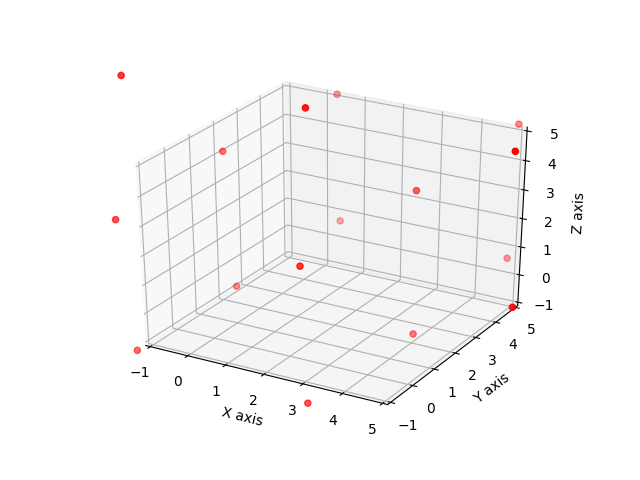

shape = 3
[-1.2654415183769088, -1.265441518376909, -1.265441518376909]
[-1.4835070421369883, -1.4835070421369883, 3.3333333333333335]
[-1.265441518376909, -1.265441518376909, 7.932108185043574]
[-1.4835070421369883, 3.3333333333333335, -1.4835070421369883]
[-1.757797069968258, 3.3333333333333335, 3.3333333333333335]
[-1.4835070421369883, 3.3333333333333335, 8.150173708803656]
[-1.265441518376909, 7.932108185043574, -1.265441518376909]
[-1.483507042136988, 8.150173708803656, 3.3333333333333335]
[-1.265441518376909, 7.932108185043575, 7.932108185043575]
[3.3333333333333335, -1.4835070421369883, -1.4835070421369883]
[3.3333333333333335, -1.757797069968258, 3.3333333333333335]
[3.3333333333333335, -1.4835070421369883, 8.150173708803656]
[3.3333333333333335, 3.3333333333333335, -1.757797069968258]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.424463736634927]
[3.3333333333333335, 8.150173708803656, -1.4835070421369883]
[3.3333333333

<IPython.core.display.Javascript object>

shape = 3
[-1.3357535843765465, -1.3357535843765467, -1.3357535843765467]
[-1.5656798427969532, -1.5656798427969532, 3.3333333333333335]
[-1.3357535843765467, -1.3357535843765467, 8.002420251043212]
[-1.5656798427969532, 3.3333333333333335, -1.5656798427969532]
[-1.8553038477732733, 3.3333333333333335, 3.3333333333333335]
[-1.5656798427969532, 3.3333333333333335, 8.232346509463621]
[-1.3357535843765467, 8.002420251043212, -1.3357535843765467]
[-1.565679842796953, 8.232346509463621, 3.3333333333333335]
[-1.3357535843765467, 8.002420251043212, 8.002420251043212]
[3.3333333333333335, -1.5656798427969532, -1.5656798427969532]
[3.3333333333333335, -1.8553038477732733, 3.3333333333333335]
[3.3333333333333335, -1.5656798427969532, 8.232346509463621]
[3.3333333333333335, 3.3333333333333335, -1.8553038477732733]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.521970514439943]
[3.3333333333333335, 8.232346509463621, -1.5656798427969532]
[3.

<IPython.core.display.Javascript object>

shape = 3
[-1.4073672388131362, -1.4073672388131364, -1.4073672388131364]
[-1.6493560154291431, -1.6493560154291431, 3.3333333333333335]
[-1.4073672388131364, -1.4073672388131364, 8.074033905479801]
[-1.6493560154291431, 3.3333333333333335, -1.6493560154291431]
[-1.9546093543209984, 3.3333333333333335, 3.3333333333333335]
[-1.6493560154291431, 3.3333333333333335, 8.316022682095811]
[-1.4073672388131364, 8.074033905479801, -1.4073672388131364]
[-1.649356015429143, 8.316022682095811, 3.3333333333333335]
[-1.4073672388131364, 8.074033905479801, 8.074033905479801]
[3.3333333333333335, -1.6493560154291431, -1.6493560154291431]
[3.3333333333333335, -1.9546093543209984, 3.3333333333333335]
[3.3333333333333335, -1.6493560154291431, 8.316022682095811]
[3.3333333333333335, 3.3333333333333335, -1.9546093543209984]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.621276020987668]
[3.3333333333333335, 8.316022682095811, -1.6493560154291431]
[3.

<IPython.core.display.Javascript object>

shape = 3
[-1.4802402009261384, -1.4802402009261386, -1.4802402009261386]
[-1.7344862046201859, -1.7344862046201859, 3.3333333333333335]
[-1.4802402009261386, -1.4802402009261386, 8.146906867592804]
[-1.7344862046201859, 3.3333333333333335, -1.7344862046201859]
[-2.055655623407518, 3.3333333333333335, 3.3333333333333335]
[-1.7344862046201859, 3.3333333333333335, 8.401152871286854]
[-1.4802402009261386, 8.146906867592804, -1.4802402009261386]
[-1.7344862046201857, 8.401152871286854, 3.3333333333333335]
[-1.4802402009261386, 8.146906867592804, 8.146906867592804]
[3.3333333333333335, -1.7344862046201859, -1.7344862046201859]
[3.3333333333333335, -2.055655623407518, 3.3333333333333335]
[3.3333333333333335, -1.7344862046201859, 8.401152871286854]
[3.3333333333333335, 3.3333333333333335, -2.055655623407518]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.722322290074187]
[3.3333333333333335, 8.401152871286854, -1.7344862046201859]
[3.33

<IPython.core.display.Javascript object>


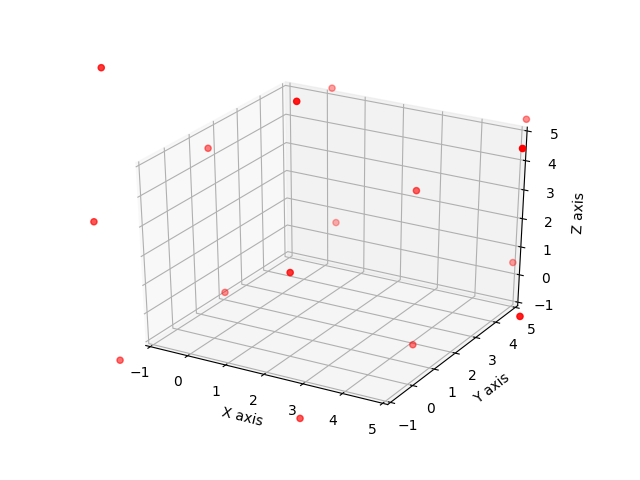

shape = 3
[-1.5543315110437168, -1.554331511043717, -1.554331511043717]
[-1.8210226551203699, -1.8210226551203699, 3.3333333333333335]
[-1.554331511043717, -1.554331511043717, 8.220998177710383]
[-1.8210226551203699, 3.3333333333333335, -1.8210226551203699]
[-2.1583865385946477, 3.3333333333333335, 3.3333333333333335]
[-1.8210226551203699, 3.3333333333333335, 8.487689321787037]
[-1.554331511043717, 8.220998177710383, -1.554331511043717]
[-1.8210226551203696, 8.487689321787037, 3.3333333333333335]
[-1.554331511043717, 8.220998177710383, 8.220998177710383]
[3.3333333333333335, -1.8210226551203699, -1.8210226551203699]
[3.3333333333333335, -2.1583865385946477, 3.3333333333333335]
[3.3333333333333335, -1.8210226551203699, 8.487689321787037]
[3.3333333333333335, 3.3333333333333335, -2.1583865385946477]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.825053205261316]
[3.3333333333333335, 8.487689321787037, -1.8210226551203699]
[3.333333

<IPython.core.display.Javascript object>

shape = 3
[-1.6296015251914955, -1.6296015251914957, -1.6296015251914957]
[-1.9089191987079275, -1.9089191987079275, 3.3333333333333335]
[-1.6296015251914957, -1.6296015251914957, 8.296268191858163]
[-1.9089191987079275, 3.3333333333333335, -1.9089191987079275]
[-2.262747818456945, 3.3333333333333335, 3.3333333333333335]
[-1.9089191987079275, 3.3333333333333335, 8.575585865374595]
[-1.6296015251914957, 8.296268191858163, -1.6296015251914957]
[-1.9089191987079273, 8.575585865374595, 3.3333333333333335]
[-1.6296015251914957, 8.296268191858163, 8.296268191858163]
[3.3333333333333335, -1.9089191987079275, -1.9089191987079275]
[3.3333333333333335, -2.262747818456945, 3.3333333333333335]
[3.3333333333333335, -1.9089191987079275, 8.575585865374595]
[3.3333333333333335, 3.3333333333333335, -2.262747818456945]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.929414485123614]
[3.3333333333333335, 8.575585865374595, -1.9089191987079275]
[3.33

<IPython.core.display.Javascript object>


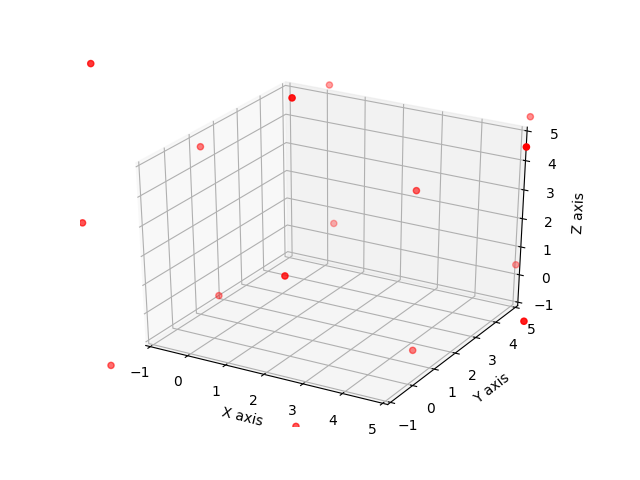

shape = 3
[-1.7060119038477548, -1.706011903847755, -1.706011903847755]
[-1.9981312346638505, -1.9981312346638505, 3.3333333333333335]
[-1.706011903847755, -1.706011903847755, 8.372678570514422]
[-1.9981312346638505, 3.3333333333333335, -1.9981312346638505]
[-2.368686994543799, 3.3333333333333335, 3.3333333333333335]
[-1.9981312346638505, 3.3333333333333335, 8.664797901330518]
[-1.706011903847755, 8.372678570514422, -1.706011903847755]
[-1.9981312346638502, 8.664797901330518, 3.3333333333333335]
[-1.706011903847755, 8.372678570514422, 8.372678570514422]
[3.3333333333333335, -1.9981312346638505, -1.9981312346638505]
[3.3333333333333335, -2.368686994543799, 3.3333333333333335]
[3.3333333333333335, -1.9981312346638505, 8.664797901330518]
[3.3333333333333335, 3.3333333333333335, -2.368686994543799]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.035353661210468]
[3.3333333333333335, 8.664797901330518, -1.9981312346638505]
[3.333333333

<IPython.core.display.Javascript object>


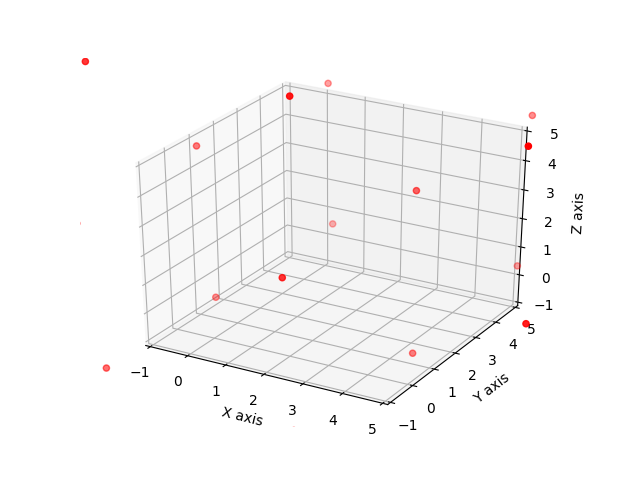

shape = 3
[-1.7835255957094145, -1.7835255957094147, -1.7835255957094147]
[-2.0886157048814193, -2.0886157048814193, 3.3333333333333335]
[-1.7835255957094147, -1.7835255957094147, 8.450192262376081]
[-2.0886157048814193, 3.3333333333333335, -2.0886157048814193]
[-2.4761533832205784, 3.3333333333333335, 3.3333333333333335]
[-2.0886157048814193, 3.3333333333333335, 8.755282371548088]
[-1.7835255957094147, 8.450192262376081, -1.7835255957094147]
[-2.0886157048814193, 8.755282371548088, 3.3333333333333335]
[-1.7835255957094147, 8.450192262376081, 8.450192262376081]
[3.3333333333333335, -2.0886157048814193, -2.0886157048814193]
[3.3333333333333335, -2.4761533832205784, 3.3333333333333335]
[3.3333333333333335, -2.0886157048814193, 8.755282371548088]
[3.3333333333333335, 3.3333333333333335, -2.4761533832205784]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.142820049887249]
[3.3333333333333335, 8.755282371548088, -2.0886157048814193]
[3

<IPython.core.display.Javascript object>

shape = 3
[-1.8621068172543935, -1.8621068172543938, -1.8621068172543938]
[-2.180331064531541, -2.180331064531541, 3.3333333333333335]
[-1.8621068172543938, -1.8621068172543938, 8.52877348392106]
[-2.180331064531541, 3.3333333333333335, -2.180331064531541]
[-2.5850980524343643, 3.3333333333333335, 3.3333333333333335]
[-2.180331064531541, 3.3333333333333335, 8.84699773119821]
[-1.8621068172543938, 8.52877348392106, -1.8621068172543938]
[-2.180331064531541, 8.84699773119821, 3.3333333333333335]
[-1.8621068172543938, 8.52877348392106, 8.52877348392106]
[3.3333333333333335, -2.180331064531541, -2.180331064531541]
[3.3333333333333335, -2.5850980524343643, 3.3333333333333335]
[3.3333333333333335, -2.180331064531541, 8.84699773119821]
[3.3333333333333335, 3.3333333333333335, -2.5850980524343643]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.251764719101034]
[3.3333333333333335, 8.84699773119821, -2.180331064531541]
[3.3333333333333335,

<IPython.core.display.Javascript object>


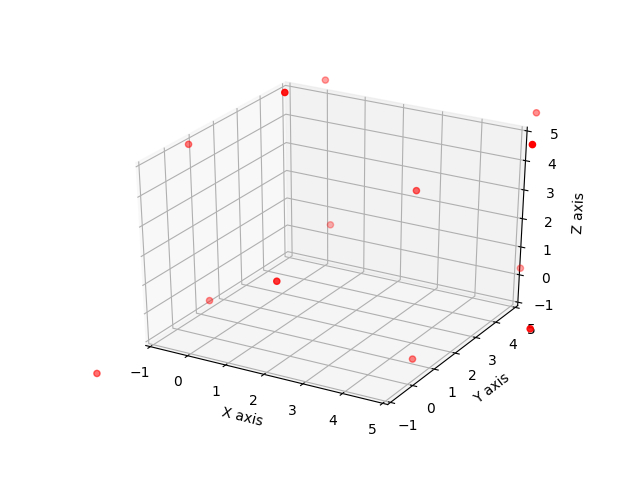

shape = 3
[-1.9417210288093494, -1.9417210288093496, -1.9417210288093496]
[-2.273237249106705, -2.273237249106705, 3.3333333333333335]
[-1.9417210288093496, -1.9417210288093496, 8.608387695476017]
[-2.273237249106705, 3.3333333333333335, -2.273237249106705]
[-2.69547378433739, 3.3333333333333335, 3.3333333333333335]
[-2.273237249106705, 3.3333333333333335, 8.939903915773373]
[-1.9417210288093496, 8.608387695476017, -1.9417210288093496]
[-2.273237249106705, 8.939903915773373, 3.3333333333333335]
[-1.9417210288093496, 8.608387695476017, 8.608387695476017]
[3.3333333333333335, -2.273237249106705, -2.273237249106705]
[3.3333333333333335, -2.69547378433739, 3.3333333333333335]
[3.3333333333333335, -2.273237249106705, 8.939903915773373]
[3.3333333333333335, 3.3333333333333335, -2.69547378433739]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.36214045100406]
[3.3333333333333335, 8.939903915773373, -2.273237249106705]
[3.3333333333333335

<IPython.core.display.Javascript object>

shape = 3
[-2.022334907758444, -2.0223349077584443, -2.0223349077584443]
[-2.367295638573836, -2.367295638573836, 3.3333333333333335]
[-2.0223349077584443, -2.0223349077584443, 8.689001574425111]
[-2.367295638573836, 3.3333333333333335, -2.367295638573836]
[-2.80723503459586, 3.3333333333333335, 3.3333333333333335]
[-2.367295638573836, 3.3333333333333335, 9.033962305240504]
[-2.0223349077584443, 8.689001574425111, -2.0223349077584443]
[-2.367295638573836, 9.033962305240504, 3.3333333333333335]
[-2.0223349077584443, 8.689001574425111, 8.689001574425111]
[3.3333333333333335, -2.367295638573836, -2.367295638573836]
[3.3333333333333335, -2.80723503459586, 3.3333333333333335]
[3.3333333333333335, -2.367295638573836, 9.033962305240504]
[3.3333333333333335, 3.3333333333333335, -2.80723503459586]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.473901701262529]
[3.3333333333333335, 9.033962305240504, -2.367295638573836]
[3.3333333333333335

<IPython.core.display.Javascript object>

shape = 3
[-2.1039163194593953, -2.1039163194593957, -2.1039163194593957]
[-2.4624690192801144, -2.4624690192801144, 3.3333333333333335]
[-2.1039163194593957, -2.1039163194593957, 8.770582986126062]
[-2.4624690192801144, 3.3333333333333335, -2.4624690192801144]
[-2.920337889113908, 3.3333333333333335, 3.3333333333333335]
[-2.4624690192801144, 3.3333333333333335, 9.129135685946782]
[-2.1039163194593957, 8.770582986126062, -2.1039163194593957]
[-2.4624690192801144, 9.129135685946782, 3.3333333333333335]
[-2.1039163194593957, 8.770582986126062, 8.770582986126062]
[3.3333333333333335, -2.4624690192801144, -2.4624690192801144]
[3.3333333333333335, -2.920337889113908, 3.3333333333333335]
[3.3333333333333335, -2.4624690192801144, 9.129135685946782]
[3.3333333333333335, 3.3333333333333335, -2.920337889113908]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.587004555780577]
[3.3333333333333335, 9.129135685946782, -2.4624690192801144]
[3.33

<IPython.core.display.Javascript object>

shape = 3
[-2.186434286368138, -2.1864342863681383, -2.1864342863681383]
[-2.5587215441762887, -2.5587215441762887, 3.3333333333333335]
[-2.1864342863681383, -2.1864342863681383, 8.853100953034804]
[-2.5587215441762887, 3.3333333333333335, -2.5587215441762887]
[-3.0347400188122933, 3.3333333333333335, 3.3333333333333335]
[-2.5587215441762887, 3.3333333333333335, 9.225388210842956]
[-2.1864342863681383, 8.853100953034804, -2.1864342863681383]
[-2.5587215441762887, 9.225388210842956, 3.3333333333333335]
[-2.1864342863681383, 8.853100953034804, 8.853100953034804]
[3.3333333333333335, -2.5587215441762887, -2.5587215441762887]
[3.3333333333333335, -3.0347400188122933, 3.3333333333333335]
[3.3333333333333335, -2.5587215441762887, 9.225388210842956]
[3.3333333333333335, 3.3333333333333335, -3.0347400188122933]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.701406685478963]
[3.3333333333333335, 9.225388210842956, -2.5587215441762887]
[3.

<IPython.core.display.Javascript object>


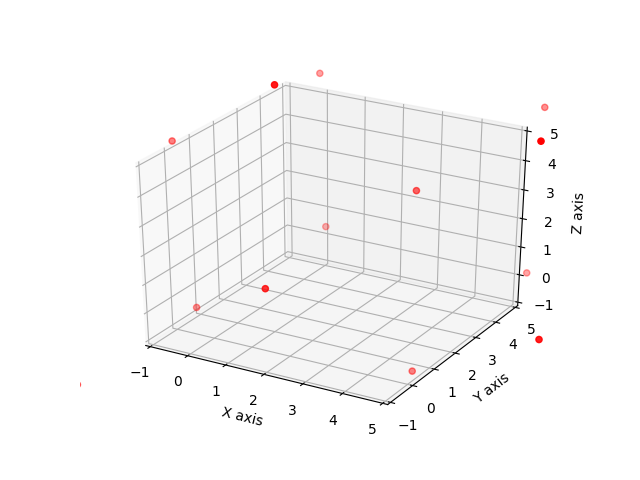

shape = 3
[-2.269858955813203, -2.2698589558132034, -2.2698589558132034]
[-2.656018691849172, -2.656018691849172, 3.3333333333333335]
[-2.2698589558132034, -2.2698589558132034, 8.93652562247987]
[-2.656018691849172, 3.3333333333333335, -2.656018691849172]
[-3.1504006330190726, 3.3333333333333335, 3.3333333333333335]
[-2.656018691849172, 3.3333333333333335, 9.32268535851584]
[-2.2698589558132034, 8.93652562247987, -2.2698589558132034]
[-2.656018691849172, 9.32268535851584, 3.3333333333333335]
[-2.2698589558132034, 8.93652562247987, 8.93652562247987]
[3.3333333333333335, -2.656018691849172, -2.656018691849172]
[3.3333333333333335, -3.1504006330190726, 3.3333333333333335]
[3.3333333333333335, -2.656018691849172, 9.32268535851584]
[3.3333333333333335, 3.3333333333333335, -3.1504006330190726]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.817067299685743]
[3.3333333333333335, 9.32268535851584, -2.656018691849172]
[3.3333333333333335, 

<IPython.core.display.Javascript object>

shape = 3
[-2.3541615668055647, -2.354161566805565, -2.354161566805565]
[-2.7543272247888297, -2.7543272247888297, 3.3333333333333335]
[-2.354161566805565, -2.354161566805565, 9.020828233472232]
[-2.7543272247888297, 3.3333333333333335, -2.7543272247888297]
[-3.267280431954741, 3.3333333333333335, 3.3333333333333335]
[-2.7543272247888297, 3.3333333333333335, 9.420993891455497]
[-2.354161566805565, 9.020828233472232, -2.354161566805565]
[-2.7543272247888297, 9.420993891455497, 3.3333333333333335]
[-2.354161566805565, 9.020828233472232, 9.020828233472232]
[3.3333333333333335, -2.7543272247888297, -2.7543272247888297]
[3.3333333333333335, -3.267280431954741, 3.3333333333333335]
[3.3333333333333335, -2.7543272247888297, 9.420993891455497]
[3.3333333333333335, 3.3333333333333335, -3.267280431954741]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.933947098621411]
[3.3333333333333335, 9.420993891455497, -2.7543272247888297]
[3.333333333

<IPython.core.display.Javascript object>

shape = 3
[-2.439314416219148, -2.4393144162191485, -2.4393144162191485]
[-2.8536151472561992, -2.8536151472561992, 3.3333333333333335]
[-2.4393144162191485, -2.4393144162191485, 9.105981082885815]
[-2.8536151472561992, 3.3333333333333335, -2.8536151472561992]
[-3.3853415587269304, 3.3333333333333335, 3.3333333333333335]
[-2.8536151472561992, 3.3333333333333335, 9.520281813922868]
[-2.4393144162191485, 9.105981082885815, -2.4393144162191485]
[-2.8536151472561992, 9.520281813922868, 3.3333333333333335]
[-2.4393144162191485, 9.105981082885815, 9.105981082885815]
[3.3333333333333335, -2.8536151472561992, -2.8536151472561992]
[3.3333333333333335, -3.3853415587269304, 3.3333333333333335]
[3.3333333333333335, -2.8536151472561992, 9.520281813922868]
[3.3333333333333335, 3.3333333333333335, -3.3853415587269304]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.052008225393601]
[3.3333333333333335, 9.520281813922868, -2.8536151472561992]
[3

<IPython.core.display.Javascript object>


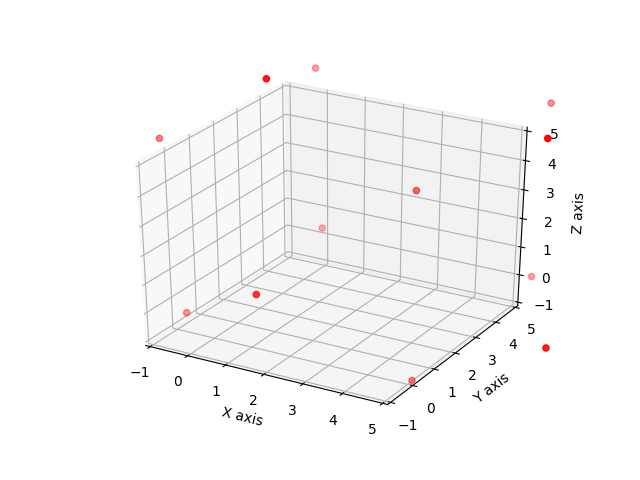

shape = 3
[-2.525290824631343, -2.5252908246313437, -2.5252908246313437]
[-2.953851663063257, -2.953851663063257, 3.3333333333333335]
[-2.5252908246313437, -2.5252908246313437, 9.19195749129801]
[-2.953851663063257, 3.3333333333333335, -2.953851663063257]
[-3.504547551189304, 3.3333333333333335, 3.3333333333333335]
[-2.953851663063257, 3.3333333333333335, 9.620518329729926]
[-2.5252908246313437, 9.19195749129801, -2.5252908246313437]
[-2.953851663063257, 9.620518329729926, 3.3333333333333335]
[-2.5252908246313437, 9.19195749129801, 9.19195749129801]
[3.3333333333333335, -2.953851663063257, -2.953851663063257]
[3.3333333333333335, -3.504547551189304, 3.3333333333333335]
[3.3333333333333335, -2.953851663063257, 9.620518329729926]
[3.3333333333333335, 3.3333333333333335, -3.504547551189304]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.171214217855974]
[3.3333333333333335, 9.620518329729926, -2.953851663063257]
[3.3333333333333335

<IPython.core.display.Javascript object>


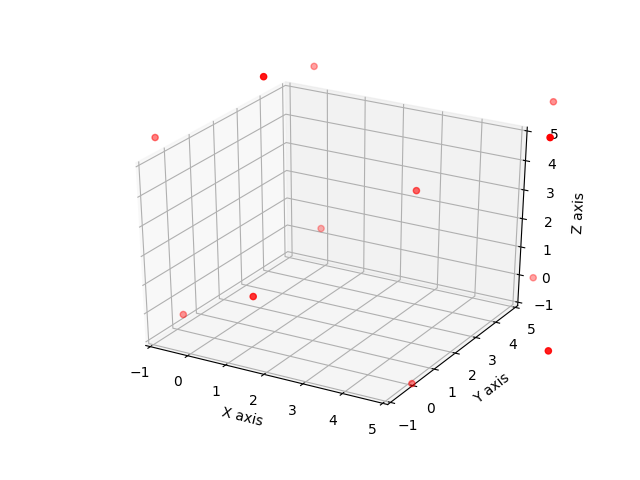

shape = 3
[-2.6120651020715444, -2.6120651020715453, -2.6120651020715453]
[-3.0550071335299616, -3.0550071335299616, 3.3333333333333335]
[-2.6120651020715453, -2.6120651020715453, 9.278731768738211]
[-3.0550071335299616, 3.3333333333333335, -3.0550071335299616]
[-3.6248632939653462, 3.3333333333333335, 3.3333333333333335]
[-3.0550071335299616, 3.3333333333333335, 9.72167380019663]
[-2.6120651020715453, 9.278731768738211, -2.6120651020715453]
[-3.0550071335299616, 9.72167380019663, 3.3333333333333335]
[-2.6120651020715453, 9.278731768738211, 9.278731768738211]
[3.3333333333333335, -3.0550071335299616, -3.0550071335299616]
[3.3333333333333335, -3.6248632939653462, 3.3333333333333335]
[3.3333333333333335, -3.0550071335299616, 9.72167380019663]
[3.3333333333333335, 3.3333333333333335, -3.6248632939653462]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.291529960632017]
[3.3333333333333335, 9.72167380019663, -3.0550071335299616]
[3.33

<IPython.core.display.Javascript object>


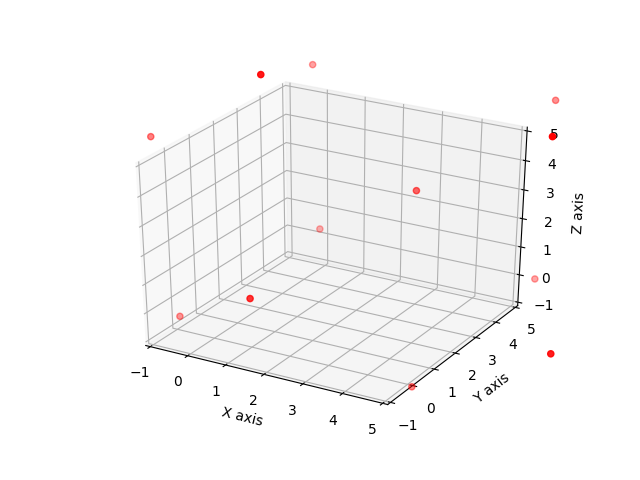

shape = 3
[-2.699612513888676, -2.699612513888677, -2.699612513888677]
[-3.1570530358397066, -3.1570530358397066, 3.3333333333333335]
[-2.699612513888677, -2.699612513888677, 9.366279180555344]
[-3.1570530358397066, 3.3333333333333335, -3.1570530358397066]
[-3.746254970889889, 3.3333333333333335, 3.3333333333333335]
[-3.1570530358397066, 3.3333333333333335, 9.823719702506375]
[-2.699612513888677, 9.366279180555344, -2.699612513888677]
[-3.1570530358397066, 9.823719702506375, 3.3333333333333335]
[-2.699612513888677, 9.366279180555344, 9.366279180555344]
[3.3333333333333335, -3.1570530358397066, -3.1570530358397066]
[3.3333333333333335, -3.746254970889889, 3.3333333333333335]
[3.3333333333333335, -3.1570530358397066, 9.823719702506375]
[3.3333333333333335, 3.3333333333333335, -3.746254970889889]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.41292163755656]
[3.3333333333333335, 9.823719702506375, -3.1570530358397066]
[3.3333333333

<IPython.core.display.Javascript object>


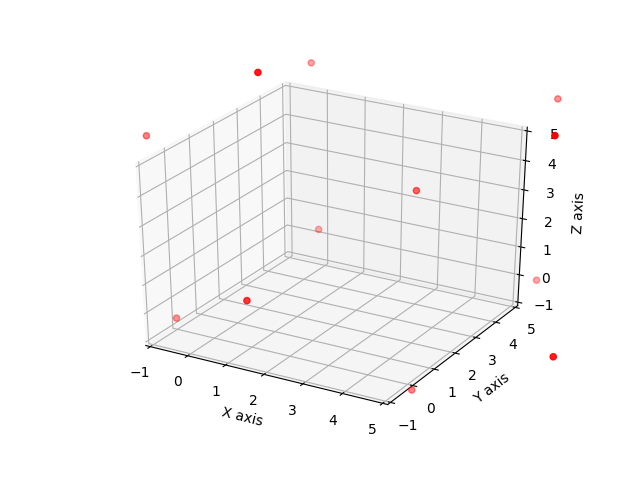

shape = 3
[-2.7879092469156155, -2.7879092469156164, -2.7879092469156164]
[-3.259961921977447, -3.259961921977447, 3.3333333333333335]
[-2.7879092469156164, -2.7879092469156164, 9.454575913582284]
[-3.259961921977447, 3.3333333333333335, -3.259961921977447]
[-3.8686900180788912, 3.3333333333333335, 3.3333333333333335]
[-3.259961921977447, 3.3333333333333335, 9.926628588644116]
[-2.7879092469156164, 9.454575913582284, -2.7879092469156164]
[-3.259961921977447, 9.926628588644116, 3.3333333333333335]
[-2.7879092469156164, 9.454575913582284, 9.454575913582284]
[3.3333333333333335, -3.259961921977447, -3.259961921977447]
[3.3333333333333335, -3.8686900180788912, 3.3333333333333335]
[3.3333333333333335, -3.259961921977447, 9.926628588644116]
[3.3333333333333335, 3.3333333333333335, -3.8686900180788912]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.535356684745562]
[3.3333333333333335, 9.926628588644116, -3.259961921977447]
[3.33333333

<IPython.core.display.Javascript object>


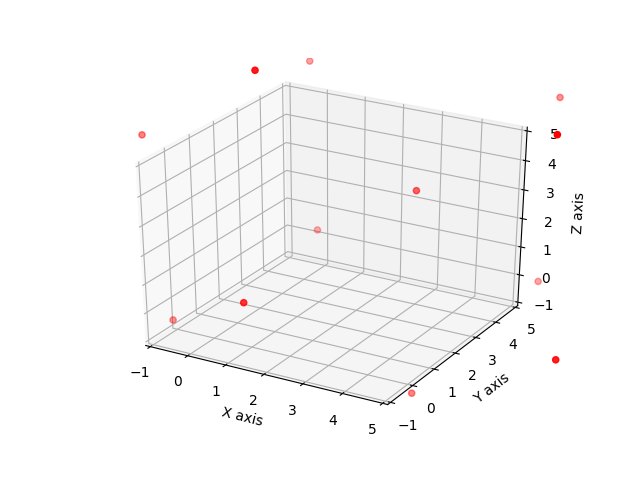

shape = 3
[-2.8769323760791052, -2.876932376079106, -2.876932376079106]
[-3.36370737840164, -3.36370737840164, 3.3333333333333335]
[-2.876932376079106, -2.876932376079106, 9.543599042745774]
[-3.36370737840164, 3.3333333333333335, -3.36370737840164]
[-3.9921370778007828, 3.3333333333333335, 3.3333333333333335]
[-3.36370737840164, 3.3333333333333335, 10.030374045068308]
[-2.876932376079106, 9.543599042745774, -2.876932376079106]
[-3.36370737840164, 10.030374045068308, 3.3333333333333335]
[-2.876932376079106, 9.543599042745774, 9.543599042745774]
[3.3333333333333335, -3.36370737840164, -3.36370737840164]
[3.3333333333333335, -3.9921370778007828, 3.3333333333333335]
[3.3333333333333335, -3.36370737840164, 10.030374045068308]
[3.3333333333333335, 3.3333333333333335, -3.9921370778007828]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.658803744467454]
[3.3333333333333335, 10.030374045068308, -3.36370737840164]
[3.3333333333333335, 10.

<IPython.core.display.Javascript object>

shape = 3
[-2.966659831577838, -2.966659831577839, -2.966659831577839]
[-3.468263986572232, -3.468263986572232, 3.3333333333333335]
[-2.966659831577839, -2.966659831577839, 9.633326498244507]
[-3.4682639865722313, 3.3333333333333335, -3.468263986572232]
[-4.116565953290085, 3.3333333333333335, 3.3333333333333335]
[-3.4682639865722313, 3.3333333333333335, 10.1349306532389]
[-2.966659831577839, 9.633326498244507, -2.966659831577839]
[-3.4682639865722313, 10.1349306532389, 3.3333333333333335]
[-2.966659831577839, 9.633326498244507, 9.633326498244507]
[3.3333333333333335, -3.468263986572232, -3.468263986572232]
[3.3333333333333335, -4.116565953290085, 3.3333333333333335]
[3.3333333333333335, -3.4682639865722313, 10.1349306532389]
[3.3333333333333335, 3.3333333333333335, -4.116565953290085]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.783232619956756]
[3.3333333333333335, 10.1349306532389, -3.468263986572232]
[3.3333333333333335, 1

<IPython.core.display.Javascript object>

shape = 3
[-3.057070366728625, -3.057070366728626, -3.057070366728626]
[-3.573607284431727, -3.573607284431727, 3.3333333333333335]
[-3.057070366728626, -3.057070366728626, 9.723737033395293]
[-3.5736072844317266, 3.3333333333333335, -3.573607284431727]
[-4.2419475646156, 3.3333333333333335, 3.3333333333333335]
[-3.5736072844317266, 3.3333333333333335, 10.240273951098395]
[-3.057070366728626, 9.723737033395293, -3.057070366728626]
[-3.5736072844317266, 10.240273951098395, 3.3333333333333335]
[-3.057070366728626, 9.723737033395293, 9.723737033395293]
[3.3333333333333335, -3.573607284431727, -3.573607284431727]
[3.3333333333333335, -4.2419475646156, 3.3333333333333335]
[3.3333333333333335, -3.5736072844317266, 10.240273951098395]
[3.3333333333333335, 3.3333333333333335, -4.2419475646156]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.908614231282272]
[3.3333333333333335, 10.240273951098395, -3.573607284431727]
[3.3333333333333335,

<IPython.core.display.Javascript object>


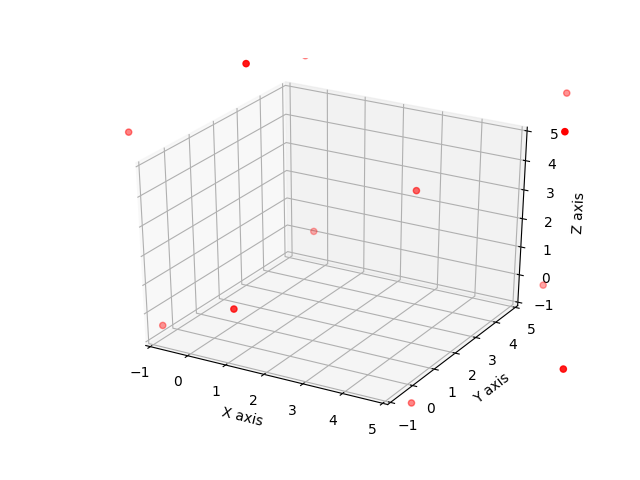

shape = 3
[-3.1481435265606335, -3.1481435265606343, -3.1481435265606343]
[-3.679713728914546, -3.679713728914546, 3.3333333333333335]
[-3.1481435265606343, -3.1481435265606343, 9.814810193227302]
[-3.679713728914545, 3.3333333333333335, -3.679713728914546]
[-4.368253905690786, 3.3333333333333335, 3.3333333333333335]
[-3.679713728914545, 3.3333333333333335, 10.346380395581214]
[-3.1481435265606343, 9.814810193227302, -3.1481435265606343]
[-3.679713728914545, 10.346380395581214, 3.3333333333333335]
[-3.1481435265606343, 9.814810193227302, 9.814810193227302]
[3.3333333333333335, -3.679713728914546, -3.679713728914546]
[3.3333333333333335, -4.368253905690786, 3.3333333333333335]
[3.3333333333333335, -3.679713728914545, 10.346380395581214]
[3.3333333333333335, 3.3333333333333335, -4.368253905690786]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.034920572357457]
[3.3333333333333335, 10.346380395581214, -3.679713728914546]
[3.3333333

<IPython.core.display.Javascript object>


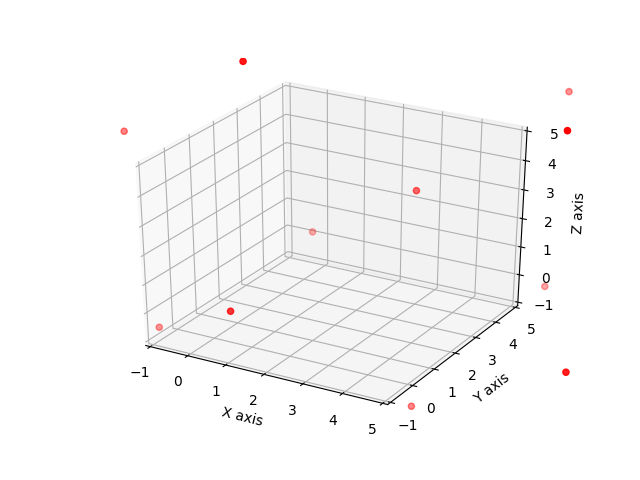

shape = 3
[-3.239859617220318, -3.239859617220319, -3.239859617220319]
[-3.7865606595410086, -3.7865606595410086, 3.3333333333333335]
[-3.239859617220319, -3.239859617220319, 9.906526283886986]
[-3.7865606595410077, 3.3333333333333335, -3.7865606595410086]
[-4.4954580024925965, 3.3333333333333335, 3.3333333333333335]
[-3.7865606595410077, 3.3333333333333335, 10.453227326207676]
[-3.239859617220319, 9.906526283886986, -3.239859617220319]
[-3.7865606595410077, 10.453227326207676, 3.3333333333333335]
[-3.239859617220319, 9.906526283886986, 9.906526283886986]
[3.3333333333333335, -3.7865606595410086, -3.7865606595410086]
[3.3333333333333335, -4.4954580024925965, 3.3333333333333335]
[3.3333333333333335, -3.7865606595410077, 10.453227326207676]
[3.3333333333333335, 3.3333333333333335, -4.4954580024925965]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.162124669159269]
[3.3333333333333335, 10.453227326207676, -3.7865606595410086]
[3.33

<IPython.core.display.Javascript object>

shape = 3
[-3.332199676234623, -3.332199676234624, -3.332199676234624]
[-3.894126263136108, -3.894126263136108, 3.3333333333333335]
[-3.332199676234624, -3.332199676234624, 9.998866342901291]
[-3.894126263136107, 3.3333333333333335, -3.894126263136108]
[-4.623533872536752, 3.3333333333333335, 3.3333333333333335]
[-3.894126263136107, 3.3333333333333335, 10.560792929802776]
[-3.332199676234624, 9.998866342901291, -3.332199676234624]
[-3.894126263136107, 10.560792929802776, 3.3333333333333335]
[-3.332199676234624, 9.998866342901291, 9.998866342901291]
[3.3333333333333335, -3.894126263136108, -3.894126263136108]
[3.3333333333333335, -4.623533872536752, 3.3333333333333335]
[3.3333333333333335, -3.894126263136107, 10.560792929802776]
[3.3333333333333335, 3.3333333333333335, -4.623533872536752]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.290200539203424]
[3.3333333333333335, 10.560792929802776, -3.894126263136108]
[3.333333333333333

<IPython.core.display.Javascript object>


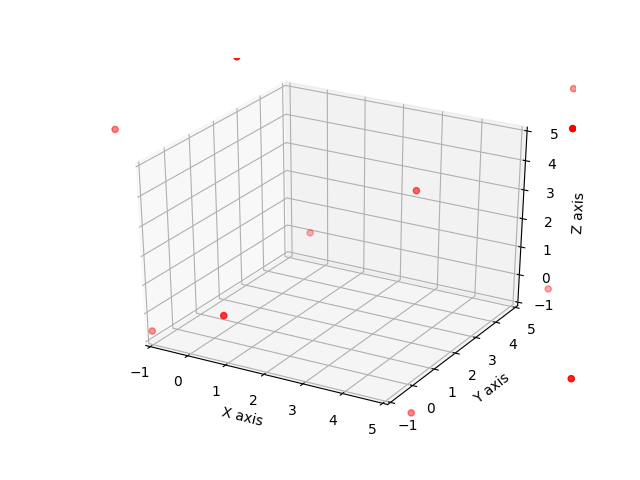

shape = 3
[-3.4251454436670423, -3.425145443667043, -3.425145443667043]
[-4.002389539699402, -4.002389539699402, 3.3333333333333335]
[-3.425145443667043, -3.425145443667043, 10.09181211033371]
[-4.002389539699401, 3.3333333333333335, -4.002389539699402]
[-4.752456485641665, 3.3333333333333335, 3.3333333333333335]
[-4.002389539699401, 3.3333333333333335, 10.66905620636607]
[-3.425145443667043, 10.09181211033371, -3.425145443667043]
[-4.002389539699401, 10.66905620636607, 3.3333333333333335]
[-3.425145443667043, 10.09181211033371, 10.09181211033371]
[3.3333333333333335, -4.002389539699402, -4.002389539699402]
[3.3333333333333335, -4.752456485641665, 3.3333333333333335]
[3.3333333333333335, -4.002389539699401, 10.66905620636607]
[3.3333333333333335, 3.3333333333333335, -4.752456485641665]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.419123152308337]
[3.3333333333333335, 10.66905620636607, -4.002389539699402]
[3.3333333333333335, 

<IPython.core.display.Javascript object>


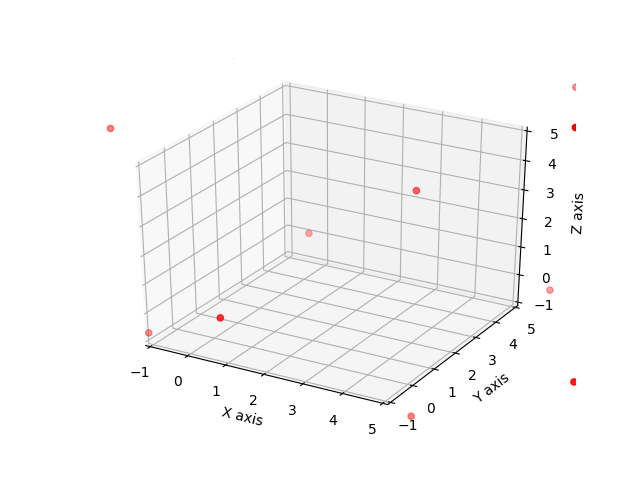

shape = 3
[-3.5186793341899856, -3.5186793341899865, -3.5186793341899865]
[-4.111330269440606, -4.111330269440606, 3.3333333333333335]
[-3.5186793341899865, -3.5186793341899865, 10.185346000856653]
[-4.1113302694406055, 3.3333333333333335, -4.111330269440606]
[-4.882201725999926, 3.3333333333333335, 3.3333333333333335]
[-4.1113302694406055, 3.3333333333333335, 10.777996936107275]
[-3.5186793341899865, 10.185346000856653, -3.5186793341899865]
[-4.1113302694406055, 10.777996936107275, 3.3333333333333335]
[-3.5186793341899865, 10.185346000856653, 10.185346000856653]
[3.3333333333333335, -4.111330269440606, -4.111330269440606]
[3.3333333333333335, -4.882201725999926, 3.3333333333333335]
[3.3333333333333335, -4.1113302694406055, 10.777996936107275]
[3.3333333333333335, 3.3333333333333335, -4.882201725999926]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.548868392666598]
[3.3333333333333335, 10.777996936107275, -4.111330269440606]
[3

In [19]:
#%time count = plasma_random_Charges(print_all = False)

#%lprun plasma_random_Charges(print_all=True)
#%lprun -f jefimenko.charge_current_integrals.field_calculator count = charged_Permittivity_ball()


%lprun -f jefimenko.plasma.plasma_simulation count = plasma_random_Charges(print_all = True)
#%lprun -f jefimenko.plasma.simulate_location_list count = plasma_random_Charges(print_all = True)

# %lprun -f jefimenko.plasma.field_calculator count = plasma_random_Charges(print_all = True)

#%lprun -f jefimenko.plasma.E_field_charges count = plasma_random_Charges(print_all = True)


#%lprun -f jefimenko.plasma.simulate_location count = plasma_random_Charges(print_all = True)
#%lprun -f jefimenko.plasma.location_process count = plasma_random_Charges(print_all = True)
#%lprun -f jefimenko.charge_current_integrals.field_calculator count = plasma_random_Charges(print_all = True)
#%lprun -f jefimenko.charge_current_integrals.Electric_field_charges count = plasma_random_Charges(print_all = True)
#%lprun -f jefimenko.charge_current_integrals.Magnetic_field_charges count = plasma_random_Charges(print_all = True)

In [20]:
def save_test(print_all=False):
    time_L = 6
    delta_t = .1
    mapping = jefimenko.Grid(delta=[1,1,1],  # this is the size of a step in x, y and z
                size=[5,5,5],  # this is the size of the grid in meters
                time=time_L,  # this is the length of a simulation in secounds
                delta_t=delta_t,  # this is the size of a full time step
                constant_E=[0,0,0],
                constant_H=[0,0,0]
        )
    A = 3
    for i in range(A):
        for j in range(A):
            for k in range(A):
                location = [10 / A * i, 10 / A * j, 10 / A * k]
                print(location)
                mapping.Add_Charge(location, Q = .00001, velocity=[0,0,0], acceleration=[0,0,0], mass=1)
    
    print('simulation starting')
    #jefimenko.simulate(mapping)
    
    jefimenko.plasma_simulation(mapping)
    
    jefimenko.extras.save_work(mapping, 'test_work')
#    jefimenko.plasma_simulation(mapping)
    #jefimenko.simulate(mapping)
    
    
    #for time in range(int(time_L / delta_t)):
    #    jefimenko.plot_grid(mapping, time)
        #jefimenko.plot_EM_grid('E', mapping, time)
        #jefimenko.plot_EM_grid('H', mapping, time)
    #    print('simulation time is ' + str(time))
    #    for i in range(len(mapping.charges[time])):
    #        print(mapping.charges[time][i].location)
    #return()

In [21]:
save_test()

the simulaiton is free space True
grid delta array is [1, 1, 1]
the simulaiton will sumulate 6 seconds
each time step will be 0.1
the simulation will be composed of 60 time steps
[0.0, 0.0, 0.0]
[0.0, 0.0, 3.3333333333333335]
[0.0, 0.0, 6.666666666666667]
[0.0, 3.3333333333333335, 0.0]
[0.0, 3.3333333333333335, 3.3333333333333335]
[0.0, 3.3333333333333335, 6.666666666666667]
[0.0, 6.666666666666667, 0.0]
[0.0, 6.666666666666667, 3.3333333333333335]
[0.0, 6.666666666666667, 6.666666666666667]
[3.3333333333333335, 0.0, 0.0]
[3.3333333333333335, 0.0, 3.3333333333333335]
[3.3333333333333335, 0.0, 6.666666666666667]
[3.3333333333333335, 3.3333333333333335, 0.0]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.666666666666667]
[3.3333333333333335, 6.666666666666667, 0.0]
[3.3333333333333335, 6.666666666666667, 3.3333333333333335]
[3.3333333333333335, 6.666666666666667, 6.666666666666667]
[6.666666666666667, 0.0, 0.0]
[6.666666666666667, 

In [22]:
def test_load():
    file = 'test_work'
    mapping = jefimenko.extras.load_work(file)
    # jefimenko.simulate(mapping)

    time_L = 6
    delta_t = .1



    for time in range(int(time_L / delta_t)):
        jefimenko.plot_grid(mapping, time)
        #jefimenko.plot_EM_grid('E', mapping, time)
        #jefimenko.plot_EM_grid('H', mapping, time)
    #    print('simulation time is ' + str(time))
        for i in range(len(mapping.charges[time])):
            print(mapping.charges[time][i].location)
    #return()

this is the grid layout


<IPython.core.display.Javascript object>

shape = 3
[0.0, 0.0, 0.0]
[0.0, 0.0, 3.3333333333333335]
[0.0, 0.0, 6.666666666666667]
[0.0, 3.3333333333333335, 0.0]
[0.0, 3.3333333333333335, 3.3333333333333335]
[0.0, 3.3333333333333335, 6.666666666666667]
[0.0, 6.666666666666667, 0.0]
[0.0, 6.666666666666667, 3.3333333333333335]
[0.0, 6.666666666666667, 6.666666666666667]
[3.3333333333333335, 0.0, 0.0]
[3.3333333333333335, 0.0, 3.3333333333333335]
[3.3333333333333335, 0.0, 6.666666666666667]
[3.3333333333333335, 3.3333333333333335, 0.0]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.666666666666667]
[3.3333333333333335, 6.666666666666667, 0.0]
[3.3333333333333335, 6.666666666666667, 3.3333333333333335]
[3.3333333333333335, 6.666666666666667, 6.666666666666667]
[6.666666666666667, 0.0, 0.0]
[6.666666666666667, 0.0, 3.3333333333333335]
[6.666666666666667, 0.0, 6.666666666666667]
[6.666666666666667, 3.3333333333333335, 0.0]
[6.666666666666667, 3.3333333333333335, 3.3333333333333

<IPython.core.display.Javascript object>


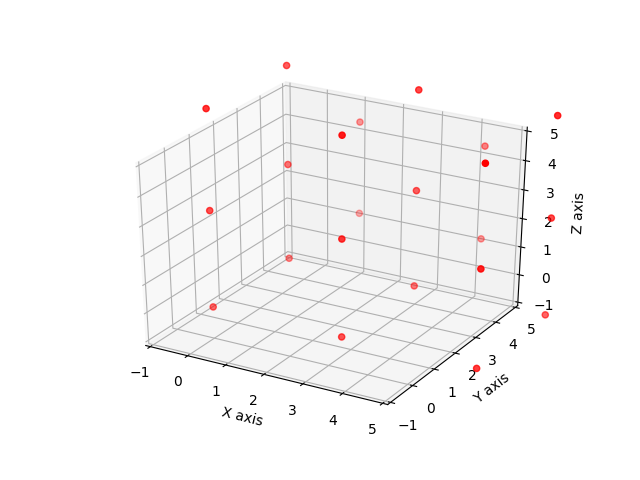

shape = 3
[-0.002724673213623441, -0.002724673213623441, -0.002724673213623441]
[-0.003208376016032691, -0.003208376016032691, 3.3333333333333335]
[-0.002724673213623441, -0.002724673213623441, 6.66939133988029]
[-0.003208376016032691, 3.3333333333333335, -0.003208376016032691]
[-0.0037967895047104857, 3.3333333333333335, 3.3333333333333335]
[-0.003208376016032691, 3.3333333333333335, 6.669875042682699]
[-0.002724673213623441, 6.66939133988029, -0.002724673213623441]
[-0.00320837601603269, 6.669875042682699, 3.3333333333333335]
[-0.002724673213623441, 6.66939133988029, 6.66939133988029]
[3.3333333333333335, -0.00320837601603269, -0.00320837601603269]
[3.3333333333333335, -0.0037967895047104853, 3.3333333333333335]
[3.3333333333333335, -0.00320837601603269, 6.669875042682699]
[3.3333333333333335, 3.3333333333333335, -0.0037967895047104853]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.670463456171378]
[3.3333333333333335, 6.66987

<IPython.core.display.Javascript object>


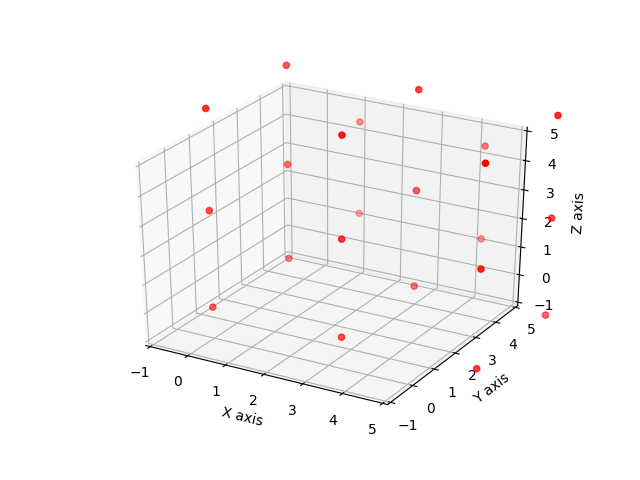

shape = 3
[-0.008169096154923308, -0.00816909615492331, -0.008169096154923308]
[-0.009619060224392892, -0.009619060224392892, 3.3333333333333335]
[-0.008169096154923308, -0.008169096154923308, 6.67483576282159]
[-0.009619060224392892, 3.3333333333333335, -0.009619060224392892]
[-0.011383233719408923, 3.3333333333333335, 3.3333333333333335]
[-0.009619060224392894, 3.3333333333333335, 6.676285726891059]
[-0.008169096154923308, 6.67483576282159, -0.008169096154923308]
[-0.009619060224392892, 6.676285726891059, 3.3333333333333335]
[-0.008169096154923308, 6.67483576282159, 6.67483576282159]
[3.3333333333333335, -0.009619060224392892, -0.009619060224392892]
[3.3333333333333335, -0.011383233719408923, 3.3333333333333335]
[3.3333333333333335, -0.009619060224392892, 6.676285726891059]
[3.3333333333333335, 3.3333333333333335, -0.011383233719408923]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.6780499003860765]
[3.3333333333333335, 6.6762

<IPython.core.display.Javascript object>

shape = 3
[-0.016323470015015197, -0.016323470015015204, -0.016323470015015197]
[-0.019219980213025407, -0.019219980213025414, 3.3333333333333335]
[-0.016323470015015197, -0.016323470015015197, 6.682990136681681]
[-0.019219980213025407, 3.3333333333333335, -0.019219980213025414]
[-0.022745138592359875, 3.3333333333333335, 3.3333333333333335]
[-0.019219980213025414, 3.3333333333333335, 6.685886646879692]
[-0.016323470015015197, 6.682990136681681, -0.016323470015015197]
[-0.019219980213025414, 6.685886646879692, 3.3333333333333335]
[-0.016323470015015197, 6.682990136681681, 6.682990136681681]
[3.3333333333333335, -0.019219980213025407, -0.019219980213025414]
[3.3333333333333335, -0.02274513859235988, 3.3333333333333335]
[3.3333333333333335, -0.019219980213025414, 6.685886646879692]
[3.3333333333333335, 3.3333333333333335, -0.02274513859235988]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.689411805259027]
[3.3333333333333335, 6.68

<IPython.core.display.Javascript object>


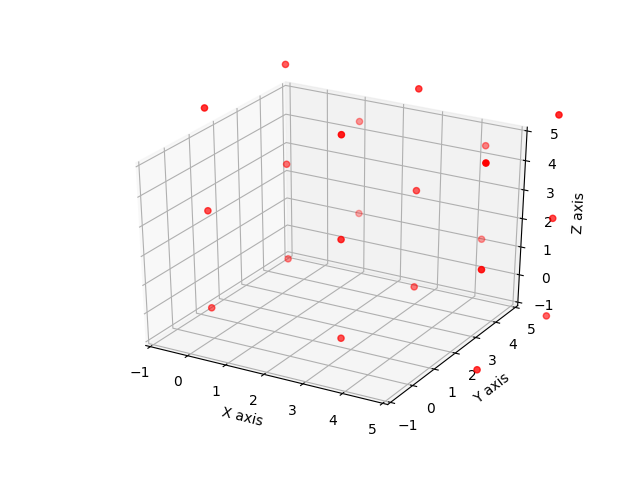

shape = 3
[-0.027173215865012774, -0.027173215865012784, -0.027173215865012774]
[-0.03199318386140601, -0.03199318386140602, 3.3333333333333335]
[-0.027173215865012774, -0.027173215865012774, 6.6938398825316785]
[-0.03199318386140601, 3.3333333333333335, -0.03199318386140602]
[-0.03786139992715965, 3.3333333333333335, 3.3333333333333335]
[-0.03199318386140602, 3.3333333333333335, 6.698659850528073]
[-0.027173215865012774, 6.6938398825316785, -0.027173215865012774]
[-0.03199318386140602, 6.698659850528073, 3.3333333333333335]
[-0.027173215865012774, 6.6938398825316785, 6.6938398825316785]
[3.3333333333333335, -0.03199318386140601, -0.03199318386140602]
[3.3333333333333335, -0.03786139992715966, 3.3333333333333335]
[3.3333333333333335, -0.03199318386140602, 6.698659850528073]
[3.3333333333333335, 3.3333333333333335, -0.03786139992715966]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.704528066593827]
[3.3333333333333335, 6.69865985

<IPython.core.display.Javascript object>

shape = 3
[-0.04069911470285239, -0.0406991147028524, -0.04069911470285239]
[-0.04791502276077253, -0.047915022760772544, 3.3333333333333335]
[-0.04069911470285239, -0.04069911470285239, 6.707365781369518]
[-0.04791502276077253, 3.3333333333333335, -0.047915022760772544]
[-0.056704222244693146, 3.3333333333333335, 3.3333333333333335]
[-0.047915022760772544, 3.3333333333333335, 6.7145816894274395]
[-0.04069911470285239, 6.707365781369518, -0.04069911470285239]
[-0.047915022760772544, 6.7145816894274395, 3.3333333333333335]
[-0.04069911470285239, 6.707365781369518, 6.707365781369518]
[3.3333333333333335, -0.04791502276077253, -0.047915022760772544]
[3.3333333333333335, -0.05670422224469315, 3.3333333333333335]
[3.3333333333333335, -0.047915022760772544, 6.7145816894274395]
[3.3333333333333335, 3.3333333333333335, -0.05670422224469315]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.723370888911361]
[3.3333333333333335, 6.71458168942

<IPython.core.display.Javascript object>


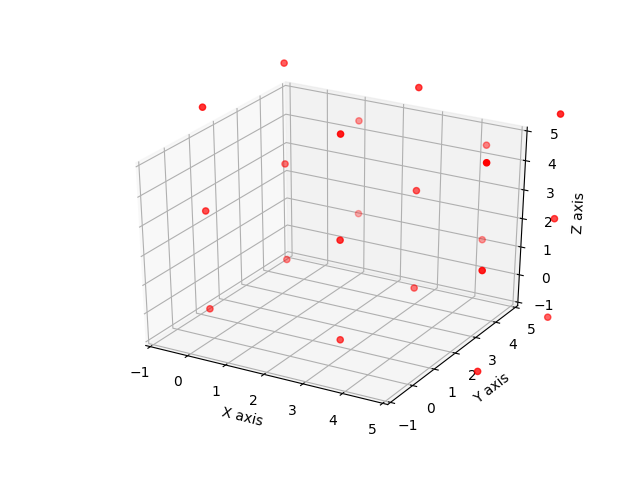

shape = 3
[-0.056877489164063336, -0.056877489164063356, -0.056877489164063336]
[-0.06695638969396625, -0.06695638969396626, 3.3333333333333335]
[-0.056877489164063336, -0.056877489164063336, 6.723544155830728]
[-0.06695638969396625, 3.3333333333333335, -0.06695638969396626]
[-0.07923940188298856, 3.3333333333333335, 3.3333333333333335]
[-0.06695638969396626, 3.3333333333333335, 6.733623056360633]
[-0.056877489164063336, 6.723544155830728, -0.056877489164063336]
[-0.06695638969396626, 6.733623056360633, 3.3333333333333335]
[-0.056877489164063336, 6.723544155830728, 6.723544155830728]
[3.3333333333333335, -0.06695638969396625, -0.06695638969396626]
[3.3333333333333335, -0.07923940188298857, 3.3333333333333335]
[3.3333333333333335, -0.06695638969396626, 6.733623056360633]
[3.3333333333333335, 3.3333333333333335, -0.07923940188298857]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.745906068549656]
[3.3333333333333335, 6.733623056360

<IPython.core.display.Javascript object>


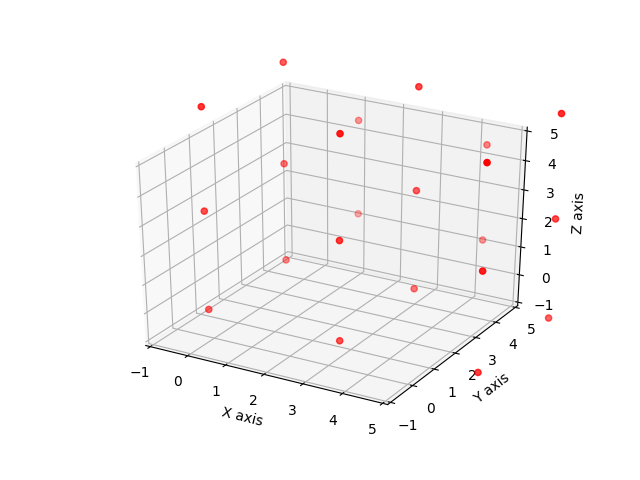

shape = 3
[-0.07568042286275196, -0.07568042286275199, -0.07568042286275196]
[-0.08908300451655743, -0.08908300451655746, 3.3333333333333335]
[-0.07568042286275196, -0.07568042286275196, 6.742347089529417]
[-0.08908300451655743, 3.3333333333333335, -0.08908300451655746]
[-0.10542666739214088, 3.3333333333333335, 3.3333333333333335]
[-0.08908300451655746, 3.3333333333333335, 6.755749671183224]
[-0.07568042286275196, 6.742347089529417, -0.07568042286275196]
[-0.08908300451655746, 6.755749671183224, 3.3333333333333335]
[-0.07568042286275196, 6.742347089529417, 6.742347089529417]
[3.3333333333333335, -0.08908300451655743, -0.08908300451655746]
[3.3333333333333335, -0.10542666739214089, 3.3333333333333335]
[3.3333333333333335, -0.08908300451655746, 6.755749671183224]
[3.3333333333333335, 3.3333333333333335, -0.10542666739214089]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.772093334058809]
[3.3333333333333335, 6.755749671183224, -0.

<IPython.core.display.Javascript object>

shape = 3
[-0.0970760126347994, -0.09707601263479942, -0.0970760126347994]
[-0.1142557418452923, -0.11425574184529233, 3.3333333333333335]
[-0.0970760126347994, -0.0970760126347994, 6.7637426793014646]
[-0.1142557418452923, 3.3333333333333335, -0.11425574184529233]
[-0.13522006915927515, 3.3333333333333335, 3.3333333333333335]
[-0.11425574184529233, 3.3333333333333335, 6.780922408511959]
[-0.0970760126347994, 6.7637426793014646, -0.0970760126347994]
[-0.11425574184529233, 6.780922408511959, 3.3333333333333335]
[-0.0970760126347994, 6.7637426793014646, 6.7637426793014646]
[3.3333333333333335, -0.1142557418452923, -0.11425574184529233]
[3.3333333333333335, -0.13522006915927515, 3.3333333333333335]
[3.3333333333333335, -0.11425574184529233, 6.780922408511959]
[3.3333333333333335, 3.3333333333333335, -0.13522006915927515]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.801886735825943]
[3.3333333333333335, 6.780922408511959, -0.114255

<IPython.core.display.Javascript object>


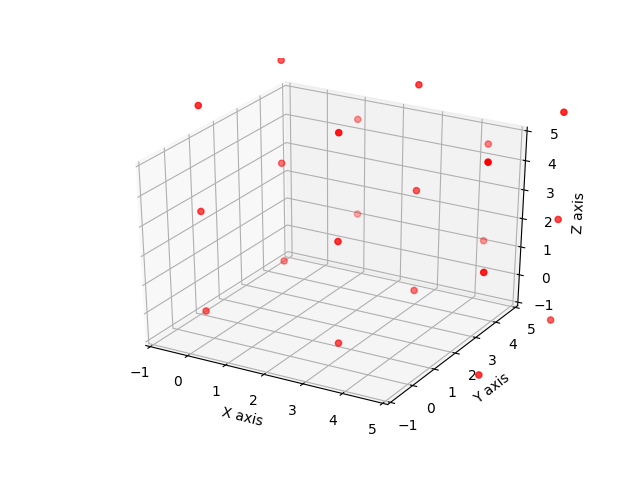

shape = 3
[-0.12102864844076586, -0.1210286484407659, -0.12102864844076587]
[-0.14243099329405512, -0.14243099329405517, 3.3333333333333335]
[-0.12102864844076587, -0.12102864844076587, 6.787695315107431]
[-0.14243099329405512, 3.3333333333333335, -0.14243099329405517]
[-0.16856840941849785, 3.3333333333333335, 3.3333333333333335]
[-0.14243099329405517, 3.3333333333333335, 6.809097659960722]
[-0.12102864844076587, 6.787695315107431, -0.12102864844076587]
[-0.14243099329405517, 6.809097659960722, 3.3333333333333335]
[-0.12102864844076587, 6.787695315107431, 6.787695315107431]
[3.3333333333333335, -0.14243099329405512, -0.14243099329405517]
[3.3333333333333335, -0.16856840941849788, 3.3333333333333335]
[3.3333333333333335, -0.14243099329405517, 6.809097659960722]
[3.3333333333333335, 3.3333333333333335, -0.16856840941849788]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.835235076085166]
[3.3333333333333335, 6.809097659960722, -0.1

<IPython.core.display.Javascript object>


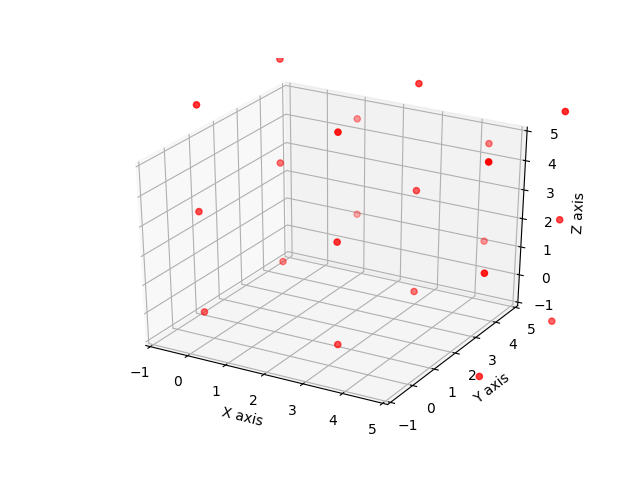

shape = 3
[-0.14749931536106592, -0.14749931536106597, -0.14749931536106592]
[-0.17356105661244753, -0.17356105661244758, 3.3333333333333335]
[-0.14749931536106592, -0.14749931536106592, 6.814165982027731]
[-0.17356105661244753, 3.3333333333333335, -0.17356105661244758]
[-0.20541570337386744, 3.3333333333333335, 3.3333333333333335]
[-0.17356105661244758, 3.3333333333333335, 6.840227723279114]
[-0.14749931536106592, 6.814165982027731, -0.14749931536106592]
[-0.17356105661244758, 6.840227723279114, 3.3333333333333335]
[-0.14749931536106592, 6.814165982027731, 6.814165982027731]
[3.3333333333333335, -0.17356105661244753, -0.17356105661244758]
[3.3333333333333335, -0.20541570337386747, 3.3333333333333335]
[3.3333333333333335, -0.17356105661244758, 6.840227723279114]
[3.3333333333333335, 3.3333333333333335, -0.20541570337386747]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.872082370040535]
[3.3333333333333335, 6.840227723279114, -0.

<IPython.core.display.Javascript object>

shape = 3
[-0.1764459119801681, -0.17644591198016815, -0.1764459119801681]
[-0.20759454397245405, -0.2075945439724541, 3.3333333333333335]
[-0.1764459119801681, -0.1764459119801681, 6.843112578646833]
[-0.20759454397245405, 3.3333333333333335, -0.2075945439724541]
[-0.24570166207937966, 3.3333333333333335, 3.3333333333333335]
[-0.2075945439724541, 3.3333333333333335, 6.874261210639121]
[-0.1764459119801681, 6.843112578646833, -0.1764459119801681]
[-0.2075945439724541, 6.874261210639121, 3.3333333333333335]
[-0.1764459119801681, 6.843112578646833, 6.843112578646833]
[3.3333333333333335, -0.20759454397245405, -0.2075945439724541]
[3.3333333333333335, -0.24570166207937968, 3.3333333333333335]
[3.3333333333333335, -0.2075945439724541, 6.874261210639121]
[3.3333333333333335, 3.3333333333333335, -0.24570166207937968]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.912368328746047]
[3.3333333333333335, 6.874261210639121, -0.2075945439724

<IPython.core.display.Javascript object>


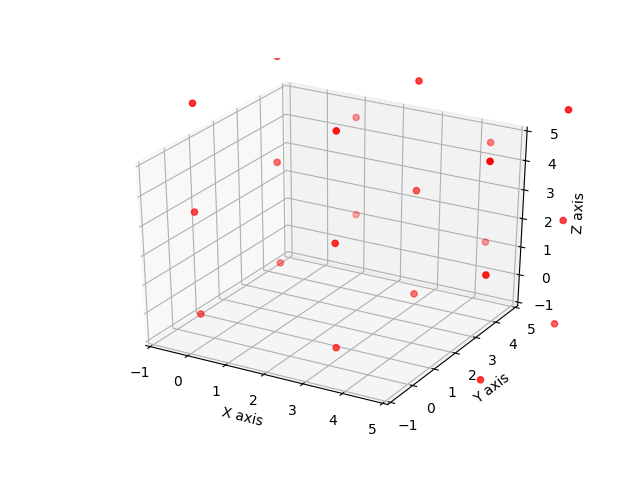

shape = 3
[-0.20782357950005248, -0.20782357950005254, -0.20782357950005248]
[-0.24447680179484033, -0.24447680179484038, 3.3333333333333335]
[-0.20782357950005248, -0.20782357950005248, 6.874490246166718]
[-0.24447680179484033, 3.3333333333333335, -0.24447680179484038]
[-0.28936218795031854, 3.3333333333333335, 3.3333333333333335]
[-0.24447680179484038, 3.3333333333333335, 6.911143468461507]
[-0.20782357950005248, 6.874490246166718, -0.20782357950005248]
[-0.24447680179484038, 6.911143468461507, 3.3333333333333335]
[-0.20782357950005248, 6.874490246166718, 6.874490246166718]
[3.3333333333333335, -0.24447680179484033, -0.24447680179484038]
[3.3333333333333335, -0.2893621879503186, 3.3333333333333335]
[3.3333333333333335, -0.24447680179484038, 6.911143468461507]
[3.3333333333333335, 3.3333333333333335, -0.2893621879503186]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 6.956028854616986]
[3.3333333333333335, 6.911143468461507, -0.24

<IPython.core.display.Javascript object>


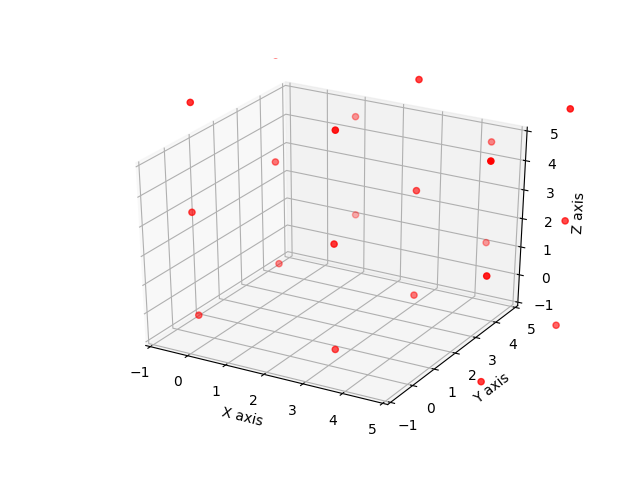

shape = 3
[-0.24158503612823967, -0.24158503612823973, -0.24158503612823967]
[-0.284150334877757, -0.28415033487775704, 3.3333333333333335]
[-0.24158503612823967, -0.24158503612823967, 6.908251702794905]
[-0.284150334877757, 3.3333333333333335, -0.28415033487775704]
[-0.3363298742823846, 3.3333333333333335, 3.3333333333333335]
[-0.28415033487775704, 3.3333333333333335, 6.950817001544424]
[-0.24158503612823967, 6.908251702794905, -0.24158503612823967]
[-0.28415033487775704, 6.950817001544424, 3.3333333333333335]
[-0.24158503612823967, 6.908251702794905, 6.908251702794905]
[3.3333333333333335, -0.284150334877757, -0.28415033487775704]
[3.3333333333333335, -0.33632987428238464, 3.3333333333333335]
[3.3333333333333335, -0.28415033487775704, 6.950817001544424]
[3.3333333333333335, 3.3333333333333335, -0.33632987428238464]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.002996540949052]
[3.3333333333333335, 6.950817001544424, -0.2841503

<IPython.core.display.Javascript object>


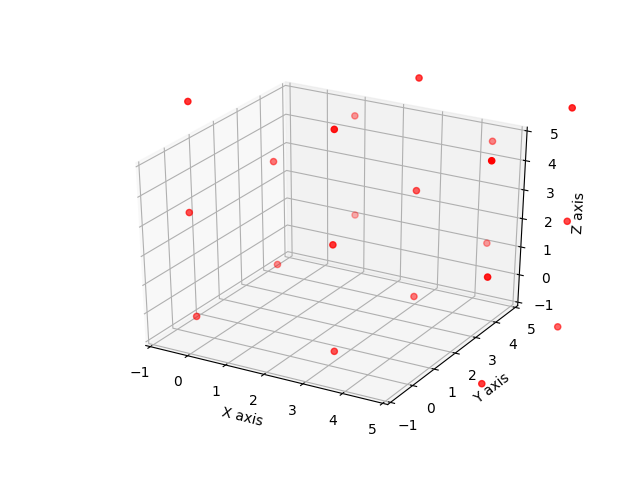

shape = 3
[-0.2776809116287424, -0.2776809116287425, -0.2776809116287424]
[-0.3265552281462227, -0.32655522814622273, 3.3333333333333335]
[-0.2776809116287424, -0.2776809116287424, 6.944347578295408]
[-0.3265552281462227, 3.3333333333333335, -0.32655522814622273]
[-0.38653450087661695, 3.3333333333333335, 3.3333333333333335]
[-0.32655522814622273, 3.3333333333333335, 6.99322189481289]
[-0.2776809116287424, 6.944347578295408, -0.2776809116287424]
[-0.32655522814622273, 6.99322189481289, 3.3333333333333335]
[-0.2776809116287424, 6.944347578295408, 6.944347578295408]
[3.3333333333333335, -0.3265552281462227, -0.32655522814622273]
[3.3333333333333335, -0.386534500876617, 3.3333333333333335]
[3.3333333333333335, -0.32655522814622273, 6.99322189481289]
[3.3333333333333335, 3.3333333333333335, -0.386534500876617]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.053201167543285]
[3.3333333333333335, 6.99322189481289, -0.3265552281462227]
[

<IPython.core.display.Javascript object>

shape = 3
[-0.3160600773777903, -0.3160600773777904, -0.3160600773777903]
[-0.37162956003889996, -0.3716295600389, 3.3333333333333335]
[-0.3160600773777903, -0.3160600773777903, 6.982726744044456]
[-0.37162956003889996, 3.3333333333333335, -0.3716295600389]
[-0.43990351875242434, 3.3333333333333335, 3.3333333333333335]
[-0.3716295600389, 3.3333333333333335, 7.038296226705567]
[-0.3160600773777903, 6.982726744044456, -0.3160600773777903]
[-0.3716295600389, 7.038296226705567, 3.3333333333333335]
[-0.3160600773777903, 6.982726744044456, 6.982726744044456]
[3.3333333333333335, -0.37162956003889996, -0.3716295600389]
[3.3333333333333335, -0.4399035187524244, 3.3333333333333335]
[3.3333333333333335, -0.3716295600389, 7.038296226705567]
[3.3333333333333335, 3.3333333333333335, -0.4399035187524244]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.106570185419092]
[3.3333333333333335, 7.038296226705567, -0.37162956003889996]
[3.333333333333

<IPython.core.display.Javascript object>

shape = 3
[-0.35666996780087323, -0.35666996780087334, -0.35666996780087323]
[-0.4193098023428479, -0.419309802342848, 3.3333333333333335]
[-0.35666996780087323, -0.35666996780087323, 7.0233366344675385]
[-0.4193098023428479, 3.3333333333333335, -0.419309802342848]
[-0.4963625179208762, 3.3333333333333335, 3.3333333333333335]
[-0.419309802342848, 3.3333333333333335, 7.085976469009515]
[-0.35666996780087323, 7.0233366344675385, -0.35666996780087323]
[-0.419309802342848, 7.085976469009515, 3.3333333333333335]
[-0.35666996780087323, 7.0233366344675385, 7.0233366344675385]
[3.3333333333333335, -0.4193098023428479, -0.419309802342848]
[3.3333333333333335, -0.49636251792087627, 3.3333333333333335]
[3.3333333333333335, -0.419309802342848, 7.085976469009515]
[3.3333333333333335, 3.3333333333333335, -0.49636251792087627]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.163029184587544]
[3.3333333333333335, 7.085976469009515, -0.419309802342

<IPython.core.display.Javascript object>

shape = 3
[-0.3994568896544104, -0.39945688965441056, -0.39945688965441045]
[-0.4695312021344631, -0.4695312021344631, 3.3333333333333335]
[-0.39945688965441045, -0.39945688965441045, 7.066123556321076]
[-0.4695312021344631, 3.3333333333333335, -0.4695312021344631]
[-0.5558356732320024, 3.3333333333333335, 3.3333333333333335]
[-0.46953120213446314, 3.3333333333333335, 7.136197868801131]
[-0.39945688965441045, 7.066123556321076, -0.39945688965441045]
[-0.46953120213446314, 7.136197868801131, 3.3333333333333335]
[-0.39945688965441045, 7.066123556321076, 7.066123556321076]
[3.3333333333333335, -0.4695312021344631, -0.46953120213446314]
[3.3333333333333335, -0.5558356732320024, 3.3333333333333335]
[3.3333333333333335, -0.46953120213446314, 7.136197868801131]
[3.3333333333333335, 3.3333333333333335, -0.5558356732320024]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.2225023398986705]
[3.3333333333333335, 7.136197868801131, -0.46953120

<IPython.core.display.Javascript object>

shape = 3
[-0.44436631622678285, -0.444366316226783, -0.4443663162267829]
[-0.5222281423463744, -0.5222281423463744, 3.3333333333333335]
[-0.4443663162267829, -0.4443663162267829, 7.111032982893448]
[-0.5222281423463744, 3.3333333333333335, -0.5222281423463744]
[-0.618246164355529, 3.3333333333333335, 3.3333333333333335]
[-0.5222281423463744, 3.3333333333333335, 7.188894809013042]
[-0.4443663162267829, 7.111032982893448, -0.4443663162267829]
[-0.5222281423463744, 7.188894809013042, 3.3333333333333335]
[-0.4443663162267829, 7.111032982893448, 7.111032982893448]
[3.3333333333333335, -0.5222281423463744, -0.5222281423463744]
[3.3333333333333335, -0.618246164355529, 3.3333333333333335]
[3.3333333333333335, -0.5222281423463744, 7.188894809013042]
[3.3333333333333335, 3.3333333333333335, -0.618246164355529]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.284912831022197]
[3.3333333333333335, 7.188894809013042, -0.5222281423463744]
[3.33

<IPython.core.display.Javascript object>


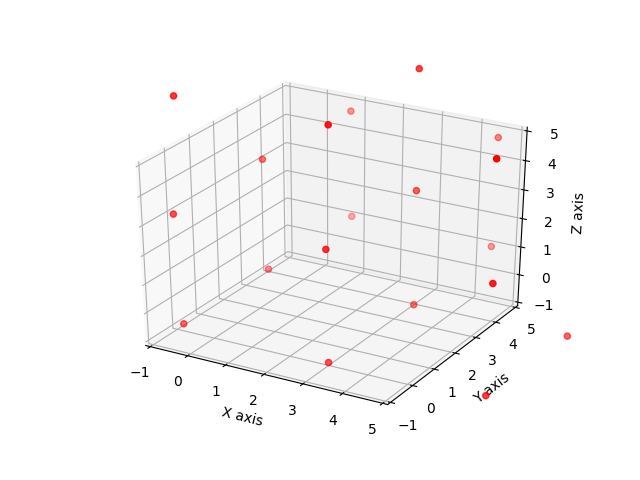

shape = 3
[-0.49134316414512624, -0.4913431641451264, -0.4913431641451263]
[-0.5773344783220368, -0.5773344783220368, 3.3333333333333335]
[-0.4913431641451263, -0.4913431641451263, 7.158009830811792]
[-0.5773344783220368, 3.3333333333333335, -0.5773344783220368]
[-0.683516566964435, 3.3333333333333335, 3.3333333333333335]
[-0.5773344783220368, 3.3333333333333335, 7.2440011449887045]
[-0.4913431641451263, 7.158009830811792, -0.4913431641451263]
[-0.5773344783220368, 7.2440011449887045, 3.3333333333333335]
[-0.4913431641451263, 7.158009830811792, 7.158009830811792]
[3.3333333333333335, -0.5773344783220368, -0.5773344783220368]
[3.3333333333333335, -0.683516566964435, 3.3333333333333335]
[3.3333333333333335, -0.5773344783220368, 7.2440011449887045]
[3.3333333333333335, 3.3333333333333335, -0.683516566964435]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.350183233631103]
[3.3333333333333335, 7.2440011449887045, -0.5773344783220368]


<IPython.core.display.Javascript object>


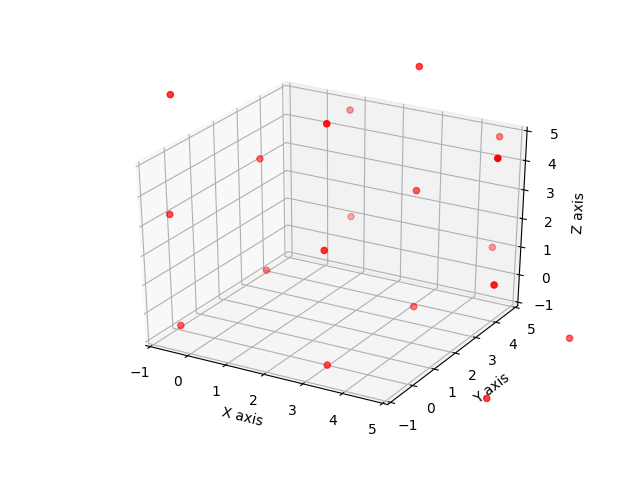

shape = 3
[-0.5403320510654931, -0.5403320510654932, -0.5403320510654931]
[-0.6347838485150996, -0.6347838485150996, 3.3333333333333335]
[-0.5403320510654931, -0.5403320510654931, 7.206998717732159]
[-0.6347838485150996, 3.3333333333333335, -0.6347838485150996]
[-0.7515692131338527, 3.3333333333333335, 3.3333333333333335]
[-0.6347838485150996, 3.3333333333333335, 7.3014505151817675]
[-0.5403320510654931, 7.206998717732159, -0.5403320510654931]
[-0.6347838485150996, 7.3014505151817675, 3.3333333333333335]
[-0.5403320510654931, 7.206998717732159, 7.206998717732159]
[3.3333333333333335, -0.6347838485150996, -0.6347838485150996]
[3.3333333333333335, -0.7515692131338527, 3.3333333333333335]
[3.3333333333333335, -0.6347838485150996, 7.3014505151817675]
[3.3333333333333335, 3.3333333333333335, -0.7515692131338527]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.418235879800521]
[3.3333333333333335, 7.3014505151817675, -0.6347838485150996

<IPython.core.display.Javascript object>


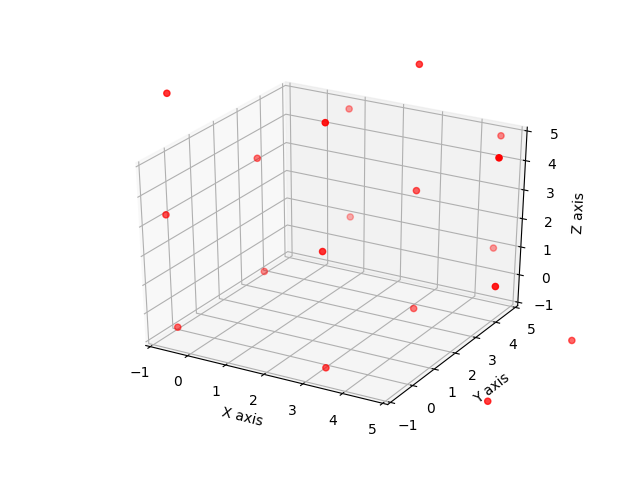

shape = 3
[-0.591277533078284, -0.5912775330782842, -0.5912775330782841]
[-0.6945099582190477, -0.6945099582190477, 3.3333333333333335]
[-0.5912775330782841, -0.5912775330782841, 7.25794419974495]
[-0.6945099582190477, 3.3333333333333335, -0.6945099582190477]
[-0.8223265198218167, 3.3333333333333335, 3.3333333333333335]
[-0.6945099582190477, 3.3333333333333335, 7.361176624885716]
[-0.5912775330782841, 7.25794419974495, -0.5912775330782841]
[-0.6945099582190477, 7.361176624885716, 3.3333333333333335]
[-0.5912775330782841, 7.25794419974495, 7.25794419974495]
[3.3333333333333335, -0.6945099582190477, -0.6945099582190477]
[3.3333333333333335, -0.8223265198218167, 3.3333333333333335]
[3.3333333333333335, -0.6945099582190477, 7.361176624885716]
[3.3333333333333335, 3.3333333333333335, -0.8223265198218167]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.488993186488485]
[3.3333333333333335, 7.361176624885716, -0.6945099582190477]
[3.3333

<IPython.core.display.Javascript object>


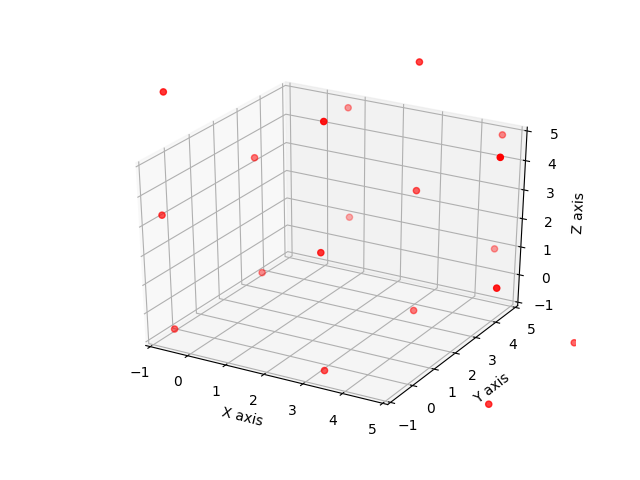

shape = 3
[-0.6441243211660238, -0.6441243211660241, -0.644124321166024]
[-0.7564468358604447, -0.7564468358604447, 3.3333333333333335]
[-0.644124321166024, -0.644124321166024, 7.310790987832689]
[-0.7564468358604447, 3.3333333333333335, -0.7564468358604447]
[-0.8957112850490633, 3.3333333333333335, 3.3333333333333335]
[-0.7564468358604447, 3.3333333333333335, 7.423113502527113]
[-0.644124321166024, 7.310790987832689, -0.644124321166024]
[-0.7564468358604447, 7.423113502527113, 3.3333333333333335]
[-0.644124321166024, 7.310790987832689, 7.310790987832689]
[3.3333333333333335, -0.7564468358604447, -0.7564468358604447]
[3.3333333333333335, -0.8957112850490633, 3.3333333333333335]
[3.3333333333333335, -0.7564468358604447, 7.423113502527113]
[3.3333333333333335, 3.3333333333333335, -0.8957112850490633]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.562377951715732]
[3.3333333333333335, 7.423113502527113, -0.7564468358604447]
[3.33333

<IPython.core.display.Javascript object>


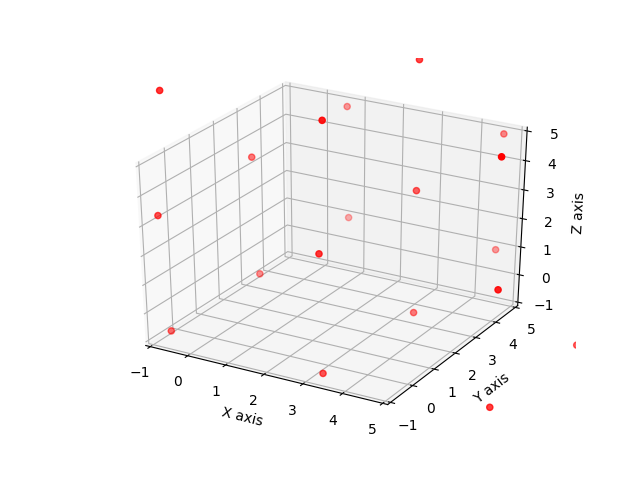

shape = 3
[-0.6988174764985181, -0.6988174764985184, -0.6988174764985183]
[-0.820529061948641, -0.820529061948641, 3.3333333333333335]
[-0.6988174764985183, -0.6988174764985183, 7.365484143165183]
[-0.820529061948641, 3.3333333333333335, -0.820529061948641]
[-0.9716469520356004, 3.3333333333333335, 3.3333333333333335]
[-0.820529061948641, 3.3333333333333335, 7.487195728615309]
[-0.6988174764985183, 7.365484143165183, -0.6988174764985183]
[-0.820529061948641, 7.487195728615309, 3.3333333333333335]
[-0.6988174764985183, 7.365484143165184, 7.365484143165184]
[3.3333333333333335, -0.820529061948641, -0.820529061948641]
[3.3333333333333335, -0.9716469520356005, 3.3333333333333335]
[3.3333333333333335, -0.820529061948641, 7.487195728615309]
[3.3333333333333335, 3.3333333333333335, -0.9716469520356005]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.638313618702269]
[3.3333333333333335, 7.487195728615309, -0.820529061948641]
[3.333333333

<IPython.core.display.Javascript object>


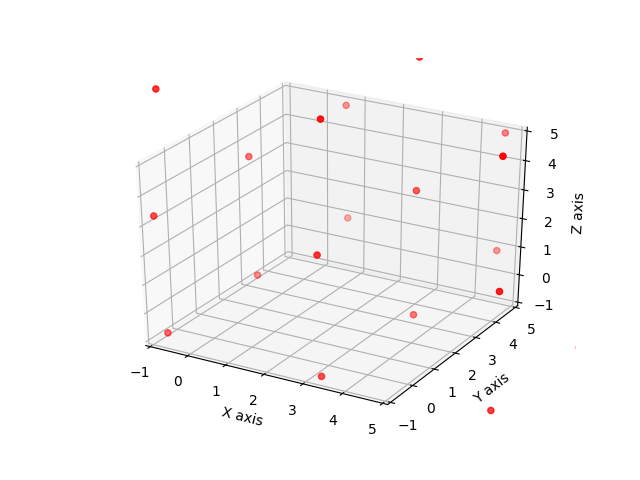

shape = 3
[-0.7553025847367736, -0.7553025847367739, -0.7553025847367738]
[-0.8866919712434738, -0.8866919712434738, 3.3333333333333335]
[-0.7553025847367738, -0.7553025847367738, 7.421969251403438]
[-0.8866919712434738, 3.3333333333333335, -0.8866919712434738]
[-1.0500578420812259, 3.3333333333333335, 3.3333333333333335]
[-0.8866919712434738, 3.3333333333333335, 7.553358637910142]
[-0.7553025847367738, 7.421969251403438, -0.7553025847367738]
[-0.8866919712434738, 7.553358637910142, 3.3333333333333335]
[-0.7553025847367738, 7.421969251403439, 7.421969251403439]
[3.3333333333333335, -0.8866919712434738, -0.8866919712434738]
[3.3333333333333335, -1.0500578420812259, 3.3333333333333335]
[3.3333333333333335, -0.8866919712434738, 7.553358637910142]
[3.3333333333333335, 3.3333333333333335, -1.0500578420812259]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.716724508747895]
[3.3333333333333335, 7.553358637910142, -0.8866919712434738]
[3

<IPython.core.display.Javascript object>

shape = 3
[-0.8135259098405686, -0.8135259098405689, -0.8135259098405688]
[-0.9548718290818797, -0.9548718290818797, 3.3333333333333335]
[-0.8135259098405688, -0.8135259098405688, 7.480192576507234]
[-0.9548718290818797, 3.3333333333333335, -0.9548718290818797]
[-1.1308693573994282, 3.3333333333333335, 3.3333333333333335]
[-0.9548718290818797, 3.3333333333333335, 7.621538495748548]
[-0.8135259098405688, 7.480192576507234, -0.8135259098405688]
[-0.9548718290818796, 7.621538495748548, 3.3333333333333335]
[-0.8135259098405688, 7.480192576507235, 7.480192576507235]
[3.3333333333333335, -0.9548718290818797, -0.9548718290818797]
[3.3333333333333335, -1.1308693573994282, 3.3333333333333335]
[3.3333333333333335, -0.9548718290818797, 7.621538495748548]
[3.3333333333333335, 3.3333333333333335, -1.1308693573994282]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.797536024066097]
[3.3333333333333335, 7.621538495748548, -0.9548718290818797]
[3

<IPython.core.display.Javascript object>


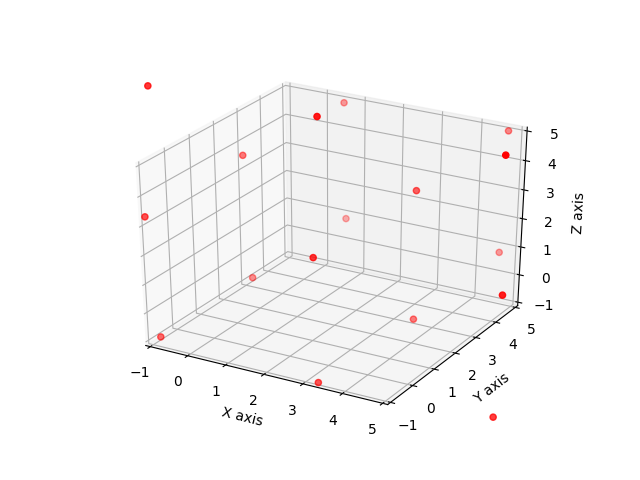

shape = 3
[-0.8734345281365831, -0.8734345281365834, -0.8734345281365834]
[-1.0250059830992366, -1.0250059830992366, 3.3333333333333335]
[-0.8734345281365834, -0.8734345281365834, 7.540101194803248]
[-1.0250059830992366, 3.3333333333333335, -1.0250059830992366]
[-1.214008155436459, 3.3333333333333335, 3.3333333333333335]
[-1.0250059830992366, 3.3333333333333335, 7.691672649765905]
[-0.8734345281365834, 7.540101194803248, -0.8734345281365834]
[-1.0250059830992364, 7.691672649765905, 3.3333333333333335]
[-0.8734345281365834, 7.540101194803249, 7.540101194803249]
[3.3333333333333335, -1.0250059830992366, -1.0250059830992366]
[3.3333333333333335, -1.214008155436459, 3.3333333333333335]
[3.3333333333333335, -1.0250059830992366, 7.691672649765905]
[3.3333333333333335, 3.3333333333333335, -1.214008155436459]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.880674822103128]
[3.3333333333333335, 7.691672649765905, -1.0250059830992366]
[3.33

<IPython.core.display.Javascript object>


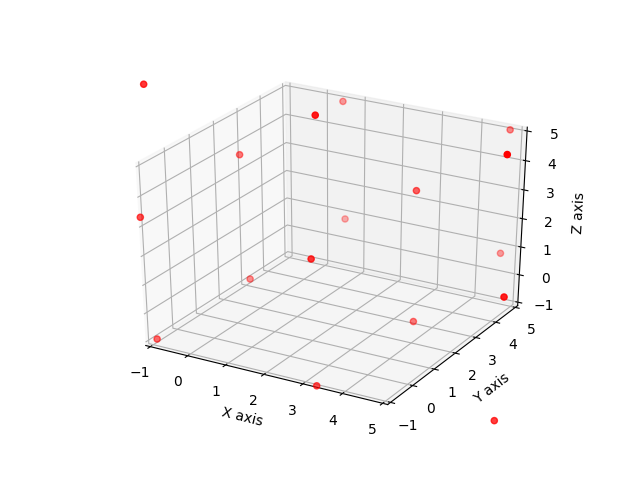

shape = 3
[-0.9349764436078825, -0.9349764436078828, -0.9349764436078828]
[-1.0970329917986754, -1.0970329917986754, 3.3333333333333335]
[-0.9349764436078828, -0.9349764436078828, 7.601643110274548]
[-1.0970329917986754, 3.3333333333333335, -1.0970329917986754]
[-1.2994022964394285, 3.3333333333333335, 3.3333333333333335]
[-1.0970329917986754, 3.3333333333333335, 7.7636996584653435]
[-0.9349764436078828, 7.601643110274548, -0.9349764436078828]
[-1.0970329917986752, 7.7636996584653435, 3.3333333333333335]
[-0.9349764436078828, 7.601643110274549, 7.601643110274549]
[3.3333333333333335, -1.0970329917986754, -1.0970329917986754]
[3.3333333333333335, -1.2994022964394285, 3.3333333333333335]
[3.3333333333333335, -1.0970329917986754, 7.7636996584653435]
[3.3333333333333335, 3.3333333333333335, -1.2994022964394285]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 7.966068963106097]
[3.3333333333333335, 7.7636996584653435, -1.0970329917986754

<IPython.core.display.Javascript object>


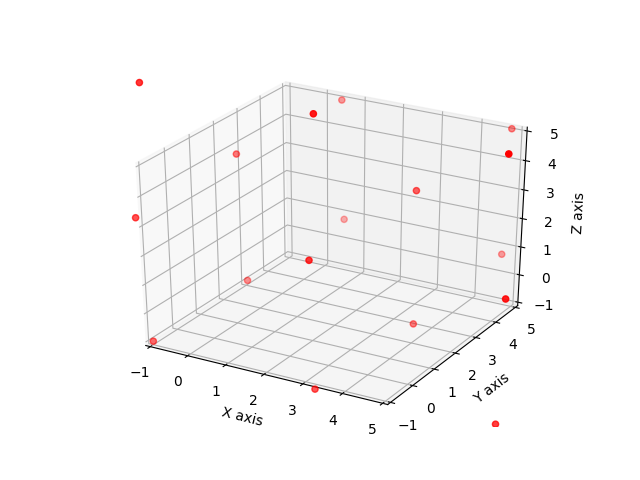

shape = 3
[-0.9981006855160555, -0.9981006855160558, -0.9981006855160558]
[-1.1708927315699886, -1.1708927315699886, 3.3333333333333335]
[-0.9981006855160558, -0.9981006855160558, 7.664767352182721]
[-1.1708927315699886, 3.3333333333333335, -1.1708927315699886]
[-1.3869813661899684, 3.3333333333333335, 3.3333333333333335]
[-1.1708927315699886, 3.3333333333333335, 7.837559398236657]
[-0.9981006855160558, 7.664767352182721, -0.9981006855160558]
[-1.1708927315699884, 7.837559398236657, 3.3333333333333335]
[-0.9981006855160558, 7.6647673521827215, 7.6647673521827215]
[3.3333333333333335, -1.1708927315699886, -1.1708927315699886]
[3.3333333333333335, -1.3869813661899684, 3.3333333333333335]
[3.3333333333333335, -1.1708927315699886, 7.837559398236657]
[3.3333333333333335, 3.3333333333333335, -1.3869813661899684]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.053648032856637]
[3.3333333333333335, 7.837559398236657, -1.1708927315699886]


<IPython.core.display.Javascript object>

shape = 3
[-1.0627573895700926, -1.0627573895700928, -1.0627573895700928]
[-1.2465264838482428, -1.2465264838482428, 3.3333333333333335]
[-1.0627573895700928, -1.0627573895700928, 7.729424056236757]
[-1.2465264838482428, 3.3333333333333335, -1.2465264838482428]
[-1.4766765759047396, 3.3333333333333335, 3.3333333333333335]
[-1.2465264838482428, 3.3333333333333335, 7.913193150514911]
[-1.0627573895700928, 7.729424056236757, -1.0627573895700928]
[-1.2465264838482426, 7.913193150514911, 3.3333333333333335]
[-1.0627573895700928, 7.729424056236758, 7.729424056236758]
[3.3333333333333335, -1.2465264838482428, -1.2465264838482428]
[3.3333333333333335, -1.4766765759047396, 3.3333333333333335]
[3.3333333333333335, -1.2465264838482428, 7.913193150514911]
[3.3333333333333335, 3.3333333333333335, -1.4766765759047396]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.143343242571408]
[3.3333333333333335, 7.913193150514911, -1.2465264838482428]
[3

<IPython.core.display.Javascript object>

shape = 3
[-1.128897863917287, -1.1288978639172873, -1.1288978639172873]
[-1.3238770041400705, -1.3238770041400705, 3.3333333333333335]
[-1.1288978639172873, -1.1288978639172873, 7.795564530583952]
[-1.3238770041400705, 3.3333333333333335, -1.3238770041400705]
[-1.5684208413321334, 3.3333333333333335, 3.3333333333333335]
[-1.3238770041400705, 3.3333333333333335, 7.990543670806739]
[-1.1288978639172873, 7.795564530583952, -1.1288978639172873]
[-1.3238770041400703, 7.990543670806739, 3.3333333333333335]
[-1.1288978639172873, 7.7955645305839525, 7.7955645305839525]
[3.3333333333333335, -1.3238770041400705, -1.3238770041400705]
[3.3333333333333335, -1.5684208413321334, 3.3333333333333335]
[3.3333333333333335, -1.3238770041400705, 7.990543670806739]
[3.3333333333333335, 3.3333333333333335, -1.5684208413321334]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.235087507998802]
[3.3333333333333335, 7.990543670806739, -1.3238770041400705]
[

<IPython.core.display.Javascript object>

shape = 3
[-1.1964746412572784, -1.1964746412572786, -1.1964746412572786]
[-1.4028885746418487, -1.4028885746418487, 3.3333333333333335]
[-1.1964746412572786, -1.1964746412572786, 7.863141307923943]
[-1.4028885746418487, 3.3333333333333335, -1.4028885746418487]
[-1.6621488430566287, 3.3333333333333335, 3.3333333333333335]
[-1.4028885746418487, 3.3333333333333335, 8.069555241308517]
[-1.1964746412572786, 7.863141307923943, -1.1964746412572786]
[-1.4028885746418485, 8.069555241308517, 3.3333333333333335]
[-1.1964746412572786, 7.863141307923944, 7.863141307923944]
[3.3333333333333335, -1.4028885746418487, -1.4028885746418487]
[3.3333333333333335, -1.6621488430566287, 3.3333333333333335]
[3.3333333333333335, -1.4028885746418487, 8.069555241308517]
[3.3333333333333335, 3.3333333333333335, -1.6621488430566287]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.328815509723297]
[3.3333333333333335, 8.069555241308517, -1.4028885746418487]
[3

<IPython.core.display.Javascript object>

shape = 3
[-1.2654415183769088, -1.265441518376909, -1.265441518376909]
[-1.4835070421369883, -1.4835070421369883, 3.3333333333333335]
[-1.265441518376909, -1.265441518376909, 7.932108185043574]
[-1.4835070421369883, 3.3333333333333335, -1.4835070421369883]
[-1.757797069968258, 3.3333333333333335, 3.3333333333333335]
[-1.4835070421369883, 3.3333333333333335, 8.150173708803656]
[-1.265441518376909, 7.932108185043574, -1.265441518376909]
[-1.483507042136988, 8.150173708803656, 3.3333333333333335]
[-1.265441518376909, 7.932108185043575, 7.932108185043575]
[3.3333333333333335, -1.4835070421369883, -1.4835070421369883]
[3.3333333333333335, -1.757797069968258, 3.3333333333333335]
[3.3333333333333335, -1.4835070421369883, 8.150173708803656]
[3.3333333333333335, 3.3333333333333335, -1.757797069968258]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.424463736634927]
[3.3333333333333335, 8.150173708803656, -1.4835070421369883]
[3.3333333333

<IPython.core.display.Javascript object>

shape = 3
[-1.3357535843765465, -1.3357535843765467, -1.3357535843765467]
[-1.5656798427969532, -1.5656798427969532, 3.3333333333333335]
[-1.3357535843765467, -1.3357535843765467, 8.002420251043212]
[-1.5656798427969532, 3.3333333333333335, -1.5656798427969532]
[-1.8553038477732733, 3.3333333333333335, 3.3333333333333335]
[-1.5656798427969532, 3.3333333333333335, 8.232346509463621]
[-1.3357535843765467, 8.002420251043212, -1.3357535843765467]
[-1.565679842796953, 8.232346509463621, 3.3333333333333335]
[-1.3357535843765467, 8.002420251043212, 8.002420251043212]
[3.3333333333333335, -1.5656798427969532, -1.5656798427969532]
[3.3333333333333335, -1.8553038477732733, 3.3333333333333335]
[3.3333333333333335, -1.5656798427969532, 8.232346509463621]
[3.3333333333333335, 3.3333333333333335, -1.8553038477732733]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.521970514439943]
[3.3333333333333335, 8.232346509463621, -1.5656798427969532]
[3.

<IPython.core.display.Javascript object>


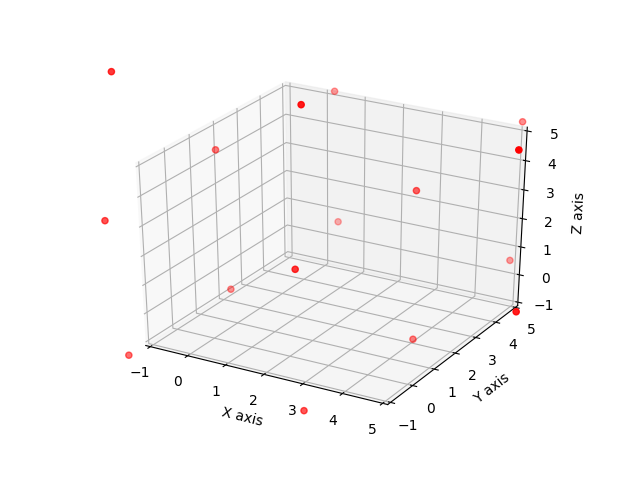

shape = 3
[-1.4073672388131362, -1.4073672388131364, -1.4073672388131364]
[-1.6493560154291431, -1.6493560154291431, 3.3333333333333335]
[-1.4073672388131364, -1.4073672388131364, 8.074033905479801]
[-1.6493560154291431, 3.3333333333333335, -1.6493560154291431]
[-1.9546093543209984, 3.3333333333333335, 3.3333333333333335]
[-1.6493560154291431, 3.3333333333333335, 8.316022682095811]
[-1.4073672388131364, 8.074033905479801, -1.4073672388131364]
[-1.649356015429143, 8.316022682095811, 3.3333333333333335]
[-1.4073672388131364, 8.074033905479801, 8.074033905479801]
[3.3333333333333335, -1.6493560154291431, -1.6493560154291431]
[3.3333333333333335, -1.9546093543209984, 3.3333333333333335]
[3.3333333333333335, -1.6493560154291431, 8.316022682095811]
[3.3333333333333335, 3.3333333333333335, -1.9546093543209984]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.621276020987668]
[3.3333333333333335, 8.316022682095811, -1.6493560154291431]
[3.

<IPython.core.display.Javascript object>


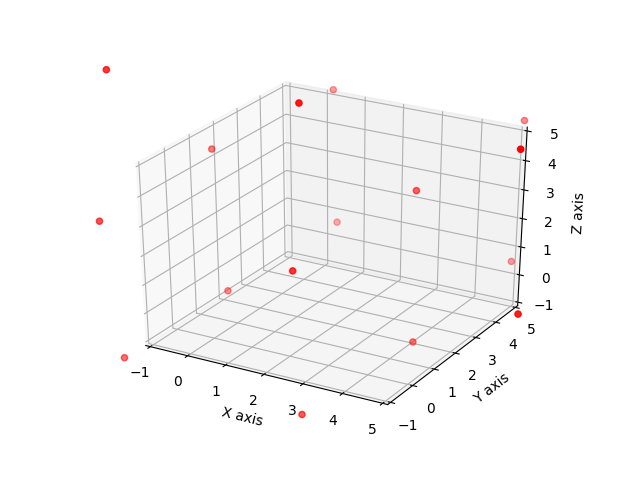

shape = 3
[-1.4802402009261384, -1.4802402009261386, -1.4802402009261386]
[-1.7344862046201859, -1.7344862046201859, 3.3333333333333335]
[-1.4802402009261386, -1.4802402009261386, 8.146906867592804]
[-1.7344862046201859, 3.3333333333333335, -1.7344862046201859]
[-2.055655623407518, 3.3333333333333335, 3.3333333333333335]
[-1.7344862046201859, 3.3333333333333335, 8.401152871286854]
[-1.4802402009261386, 8.146906867592804, -1.4802402009261386]
[-1.7344862046201857, 8.401152871286854, 3.3333333333333335]
[-1.4802402009261386, 8.146906867592804, 8.146906867592804]
[3.3333333333333335, -1.7344862046201859, -1.7344862046201859]
[3.3333333333333335, -2.055655623407518, 3.3333333333333335]
[3.3333333333333335, -1.7344862046201859, 8.401152871286854]
[3.3333333333333335, 3.3333333333333335, -2.055655623407518]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.722322290074187]
[3.3333333333333335, 8.401152871286854, -1.7344862046201859]
[3.33

<IPython.core.display.Javascript object>


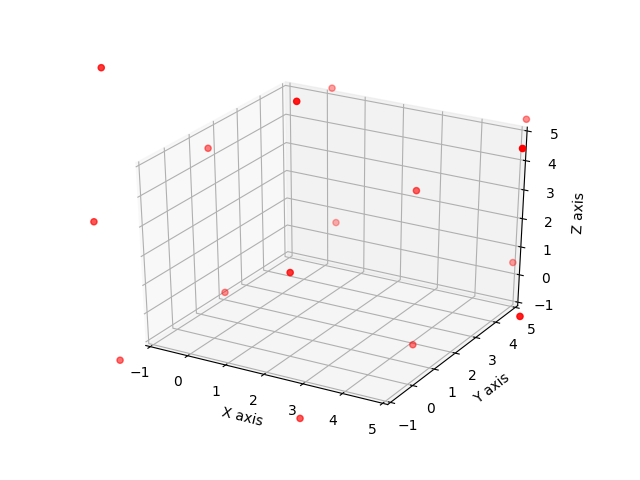

shape = 3
[-1.5543315110437168, -1.554331511043717, -1.554331511043717]
[-1.8210226551203699, -1.8210226551203699, 3.3333333333333335]
[-1.554331511043717, -1.554331511043717, 8.220998177710383]
[-1.8210226551203699, 3.3333333333333335, -1.8210226551203699]
[-2.1583865385946477, 3.3333333333333335, 3.3333333333333335]
[-1.8210226551203699, 3.3333333333333335, 8.487689321787037]
[-1.554331511043717, 8.220998177710383, -1.554331511043717]
[-1.8210226551203696, 8.487689321787037, 3.3333333333333335]
[-1.554331511043717, 8.220998177710383, 8.220998177710383]
[3.3333333333333335, -1.8210226551203699, -1.8210226551203699]
[3.3333333333333335, -2.1583865385946477, 3.3333333333333335]
[3.3333333333333335, -1.8210226551203699, 8.487689321787037]
[3.3333333333333335, 3.3333333333333335, -2.1583865385946477]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.825053205261316]
[3.3333333333333335, 8.487689321787037, -1.8210226551203699]
[3.333333

<IPython.core.display.Javascript object>


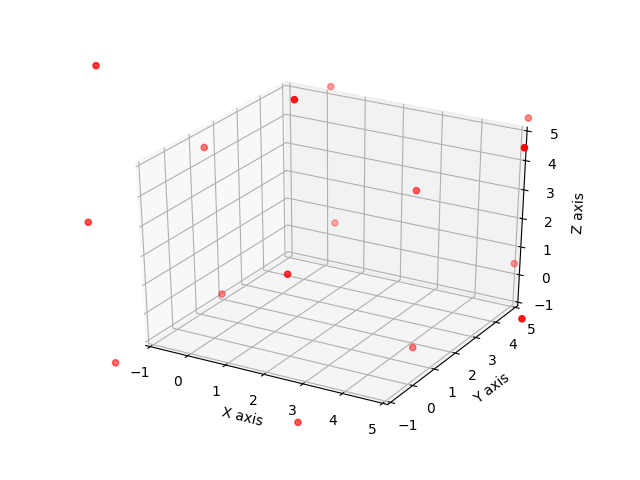

shape = 3
[-1.6296015251914955, -1.6296015251914957, -1.6296015251914957]
[-1.9089191987079275, -1.9089191987079275, 3.3333333333333335]
[-1.6296015251914957, -1.6296015251914957, 8.296268191858163]
[-1.9089191987079275, 3.3333333333333335, -1.9089191987079275]
[-2.262747818456945, 3.3333333333333335, 3.3333333333333335]
[-1.9089191987079275, 3.3333333333333335, 8.575585865374595]
[-1.6296015251914957, 8.296268191858163, -1.6296015251914957]
[-1.9089191987079273, 8.575585865374595, 3.3333333333333335]
[-1.6296015251914957, 8.296268191858163, 8.296268191858163]
[3.3333333333333335, -1.9089191987079275, -1.9089191987079275]
[3.3333333333333335, -2.262747818456945, 3.3333333333333335]
[3.3333333333333335, -1.9089191987079275, 8.575585865374595]
[3.3333333333333335, 3.3333333333333335, -2.262747818456945]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 8.929414485123614]
[3.3333333333333335, 8.575585865374595, -1.9089191987079275]
[3.33

<IPython.core.display.Javascript object>


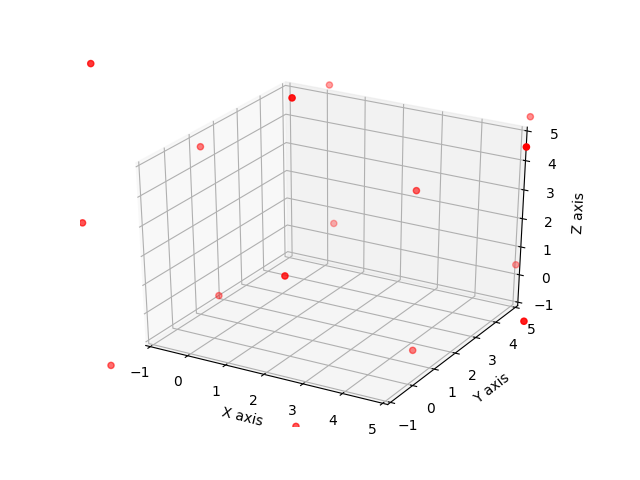

shape = 3
[-1.7060119038477548, -1.706011903847755, -1.706011903847755]
[-1.9981312346638505, -1.9981312346638505, 3.3333333333333335]
[-1.706011903847755, -1.706011903847755, 8.372678570514422]
[-1.9981312346638505, 3.3333333333333335, -1.9981312346638505]
[-2.368686994543799, 3.3333333333333335, 3.3333333333333335]
[-1.9981312346638505, 3.3333333333333335, 8.664797901330518]
[-1.706011903847755, 8.372678570514422, -1.706011903847755]
[-1.9981312346638502, 8.664797901330518, 3.3333333333333335]
[-1.706011903847755, 8.372678570514422, 8.372678570514422]
[3.3333333333333335, -1.9981312346638505, -1.9981312346638505]
[3.3333333333333335, -2.368686994543799, 3.3333333333333335]
[3.3333333333333335, -1.9981312346638505, 8.664797901330518]
[3.3333333333333335, 3.3333333333333335, -2.368686994543799]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.035353661210468]
[3.3333333333333335, 8.664797901330518, -1.9981312346638505]
[3.333333333

<IPython.core.display.Javascript object>


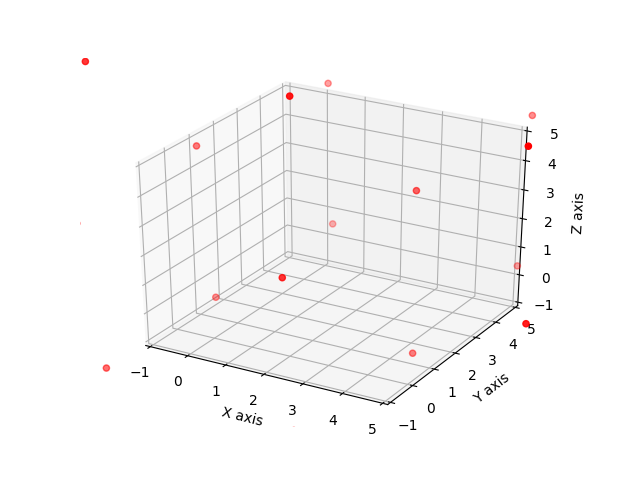

shape = 3
[-1.7835255957094145, -1.7835255957094147, -1.7835255957094147]
[-2.0886157048814193, -2.0886157048814193, 3.3333333333333335]
[-1.7835255957094147, -1.7835255957094147, 8.450192262376081]
[-2.0886157048814193, 3.3333333333333335, -2.0886157048814193]
[-2.4761533832205784, 3.3333333333333335, 3.3333333333333335]
[-2.0886157048814193, 3.3333333333333335, 8.755282371548088]
[-1.7835255957094147, 8.450192262376081, -1.7835255957094147]
[-2.0886157048814193, 8.755282371548088, 3.3333333333333335]
[-1.7835255957094147, 8.450192262376081, 8.450192262376081]
[3.3333333333333335, -2.0886157048814193, -2.0886157048814193]
[3.3333333333333335, -2.4761533832205784, 3.3333333333333335]
[3.3333333333333335, -2.0886157048814193, 8.755282371548088]
[3.3333333333333335, 3.3333333333333335, -2.4761533832205784]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.142820049887249]
[3.3333333333333335, 8.755282371548088, -2.0886157048814193]
[3

<IPython.core.display.Javascript object>


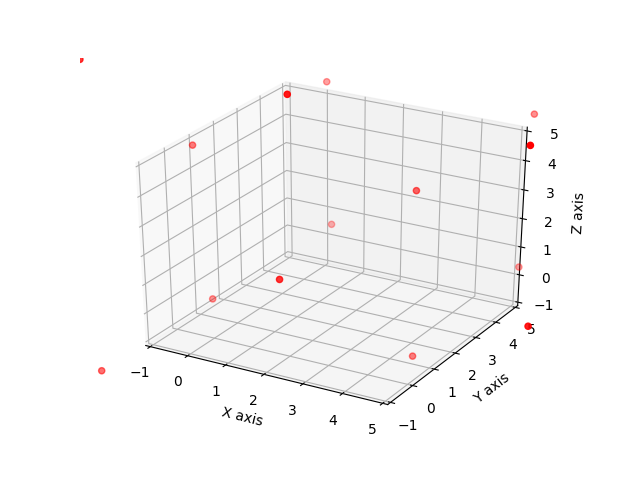

shape = 3
[-1.8621068172543935, -1.8621068172543938, -1.8621068172543938]
[-2.180331064531541, -2.180331064531541, 3.3333333333333335]
[-1.8621068172543938, -1.8621068172543938, 8.52877348392106]
[-2.180331064531541, 3.3333333333333335, -2.180331064531541]
[-2.5850980524343643, 3.3333333333333335, 3.3333333333333335]
[-2.180331064531541, 3.3333333333333335, 8.84699773119821]
[-1.8621068172543938, 8.52877348392106, -1.8621068172543938]
[-2.180331064531541, 8.84699773119821, 3.3333333333333335]
[-1.8621068172543938, 8.52877348392106, 8.52877348392106]
[3.3333333333333335, -2.180331064531541, -2.180331064531541]
[3.3333333333333335, -2.5850980524343643, 3.3333333333333335]
[3.3333333333333335, -2.180331064531541, 8.84699773119821]
[3.3333333333333335, 3.3333333333333335, -2.5850980524343643]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.251764719101034]
[3.3333333333333335, 8.84699773119821, -2.180331064531541]
[3.3333333333333335,

<IPython.core.display.Javascript object>


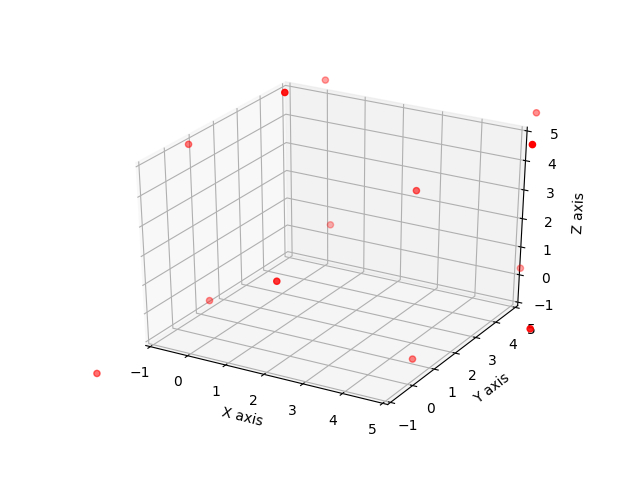

shape = 3
[-1.9417210288093494, -1.9417210288093496, -1.9417210288093496]
[-2.273237249106705, -2.273237249106705, 3.3333333333333335]
[-1.9417210288093496, -1.9417210288093496, 8.608387695476017]
[-2.273237249106705, 3.3333333333333335, -2.273237249106705]
[-2.69547378433739, 3.3333333333333335, 3.3333333333333335]
[-2.273237249106705, 3.3333333333333335, 8.939903915773373]
[-1.9417210288093496, 8.608387695476017, -1.9417210288093496]
[-2.273237249106705, 8.939903915773373, 3.3333333333333335]
[-1.9417210288093496, 8.608387695476017, 8.608387695476017]
[3.3333333333333335, -2.273237249106705, -2.273237249106705]
[3.3333333333333335, -2.69547378433739, 3.3333333333333335]
[3.3333333333333335, -2.273237249106705, 8.939903915773373]
[3.3333333333333335, 3.3333333333333335, -2.69547378433739]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 9.36214045100406]
[3.3333333333333335, 8.939903915773373, -2.273237249106705]
[3.3333333333333335

<IPython.core.display.Javascript object>

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



shape = 3
[-2.439314416219148, -2.4393144162191485, -2.4393144162191485]
[-2.8536151472561992, -2.8536151472561992, 3.3333333333333335]
[-2.4393144162191485, -2.4393144162191485, 9.105981082885815]
[-2.8536151472561992, 3.3333333333333335, -2.8536151472561992]
[-3.3853415587269304, 3.3333333333333335, 3.3333333333333335]
[-2.8536151472561992, 3.3333333333333335, 9.520281813922868]
[-2.4393144162191485, 9.105981082885815, -2.4393144162191485]
[-2.8536151472561992, 9.520281813922868, 3.3333333333333335]
[-2.4393144162191485, 9.105981082885815, 9.105981082885815]
[3.3333333333333335, -2.8536151472561992, -2.8536151472561992]
[3.3333333333333335, -3.3853415587269304, 3.3333333333333335]
[3.3333333333333335, -2.8536151472561992, 9.520281813922868]
[3.3333333333333335, 3.3333333333333335, -3.3853415587269304]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.052008225393601]
[3.3333333333333335, 9.520281813922868, -2.8536151472561992]
[3

<IPython.core.display.Javascript object>


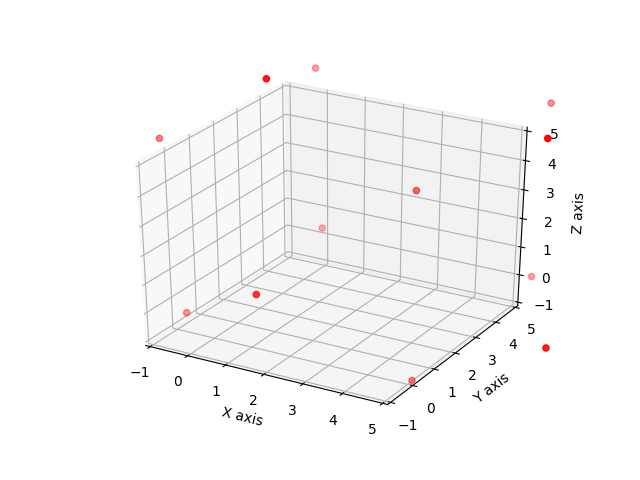

shape = 3
[-2.525290824631343, -2.5252908246313437, -2.5252908246313437]
[-2.953851663063257, -2.953851663063257, 3.3333333333333335]
[-2.5252908246313437, -2.5252908246313437, 9.19195749129801]
[-2.953851663063257, 3.3333333333333335, -2.953851663063257]
[-3.504547551189304, 3.3333333333333335, 3.3333333333333335]
[-2.953851663063257, 3.3333333333333335, 9.620518329729926]
[-2.5252908246313437, 9.19195749129801, -2.5252908246313437]
[-2.953851663063257, 9.620518329729926, 3.3333333333333335]
[-2.5252908246313437, 9.19195749129801, 9.19195749129801]
[3.3333333333333335, -2.953851663063257, -2.953851663063257]
[3.3333333333333335, -3.504547551189304, 3.3333333333333335]
[3.3333333333333335, -2.953851663063257, 9.620518329729926]
[3.3333333333333335, 3.3333333333333335, -3.504547551189304]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.171214217855974]
[3.3333333333333335, 9.620518329729926, -2.953851663063257]
[3.3333333333333335

<IPython.core.display.Javascript object>


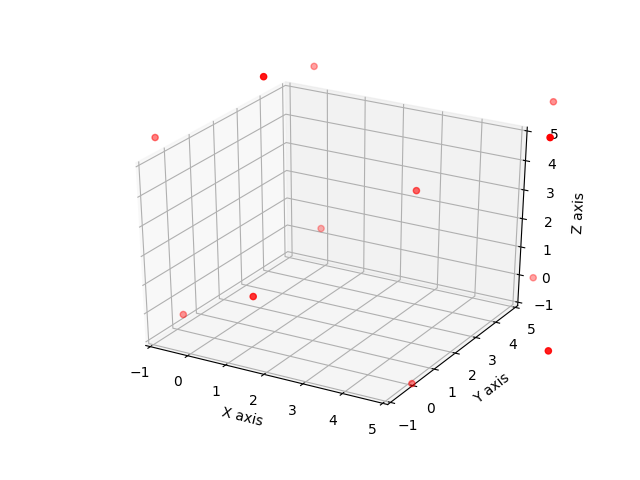

shape = 3
[-2.6120651020715444, -2.6120651020715453, -2.6120651020715453]
[-3.0550071335299616, -3.0550071335299616, 3.3333333333333335]
[-2.6120651020715453, -2.6120651020715453, 9.278731768738211]
[-3.0550071335299616, 3.3333333333333335, -3.0550071335299616]
[-3.6248632939653462, 3.3333333333333335, 3.3333333333333335]
[-3.0550071335299616, 3.3333333333333335, 9.72167380019663]
[-2.6120651020715453, 9.278731768738211, -2.6120651020715453]
[-3.0550071335299616, 9.72167380019663, 3.3333333333333335]
[-2.6120651020715453, 9.278731768738211, 9.278731768738211]
[3.3333333333333335, -3.0550071335299616, -3.0550071335299616]
[3.3333333333333335, -3.6248632939653462, 3.3333333333333335]
[3.3333333333333335, -3.0550071335299616, 9.72167380019663]
[3.3333333333333335, 3.3333333333333335, -3.6248632939653462]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.291529960632017]
[3.3333333333333335, 9.72167380019663, -3.0550071335299616]
[3.33

<IPython.core.display.Javascript object>


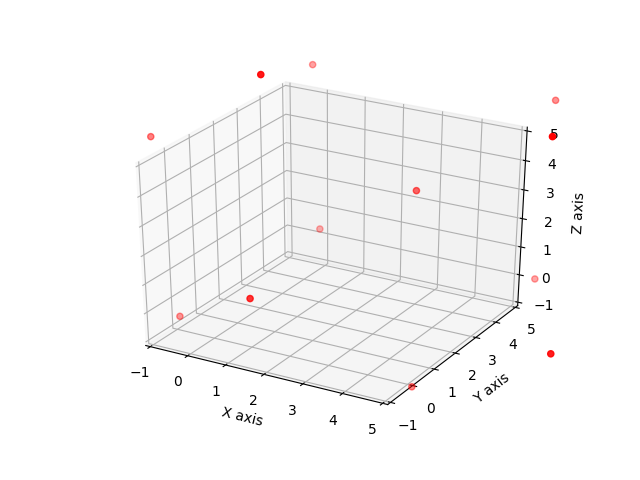

shape = 3
[-2.699612513888676, -2.699612513888677, -2.699612513888677]
[-3.1570530358397066, -3.1570530358397066, 3.3333333333333335]
[-2.699612513888677, -2.699612513888677, 9.366279180555344]
[-3.1570530358397066, 3.3333333333333335, -3.1570530358397066]
[-3.746254970889889, 3.3333333333333335, 3.3333333333333335]
[-3.1570530358397066, 3.3333333333333335, 9.823719702506375]
[-2.699612513888677, 9.366279180555344, -2.699612513888677]
[-3.1570530358397066, 9.823719702506375, 3.3333333333333335]
[-2.699612513888677, 9.366279180555344, 9.366279180555344]
[3.3333333333333335, -3.1570530358397066, -3.1570530358397066]
[3.3333333333333335, -3.746254970889889, 3.3333333333333335]
[3.3333333333333335, -3.1570530358397066, 9.823719702506375]
[3.3333333333333335, 3.3333333333333335, -3.746254970889889]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.41292163755656]
[3.3333333333333335, 9.823719702506375, -3.1570530358397066]
[3.3333333333

<IPython.core.display.Javascript object>


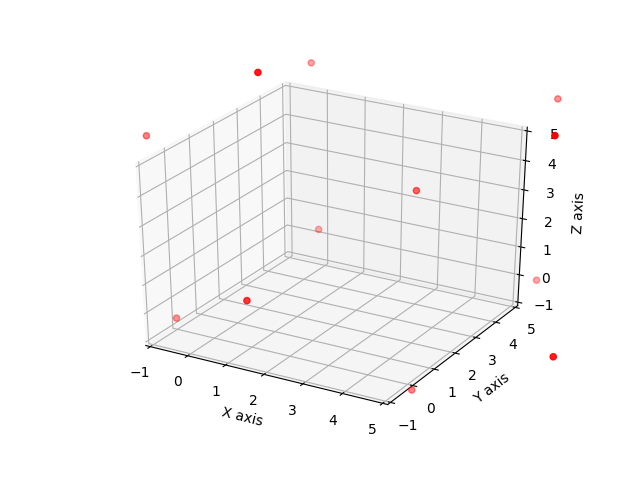

shape = 3
[-2.7879092469156155, -2.7879092469156164, -2.7879092469156164]
[-3.259961921977447, -3.259961921977447, 3.3333333333333335]
[-2.7879092469156164, -2.7879092469156164, 9.454575913582284]
[-3.259961921977447, 3.3333333333333335, -3.259961921977447]
[-3.8686900180788912, 3.3333333333333335, 3.3333333333333335]
[-3.259961921977447, 3.3333333333333335, 9.926628588644116]
[-2.7879092469156164, 9.454575913582284, -2.7879092469156164]
[-3.259961921977447, 9.926628588644116, 3.3333333333333335]
[-2.7879092469156164, 9.454575913582284, 9.454575913582284]
[3.3333333333333335, -3.259961921977447, -3.259961921977447]
[3.3333333333333335, -3.8686900180788912, 3.3333333333333335]
[3.3333333333333335, -3.259961921977447, 9.926628588644116]
[3.3333333333333335, 3.3333333333333335, -3.8686900180788912]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.535356684745562]
[3.3333333333333335, 9.926628588644116, -3.259961921977447]
[3.33333333

<IPython.core.display.Javascript object>


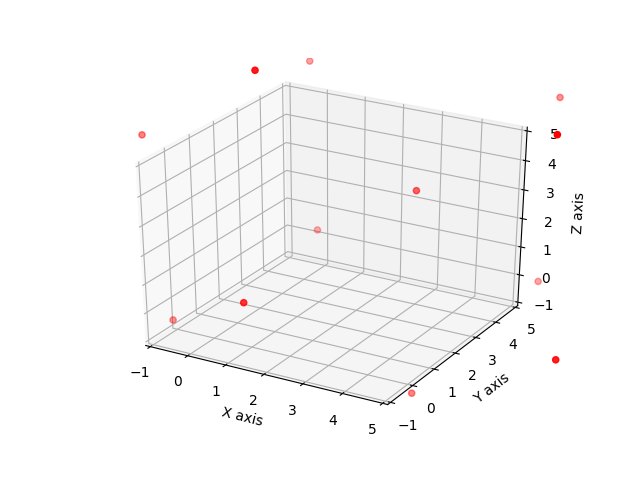

shape = 3
[-2.8769323760791052, -2.876932376079106, -2.876932376079106]
[-3.36370737840164, -3.36370737840164, 3.3333333333333335]
[-2.876932376079106, -2.876932376079106, 9.543599042745774]
[-3.36370737840164, 3.3333333333333335, -3.36370737840164]
[-3.9921370778007828, 3.3333333333333335, 3.3333333333333335]
[-3.36370737840164, 3.3333333333333335, 10.030374045068308]
[-2.876932376079106, 9.543599042745774, -2.876932376079106]
[-3.36370737840164, 10.030374045068308, 3.3333333333333335]
[-2.876932376079106, 9.543599042745774, 9.543599042745774]
[3.3333333333333335, -3.36370737840164, -3.36370737840164]
[3.3333333333333335, -3.9921370778007828, 3.3333333333333335]
[3.3333333333333335, -3.36370737840164, 10.030374045068308]
[3.3333333333333335, 3.3333333333333335, -3.9921370778007828]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.658803744467454]
[3.3333333333333335, 10.030374045068308, -3.36370737840164]
[3.3333333333333335, 10.

<IPython.core.display.Javascript object>


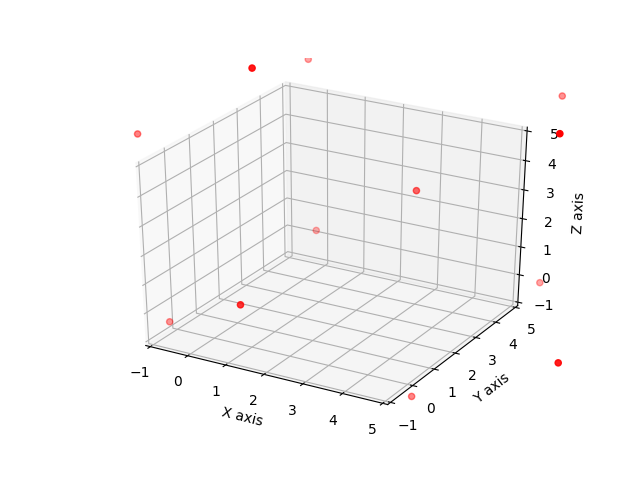

shape = 3
[-2.966659831577838, -2.966659831577839, -2.966659831577839]
[-3.468263986572232, -3.468263986572232, 3.3333333333333335]
[-2.966659831577839, -2.966659831577839, 9.633326498244507]
[-3.4682639865722313, 3.3333333333333335, -3.468263986572232]
[-4.116565953290085, 3.3333333333333335, 3.3333333333333335]
[-3.4682639865722313, 3.3333333333333335, 10.1349306532389]
[-2.966659831577839, 9.633326498244507, -2.966659831577839]
[-3.4682639865722313, 10.1349306532389, 3.3333333333333335]
[-2.966659831577839, 9.633326498244507, 9.633326498244507]
[3.3333333333333335, -3.468263986572232, -3.468263986572232]
[3.3333333333333335, -4.116565953290085, 3.3333333333333335]
[3.3333333333333335, -3.4682639865722313, 10.1349306532389]
[3.3333333333333335, 3.3333333333333335, -4.116565953290085]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.783232619956756]
[3.3333333333333335, 10.1349306532389, -3.468263986572232]
[3.3333333333333335, 1

<IPython.core.display.Javascript object>


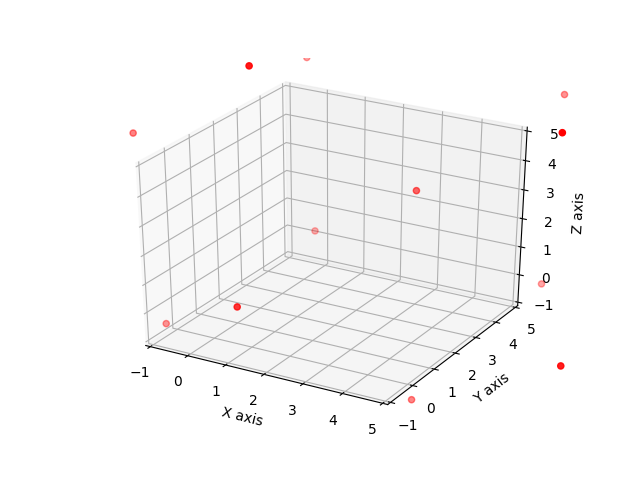

shape = 3
[-3.057070366728625, -3.057070366728626, -3.057070366728626]
[-3.573607284431727, -3.573607284431727, 3.3333333333333335]
[-3.057070366728626, -3.057070366728626, 9.723737033395293]
[-3.5736072844317266, 3.3333333333333335, -3.573607284431727]
[-4.2419475646156, 3.3333333333333335, 3.3333333333333335]
[-3.5736072844317266, 3.3333333333333335, 10.240273951098395]
[-3.057070366728626, 9.723737033395293, -3.057070366728626]
[-3.5736072844317266, 10.240273951098395, 3.3333333333333335]
[-3.057070366728626, 9.723737033395293, 9.723737033395293]
[3.3333333333333335, -3.573607284431727, -3.573607284431727]
[3.3333333333333335, -4.2419475646156, 3.3333333333333335]
[3.3333333333333335, -3.5736072844317266, 10.240273951098395]
[3.3333333333333335, 3.3333333333333335, -4.2419475646156]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 10.908614231282272]
[3.3333333333333335, 10.240273951098395, -3.573607284431727]
[3.3333333333333335,

<IPython.core.display.Javascript object>


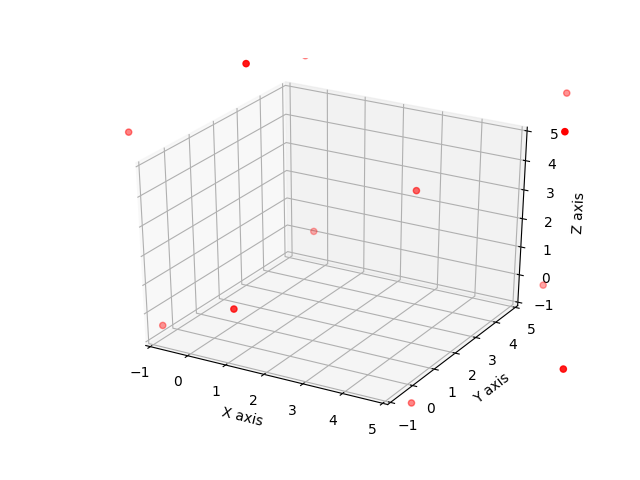

shape = 3
[-3.1481435265606335, -3.1481435265606343, -3.1481435265606343]
[-3.679713728914546, -3.679713728914546, 3.3333333333333335]
[-3.1481435265606343, -3.1481435265606343, 9.814810193227302]
[-3.679713728914545, 3.3333333333333335, -3.679713728914546]
[-4.368253905690786, 3.3333333333333335, 3.3333333333333335]
[-3.679713728914545, 3.3333333333333335, 10.346380395581214]
[-3.1481435265606343, 9.814810193227302, -3.1481435265606343]
[-3.679713728914545, 10.346380395581214, 3.3333333333333335]
[-3.1481435265606343, 9.814810193227302, 9.814810193227302]
[3.3333333333333335, -3.679713728914546, -3.679713728914546]
[3.3333333333333335, -4.368253905690786, 3.3333333333333335]
[3.3333333333333335, -3.679713728914545, 10.346380395581214]
[3.3333333333333335, 3.3333333333333335, -4.368253905690786]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.034920572357457]
[3.3333333333333335, 10.346380395581214, -3.679713728914546]
[3.3333333

<IPython.core.display.Javascript object>


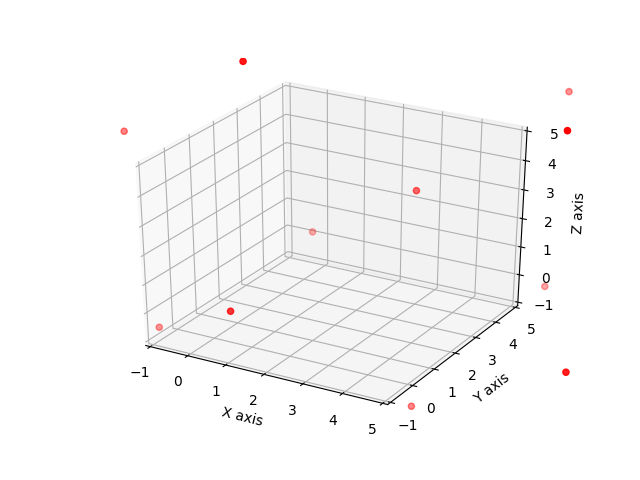

shape = 3
[-3.239859617220318, -3.239859617220319, -3.239859617220319]
[-3.7865606595410086, -3.7865606595410086, 3.3333333333333335]
[-3.239859617220319, -3.239859617220319, 9.906526283886986]
[-3.7865606595410077, 3.3333333333333335, -3.7865606595410086]
[-4.4954580024925965, 3.3333333333333335, 3.3333333333333335]
[-3.7865606595410077, 3.3333333333333335, 10.453227326207676]
[-3.239859617220319, 9.906526283886986, -3.239859617220319]
[-3.7865606595410077, 10.453227326207676, 3.3333333333333335]
[-3.239859617220319, 9.906526283886986, 9.906526283886986]
[3.3333333333333335, -3.7865606595410086, -3.7865606595410086]
[3.3333333333333335, -4.4954580024925965, 3.3333333333333335]
[3.3333333333333335, -3.7865606595410077, 10.453227326207676]
[3.3333333333333335, 3.3333333333333335, -4.4954580024925965]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.162124669159269]
[3.3333333333333335, 10.453227326207676, -3.7865606595410086]
[3.33

<IPython.core.display.Javascript object>


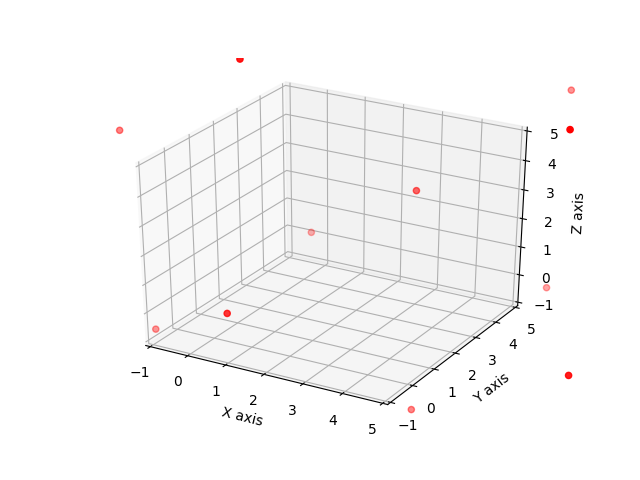

shape = 3
[-3.332199676234623, -3.332199676234624, -3.332199676234624]
[-3.894126263136108, -3.894126263136108, 3.3333333333333335]
[-3.332199676234624, -3.332199676234624, 9.998866342901291]
[-3.894126263136107, 3.3333333333333335, -3.894126263136108]
[-4.623533872536752, 3.3333333333333335, 3.3333333333333335]
[-3.894126263136107, 3.3333333333333335, 10.560792929802776]
[-3.332199676234624, 9.998866342901291, -3.332199676234624]
[-3.894126263136107, 10.560792929802776, 3.3333333333333335]
[-3.332199676234624, 9.998866342901291, 9.998866342901291]
[3.3333333333333335, -3.894126263136108, -3.894126263136108]
[3.3333333333333335, -4.623533872536752, 3.3333333333333335]
[3.3333333333333335, -3.894126263136107, 10.560792929802776]
[3.3333333333333335, 3.3333333333333335, -4.623533872536752]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.290200539203424]
[3.3333333333333335, 10.560792929802776, -3.894126263136108]
[3.333333333333333

<IPython.core.display.Javascript object>


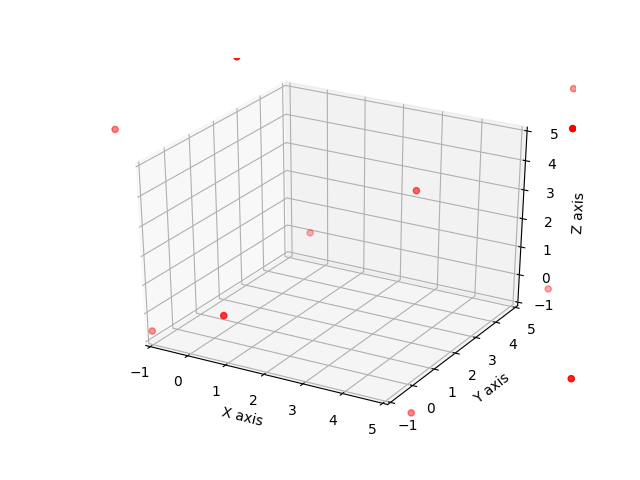

shape = 3
[-3.4251454436670423, -3.425145443667043, -3.425145443667043]
[-4.002389539699402, -4.002389539699402, 3.3333333333333335]
[-3.425145443667043, -3.425145443667043, 10.09181211033371]
[-4.002389539699401, 3.3333333333333335, -4.002389539699402]
[-4.752456485641665, 3.3333333333333335, 3.3333333333333335]
[-4.002389539699401, 3.3333333333333335, 10.66905620636607]
[-3.425145443667043, 10.09181211033371, -3.425145443667043]
[-4.002389539699401, 10.66905620636607, 3.3333333333333335]
[-3.425145443667043, 10.09181211033371, 10.09181211033371]
[3.3333333333333335, -4.002389539699402, -4.002389539699402]
[3.3333333333333335, -4.752456485641665, 3.3333333333333335]
[3.3333333333333335, -4.002389539699401, 10.66905620636607]
[3.3333333333333335, 3.3333333333333335, -4.752456485641665]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.419123152308337]
[3.3333333333333335, 10.66905620636607, -4.002389539699402]
[3.3333333333333335, 

<IPython.core.display.Javascript object>


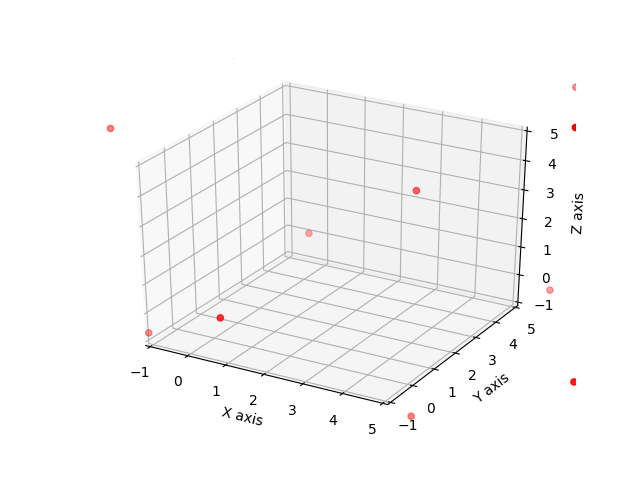

shape = 3
[-3.5186793341899856, -3.5186793341899865, -3.5186793341899865]
[-4.111330269440606, -4.111330269440606, 3.3333333333333335]
[-3.5186793341899865, -3.5186793341899865, 10.185346000856653]
[-4.1113302694406055, 3.3333333333333335, -4.111330269440606]
[-4.882201725999926, 3.3333333333333335, 3.3333333333333335]
[-4.1113302694406055, 3.3333333333333335, 10.777996936107275]
[-3.5186793341899865, 10.185346000856653, -3.5186793341899865]
[-4.1113302694406055, 10.777996936107275, 3.3333333333333335]
[-3.5186793341899865, 10.185346000856653, 10.185346000856653]
[3.3333333333333335, -4.111330269440606, -4.111330269440606]
[3.3333333333333335, -4.882201725999926, 3.3333333333333335]
[3.3333333333333335, -4.1113302694406055, 10.777996936107275]
[3.3333333333333335, 3.3333333333333335, -4.882201725999926]
[3.3333333333333335, 3.3333333333333335, 3.3333333333333335]
[3.3333333333333335, 3.3333333333333335, 11.548868392666598]
[3.3333333333333335, 10.777996936107275, -4.111330269440606]
[3

In [23]:
test_load()